In [2]:
#Import Libraries
import pandas as pd
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
from folium.plugins import HeatMap
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import geopandas as gpd
from shapely.geometry import Polygon
from shapely.geometry import Polygon
#from ydata_profiling import ProfileReport
import seaborn as sns
#import prince
import warnings
warnings.filterwarnings('ignore')



## Loading & Exploring the DataFrame


In [3]:
# Load CSV file
accidentes_df = pd.read_csv('./Traffic_Collision_Data.csv')

# Explore the data
print(accidentes_df.head())
print(accidentes_df.info())

              X             Y       ID    Geo_ID Accident_Date Accident_Time  \
0 -8.423750e+06  5.682143e+06  2017--1      7208    2017/01/01         11:41   
1 -8.432028e+06  5.678158e+06  2017--2      3209    2017/01/01         21:40   
2 -8.415138e+06  5.692987e+06  2017--3  __3ZA705    2017/01/01       Unknown   
3 -8.404413e+06  5.696539e+06  2017--4  __3ZBN8Z    2017/01/01         19:29   
4 -8.425097e+06  5.686654e+06  2017--5  __3ZA2YS    2017/01/01          0:15   

                                            Location Location_Type  \
0         BANK ST @ BELANGER AVE/LAMIRA ST (0007208)  Intersection   
1                BASELINE RD @ ERINDALE DR (0003209)  Intersection   
2  EASTVALE DR btwn LOYOLA AVE & OGILVIE RD (__3Z...      Midblock   
3                           HATFIELD CRES (__3ZBN8Z)      Midblock   
4  HIGHWAY 417 btwn HWY417 IC118 RAMP76 & HWY417 ...      Midblock   

  Classification_of_Accident          Initial_Impact_Type  ...  \
0             03 - P.D. only    

In [4]:
accidentes_df.head().transpose()

,0,1,2,3,4
X,-8423750.022707,-8432028.48143,-8415137.710152,-8404413.341803,-8425097.03196
Y,5682142.694147,5678158.104089,5692986.778151,5696539.217891,5686653.515731
ID,2017--1,2017--2,2017--3,2017--4,2017--5
Geo_ID,7208,3209,__3ZA705,__3ZBN8Z,__3ZA2YS
Accident_Date,2017/01/01,2017/01/01,2017/01/01,2017/01/01,2017/01/01
Accident_Time,11:41,21:40,Unknown,19:29,0:15
Location,BANK ST @ BELANGER AVE/LAMIRA ST (0007208),BASELINE RD @ ERINDALE DR (0003209),EASTVALE DR btwn LOYOLA AVE & OGILVIE RD (__3Z...,HATFIELD CRES (__3ZBN8Z),HIGHWAY 417 btwn HWY417 IC118 RAMP76 & HWY417 ...
Location_Type,Intersection,Intersection,Midblock,Midblock,Midblock
Classification_of_Accident,03 - P.D. only,03 - P.D. only,03 - P.D. only,03 - P.D. only,03 - P.D. only
Initial_Impact_Type,99 - Other,07 - SMV other,06 - SMV unattended vehicle,06 - SMV unattended vehicle,04 - Sideswipe


In [5]:
# Combine 'Accident_Date' and 'Accident_Time' into a datetime column
accidentes_df['Combined_DateTime'] = pd.to_datetime(accidentes_df['Accident_Date'] + ' ' + accidentes_df['Accident_Time'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
# Drop the original 'Accident_Date' and 'Accident_Time'
accidentes_df = accidentes_df.drop(['Accident_Date', 'Accident_Time'], axis=1)

accidentes_df.tail().transpose()

,71043,71044,71045,71046,71047
X,-8425233.138962,-8418363.457338,-8431889.170654,-8388720.539678,-8459970.930417
Y,5687932.266405,5688306.18767,5681406.445191,5674553.761365,5665546.383848
ID,2022--71044,2022--71045,2022--71046,2022--71047,2022--71048
Geo_ID,7135,__3ZA280,__3ZA2R5,__3ZA2W2,__3ZA2Q2
Location,QUEEN ELIZABETH DRWY @ SOMERSET ST (0007135),HIGHWAY 417 btwn HWY417 IC113 RAMP62 & REGIONA...,HIGHWAY 417 btwn HWY417 IC124 RAMP57 & HWY417 ...,HIGHWAY 417 btwn HWY417 IC88 RAMP51 & RAMP (__...,HIGHWAY 417 btwn HWY417 IC145 RAMP56 & HWY417 ...
Location_Type,Intersection,Midblock,Midblock,Midblock,Midblock
Classification_of_Accident,02 - Non-fatal injury,02 - Non-fatal injury,02 - Non-fatal injury,02 - Non-fatal injury,02 - Non-fatal injury
Initial_Impact_Type,02 - Angle,07 - SMV other,03 - Rear end,03 - Rear end,07 - SMV other
Road_Surface_Condition,01 - Dry,02 - Wet,01 - Dry,05 - Packed snow,06 - Ice
Environment_Condition,01 - Clear,01 - Clear,01 - Clear,05 - Drifting Snow,01 - Clear


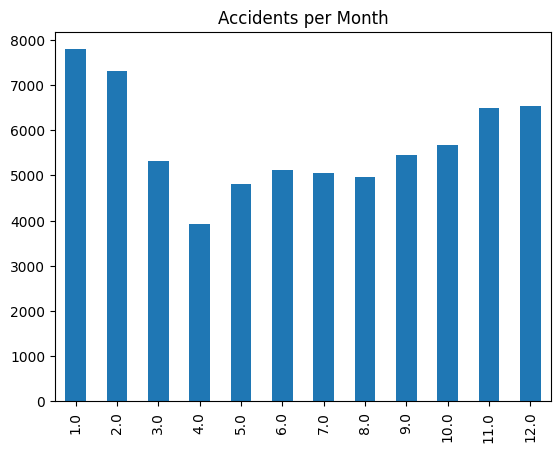

In [6]:
# Perform EDA, analyze distributions, and visualize patterns
accidentes_df['Combined_DateTime'].dt.month.value_counts().sort_index().plot(kind='bar')
plt.title('Accidents per Month')
plt.show()


In [7]:
accidentes_df.columns

Index(['X', 'Y', 'ID', 'Geo_ID', 'Location', 'Location_Type',
       'Classification_of_Accident', 'Initial_Impact_Type',
       'Road_Surface_Condition', 'Environment_Condition', 'Light',
       'Traffic_Control', 'Num_of_Vehicle', 'Num_of_Bicycles',
       'Num_of_Motorcycles', 'Max_Injury', 'Num_of_Injuries',
       'Num_of_Minimal_Injuries', 'Num_of_Minor_Injuries',
       'Num_of_Major_Injuries', 'Num_of_Fatal_Injuries', 'X_Coordinate',
       'Y_Coordinate', 'Lat', 'Long', 'ObjectId', 'Combined_DateTime'],
      dtype='object')

In [8]:
#  Create new features //Seasons(Summer,Winter,Spring,Fall) , Time Frame (Morning, Afternoon, Evening, Night)
accidentes_df['DayOfWeek'] = accidentes_df['Combined_DateTime'].dt.dayofweek
accidentes_df['IsWeekend'] = (accidentes_df['DayOfWeek'] >= 5).astype(int)
accidentes_df['Season'] = accidentes_df['Combined_DateTime'].dt.month.apply(lambda x: 'Winter' if x in [12, 1, 2] else 'Spring' if x in [3, 4, 5] else 'Summer' if x in [6, 7, 8] else 'Fall')
accidentes_df['TimeFrame'] = accidentes_df['Combined_DateTime'].dt.hour.apply(lambda x: 'Morning' if x in [6, 7, 8, 9, 10, 11] else 'Afternoon' if x in [12, 13, 14, 15, 16, 17] else 'Evening' if x in [18, 19, 20, 21, 22, 23] else 'Night')
accidentes_df['Year'] = accidentes_df['Combined_DateTime'].dt.year.astype(str)
accidentes_df['Month'] = accidentes_df['Combined_DateTime'].dt.month.astype(str)

In [9]:
# Adjust DayofWeek and IsWeekend Data type
accidentes_df['DayOfWeek'] = accidentes_df['DayOfWeek'].astype(str)
accidentes_df['IsWeekend'] = accidentes_df['IsWeekend'].astype(str)

In [10]:
# Select relevant variables for the df
accidentes_df = accidentes_df[['Combined_DateTime',
 'Location_Type',
 'Num_of_Injuries',
 'Initial_Impact_Type',
 'Road_Surface_Condition',
 'Environment_Condition',
 'Light',
 'Lat',
 'Long',
 'DayOfWeek',
 'IsWeekend',
 'Season',
 'TimeFrame']].copy()

In [11]:
#Transforme NaN to 0 in Num of injuries
accidentes_df['Num_of_Injuries'] = accidentes_df['Num_of_Injuries'].fillna(0)

## Grids definition


In [12]:
import shapely.geometry as sg

# Create a dictionary to store the code for each grid cell
grid_data = {}
next_code = 1  # Initialize the code counter

# Function to assign a code to a grid cell and return both code and polygon
def assign_grid_info(lat, lon, grid_size):
    global next_code
    lat_grid = int(lat / grid_size) * grid_size
    lon_grid = int(lon / grid_size) * grid_size
    grid_key = (lat_grid, lon_grid)

    if grid_key not in grid_data:
        grid_data[grid_key] = {
            'Grid': f"Grid_{next_code}",
            'Polygon': sg.box(lon_grid, lat_grid, lon_grid + grid_size, lat_grid + grid_size)
        }
        next_code += 1

    return grid_data[grid_key]['Grid'], grid_data[grid_key]['Polygon']

# Set the grid size (800m in this use case)
grid_size = 0.008

# Apply the function to each data point
accidentes_df['Grid'], accidentes_df['Polygon'] = zip(*[
    assign_grid_info(lat, lon, grid_size) for lat, lon in zip(accidentes_df['Lat'], accidentes_df['Long'])
])


In [ ]:
# Extract the values from the inner dictionaries
values = list(grid_data.values())

# Convert the list of dictionaries to a DataFrame
grid_polygon = pd.DataFrame(values)

# Display the transposed DataFrame
grid_polygon.head()

In [14]:
accidentes_df.tail()

,Combined_DateTime,Location_Type,Num_of_Injuries,Initial_Impact_Type,Road_Surface_Condition,Environment_Condition,Light,Lat,Long,DayOfWeek,IsWeekend,Season,TimeFrame,Grid,Polygon
71043,2022-12-17 21:00:00,Intersection,1.0,02 - Angle,01 - Dry,01 - Clear,07 - Dark,45.420292,-75.685157,5.0,1,Winter,Evening,Grid_136,POLYGON ((-75.67200000000001 45.41600000000000...
71044,2022-12-19 08:40:00,Midblock,1.0,07 - SMV other,02 - Wet,01 - Clear,01 - Daylight,45.422649,-75.623446,0.0,0,Winter,Morning,Grid_348,"POLYGON ((-75.608 45.416000000000004, -75.608 ..."
71045,2022-12-22 14:48:00,Midblock,1.0,03 - Rear end,01 - Dry,01 - Clear,01 - Daylight,45.379129,-75.744949,3.0,0,Winter,Afternoon,Grid_167,"POLYGON ((-75.736 45.376, -75.736 45.384, -75...."
71046,2022-12-24 12:45:00,Midblock,2.0,03 - Rear end,05 - Packed snow,05 - Drifting Snow,01 - Daylight,45.335873,-75.357159,5.0,1,Winter,Afternoon,Grid_2235,"POLYGON ((-75.34400000000001 45.328, -75.34400..."
71047,2022-12-25 09:16:00,Midblock,1.0,07 - SMV other,06 - Ice,01 - Clear,01 - Daylight,45.278966,-75.997212,6.0,1,Winter,Morning,Grid_756,"POLYGON ((-75.98400000000001 45.272, -75.98400..."


In [31]:
accidentes_df.to_csv('accidentes_df.csv')

## Grids Exploration and Clustering

In [15]:
#Create a df with the total injuries for grid
total_injuries_grid = accidentes_df.groupby('Grid')['Num_of_Injuries'].sum().rename('Total Injuries').reset_index(drop=False)
total_injuries_grid.describe()

,Total Injuries
count,2413.000000
mean,7.154994
std,16.779123
min,0.000000
25%,0.000000
50%,1.000000
75%,5.000000
max,183.000000


In [16]:
#Create a df with total amout of accidents by grid
total_accidents_grid = accidentes_df.groupby('Grid')['Grid'].value_counts().rename('Total Accidents').reset_index(level=1, drop=True).reset_index()
total_accidents_grid.describe()

,Total Accidents
count,2413.000000
mean,29.443846
std,75.459405
min,1.000000
25%,2.000000
50%,4.000000
75%,18.000000
max,1195.000000


In [17]:
#Combine Total Accidents and injuries in one df
Total_injuries_accidents = pd.merge(total_injuries_grid,total_accidents_grid, how='left')
Total_injuries_accidents.describe()

,Total Injuries,Total Accidents
count,2413.000000,2413.000000
mean,7.154994,29.443846
std,16.779123,75.459405
min,0.000000,1.000000
25%,0.000000,2.000000
50%,1.000000,4.000000
75%,5.000000,18.000000
max,183.000000,1195.000000


<Axes: xlabel='Total Accidents', ylabel='Total Injuries'>

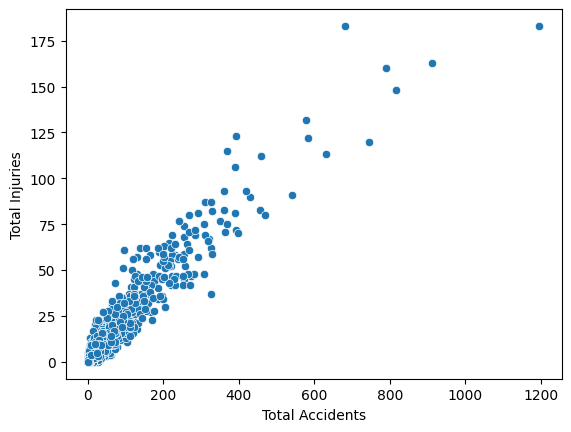

In [18]:
# Scatter plot between Accident and injuries
sns.scatterplot(Total_injuries_accidents, x='Total Accidents', y='Total Injuries')

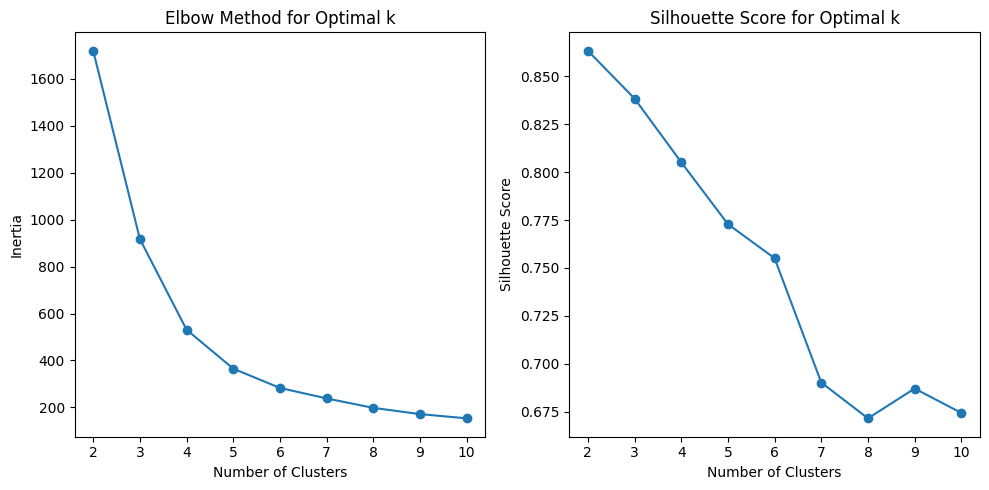

In [19]:
# Lets clusterize the Grids by total accidents and total injuries using kmeans
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# New df for the clustering
data = Total_injuries_accidents[['Total Injuries', 'Total Accidents']]

# Normalize the data using StandardScaler
scaler = StandardScaler()
normalized_data = scaler.fit_transform(data)

# Find the optimal number of clusters using the elbow method
inertia = []
silhouette_scores = []
max_clusters = 10

for n_clusters in range(2, max_clusters + 1):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(normalized_data)

    # Elbow method: Sum of squared distances to the nearest cluster center
    inertia.append(kmeans.inertia_)

    # Silhouette score
    silhouette_scores.append(silhouette_score(normalized_data, kmeans.labels_))

# Plot the elbow curve
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(range(2, max_clusters + 1), inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')

# Plot the silhouette scores
plt.subplot(1, 2, 2)
plt.plot(range(2, max_clusters + 1), silhouette_scores, marker='o')
plt.title('Silhouette Score for Optimal k')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')

plt.tight_layout()
plt.show()




In [20]:
# Based on the plots, choose the optimal number of clusters (k)
optimal_k = 5

# Perform k-means clustering with the chosen k
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
Total_injuries_accidents['Cluster'] = kmeans.fit_predict(normalized_data)

# Display the resulting DataFrame with the assigned clusters
print(Total_injuries_accidents)

           Grid  Total Injuries  Total Accidents  Cluster
0        Grid_1           123.0              393        2
1       Grid_10           106.0              391        2
2      Grid_100            36.0              122        3
3     Grid_1000             0.0                2        0
4     Grid_1001             5.0               19        0
...         ...             ...              ...      ...
2408   Grid_995             3.0               27        0
2409   Grid_996             0.0                1        0
2410   Grid_997             4.0                8        0
2411   Grid_998             5.0               25        0
2412   Grid_999            10.0               18        0

[2413 rows x 4 columns]


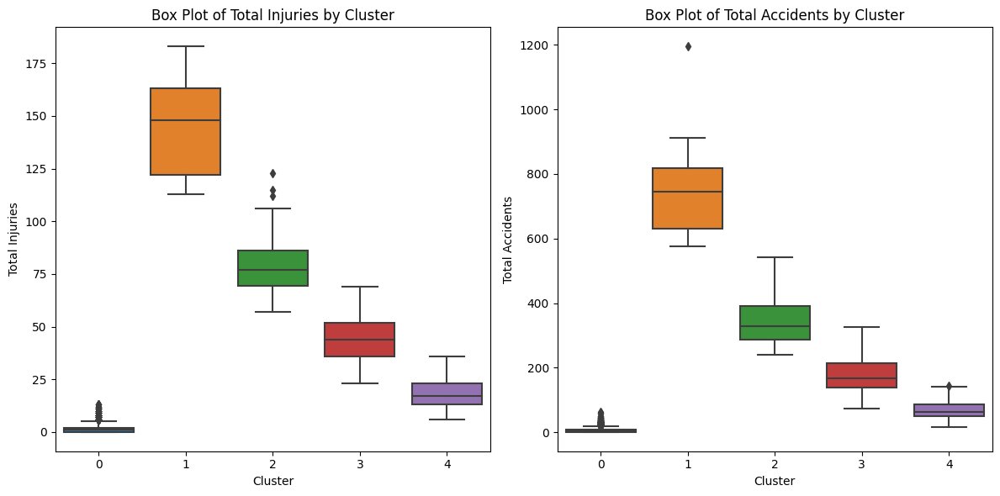

In [21]:
# Plot box plots for 'Total Injuries' and 'Total Accidents' with respect to clusters

plt.figure(figsize=(12, 6))

# Box plot for Total Injuries
plt.subplot(1, 2, 1)
sns.boxplot(x='Cluster', y='Total Injuries', data=Total_injuries_accidents)
plt.title('Box Plot of Total Injuries by Cluster')

# Box plot for Total Accidents
plt.subplot(1, 2, 2)
sns.boxplot(x='Cluster', y='Total Accidents', data=Total_injuries_accidents)
plt.title('Box Plot of Total Accidents by Cluster')

plt.tight_layout()
plt.show()


In [22]:
#Check grids per cluster
Total_injuries_accidents['Cluster'].value_counts()

0    1996
4     252
3     118
2      38
1       9
Name: Cluster, dtype: int64

In [23]:
#Update Cluster with a propper name
cluster_mapping = {0: 'Rare', 3: 'Low', 1: 'Moderate', 4: 'High', 2: 'Critical'}

# Update the 'Cluster' column based on the mapping
Total_injuries_accidents['Cluster'] = Total_injuries_accidents['Cluster'].replace(cluster_mapping)

# Display the updated DataFrame
print(Total_injuries_accidents)

           Grid  Total Injuries  Total Accidents   Cluster
0        Grid_1           123.0              393  Critical
1       Grid_10           106.0              391  Critical
2      Grid_100            36.0              122       Low
3     Grid_1000             0.0                2      Rare
4     Grid_1001             5.0               19      Rare
...         ...             ...              ...       ...
2408   Grid_995             3.0               27      Rare
2409   Grid_996             0.0                1      Rare
2410   Grid_997             4.0                8      Rare
2411   Grid_998             5.0               25      Rare
2412   Grid_999            10.0               18      Rare

[2413 rows x 4 columns]


In [24]:
# Calculate centroids for each grid
grid_centroids = accidentes_df.groupby('Grid')[['Lat', 'Long']].mean().reset_index()
grid_centroids

,Grid,Lat,Long
0,Grid_1,45.379322,-75.668318
1,Grid_10,45.428536,-75.661966
2,Grid_100,45.337665,-75.717995
3,Grid_1000,45.142287,-75.963943
4,Grid_1001,45.443480,-75.622016
...,...,...,...
2408,Grid_995,45.477153,-75.507930
2409,Grid_996,45.201200,-75.454794
2410,Grid_997,45.524213,-75.337446
2411,Grid_998,45.314456,-75.589526


In [25]:
#Merge Dataframes to have a master with all the grid data
grid_master_df = pd.merge(Total_injuries_accidents,grid_centroids, how='left' )
grid_master_df = pd.merge(grid_master_df, grid_polygon, how='left', on='Grid')

In [26]:
# Save grid and its centroid coordinates , total injuries, total accidents and cluster to a CSV file

grid_master_df.to_csv('grid_master.csv', index=False)

In [27]:
# Display the merged DataFrame
grid_master_df.head()

,Grid,Total Injuries,Total Accidents,Cluster,Lat,Long,Polygon
0,Grid_1,123.0,393,Critical,45.379322,-75.668318,"POLYGON ((-75.656 45.376, -75.656 45.384, -75...."
1,Grid_10,106.0,391,Critical,45.428536,-75.661966,"POLYGON ((-75.64800000000001 45.424, -75.64800..."
2,Grid_100,36.0,122,Low,45.337665,-75.717995,"POLYGON ((-75.70400000000001 45.336, -75.70400..."
3,Grid_1000,0.0,2,Rare,45.142287,-75.963943,"POLYGON ((-75.95200000000001 45.136, -75.95200..."
4,Grid_1001,5.0,19,Rare,45.443480,-75.622016,"POLYGON ((-75.608 45.44, -75.608 45.448, -75.6..."


<Axes: xlabel='Total Accidents', ylabel='Total Injuries'>

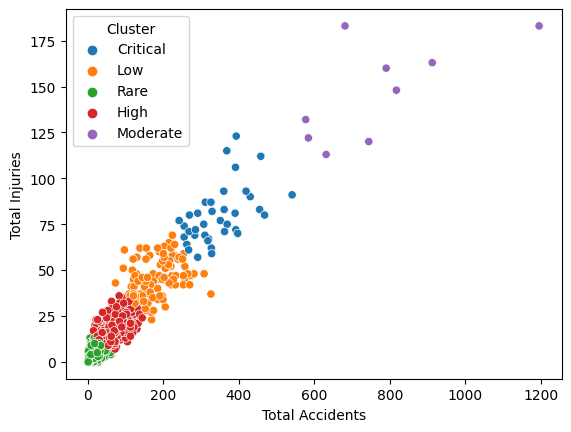

In [28]:
#Explore scatter plot to check clustering distribution
sns.scatterplot(grid_master_df, x='Total Accidents', y='Total Injuries', hue='Cluster')

In [33]:
import folium

# Assuming grid_master_df is your DataFrame with the necessary columns
# grid_master_df = ...

# Create a folium Map centered at a certain location (you can adjust the coordinates)
m = folium.Map(location=[grid_master_df['Lat'].mean(), grid_master_df['Long'].mean()], zoom_start=12)

# Define a color mapping for clusters
cluster_mapping = {'Rare': 'gray', 'Low': 'B8DAD9', 'Moderate': 'yellow', 'High': 'orange', 'Critical': 'red'}

# Iterate through rows and add polygons with popups
for index, row in grid_master_df.iterrows():
    # Set the color based on the 'cluster'
    color = cluster_mapping.get(row['Cluster'], 'gray')

    # Create a Popup with the total accidents
    popup_content = f"Grid: {row['Grid']}<br>Cluster: {row['Cluster']}<br>Total Accidents: {row['Total Accidents']}"
    popup = folium.Popup(popup_content, max_width=600)

    # Add GeoJson with tooltip and style
    folium.GeoJson(
        row['Polygon'],
        name=row['Grid'],
        style_function=lambda x, color=color: {'fillColor': color, 'color': color, 'weight': 1, 'fillOpacity': 0.3},
        tooltip=f"{row['Total Accidents']} Accidents",
        highlight_function=lambda x: {'weight': 3, 'fillOpacity': 0.7},
        control=False,  # Disable default popup on click
        popup=popup
    ).add_to(m)

# Save the map to an HTML file or display it
m


In [34]:
m.save('grids_map.html')

In [46]:
accidentes_df.head()

,Combined_DateTime,Location_Type,Num_of_Injuries,Initial_Impact_Type,Road_Surface_Condition,Environment_Condition,Light,Lat,Long,DayOfWeek,IsWeekend,Season,TimeFrame,Grid,Polygon
0,2017-01-01 11:41:00,Intersection,0.0,99 - Other,02 - Wet,01 - Clear,01 - Daylight,45.383775,-75.671834,6.0,1,Winter,Morning,Grid_1,"POLYGON ((-75.656 45.376, -75.656 45.384, -75...."
1,2017-01-01 21:40:00,Intersection,0.0,07 - SMV other,02 - Wet,01 - Clear,07 - Dark,45.358629,-75.746201,6.0,1,Winter,Evening,Grid_2,"POLYGON ((-75.736 45.352000000000004, -75.736 ..."
2,NaT,Midblock,0.0,06 - SMV unattended vehicle,04 - Slush,03 - Snow,00 - Unknown,45.452153,-75.594468,nan,0,Fall,Night,Grid_3,"POLYGON ((-75.584 45.448, -75.584 45.456, -75...."
3,2017-01-01 19:29:00,Midblock,0.0,06 - SMV unattended vehicle,03 - Loose snow,03 - Snow,07 - Dark,45.474535,-75.498130,6.0,1,Winter,Evening,Grid_4,"POLYGON ((-75.488 45.472, -75.488 45.480000000..."
4,2017-01-01 00:15:00,Midblock,0.0,04 - Sideswipe,03 - Loose snow,01 - Clear,07 - Dark,45.412228,-75.683934,6.0,1,Winter,Night,Grid_5,"POLYGON ((-75.67200000000001 45.408, -75.67200..."


## Date Modelling
Lets create a weekly model that is going to be performed by batches of clusters


### Initial DF
Transforming and cleaning dataframe for the model

In [47]:
# Group by Combined_DateTime, Grid,and count the occurrences
grouped_df = accidentes_df.groupby(['Combined_DateTime', 'Grid']).size().reset_index(name='TotalAccidents')
grouped_df.head()

,Combined_DateTime,Grid,TotalAccidents
0,2017-01-01 00:15:00,Grid_5,1
1,2017-01-01 01:28:00,Grid_13,1
2,2017-01-01 03:16:00,Grid_10,1
3,2017-01-01 07:17:00,Grid_11,1
4,2017-01-01 08:58:00,Grid_8,1


In [48]:
#Define df for the model and make the relevant changes : columns names, data type, etc
df_prophet = grouped_df[['Combined_DateTime', 'Grid', 'TotalAccidents']].copy()
df_prophet.columns = ['ds', 'grid', 'y']
df_prophet['ds'] = pd.to_datetime(df_prophet['ds'])
df_prophet['y'] = (df_prophet['y'] > 0).astype(int)

In [49]:
# Adjust the data frame to group by day and grid and sum the total accidents (ds is timestamp, y is the count)
df_prophet = df_prophet.groupby([df_prophet['ds'].dt.date, 'grid']).sum().reset_index()

In [50]:
df_prophet.tail()

,ds,grid,y
63613,2022-12-17,Grid_136,1
63614,2022-12-19,Grid_348,1
63615,2022-12-22,Grid_167,1
63616,2022-12-24,Grid_2235,1
63617,2022-12-25,Grid_756,1


In [51]:
# Functions to create regressors for the model

#Is Weekend
def is_weekend(ds):
    date = pd.to_datetime(ds)
    return int(date.weekday() >= 5)

#Day of Week
def day_of_week(ds):
    date = pd.to_datetime(ds)
    return date.weekday()

#Season
def season(ds):
    date = pd.to_datetime(ds)
    # Winter: 1; Spring: 2; Summer: 3; Fall: 4
    return '1' if date.month in [12, 1, 2] else '2' if date.month in [3, 4, 5] else '3' if date.month in [6, 7, 8] else '4'

#Week of Year
def week_of_year(ds):
    date = pd.to_datetime(ds)
    return date.week

def covid_season(ds):
    year = ds.year
    return 1 if year == 2022 or year == 2021 else 0


In [52]:
# Define a function to validate the model results

def custom_cross_validation(model, grid_data, initial='730 days', period='180 days', horizon='365 days'):
    # Perform cross-validation
    cv_results = cross_validation(model, initial=initial, period=period, horizon=horizon)

    # Calculate binary classification metrics for each fold
    metrics = {}
    for _, fold in cv_results.groupby('cutoff'):
        y_true = grid_data[grid_data['ds'].isin(fold['ds'])]['y']

        # Skip fold if it contains only one class
        if len(y_true.unique()) == 1:
            continue

        y_pred = (fold['yhat'] > 0.4).astype(int)  # Convert probabilities to binary predictions

        # Calculate metrics
        accuracy = accuracy_score(y_true, y_pred)
        precision = precision_score(y_true, y_pred)
        recall = recall_score(y_true, y_pred)
        f1 = f1_score(y_true, y_pred)
        roc_auc = roc_auc_score(y_true, fold['yhat'])

        metrics[_] = {
            'accuracy': accuracy,
            'precision': precision,
            'recall': recall,
            'f1': f1,
            'roc_auc': roc_auc
        }

    return metrics

### Weekly Data Model Transformation


In [53]:
# Adjust the data frame to group by week, grid and a boolean string for whether there was an accident or not (1 / 0)
# Convert 'ds' column to DatetimeIndex
df_prophet['ds'] = pd.to_datetime(df_prophet['ds'])
df_prophet_week = df_prophet.groupby([pd.Grouper(key='ds', freq='W'), 'grid']).sum().reset_index()
df_prophet_week['y'] = (df_prophet_week['y'] > 0).astype(int)
df_prophet_week.tail()


,ds,grid,y
50030,2022-12-18,Grid_362,1
50031,2022-12-25,Grid_167,1
50032,2022-12-25,Grid_2235,1
50033,2022-12-25,Grid_348,1
50034,2022-12-25,Grid_756,1


In [54]:
#Now lets create a full dataset with all the grids and all the weeks
import itertools

# Create a list of all the grids
all_grids = df_prophet_week['grid'].unique().tolist()

# Create a list of all the weeks
all_weeks = pd.date_range(start=df_prophet_week['ds'].min(), end=df_prophet_week['ds'].max(), freq='W').tolist()

In [55]:
# Create a DataFrame with all the combinations of grids and weeks
df_all_grids_weeks = pd.DataFrame(itertools.product(all_grids, all_weeks), columns=['grid', 'ds'])
df_all_grids_weeks.tail()

,grid,ds
749317,Grid_2413,2022-11-27
749318,Grid_2413,2022-12-04
749319,Grid_2413,2022-12-11
749320,Grid_2413,2022-12-18
749321,Grid_2413,2022-12-25


In [56]:
# Merge the two DataFrames to get the full dataset
df_prophet_week = pd.merge(df_all_grids_weeks, df_prophet_week, on=['grid', 'ds'], how='left')
# Print columns to check if 'y' is present
print(df_prophet_week.columns)

Index(['grid', 'ds', 'y'], dtype='object')


In [57]:
df_prophet_week.tail()

,grid,ds,y
749317,Grid_2413,2022-11-27,NaN
749318,Grid_2413,2022-12-04,NaN
749319,Grid_2413,2022-12-11,NaN
749320,Grid_2413,2022-12-18,NaN
749321,Grid_2413,2022-12-25,NaN


In [58]:
# Fill the missing values with 0
df_prophet_week['y'] = df_prophet_week['y'].fillna(0)

In [59]:
df_prophet_week.tail()

,grid,ds,y
749317,Grid_2413,2022-11-27,0.0
749318,Grid_2413,2022-12-04,0.0
749319,Grid_2413,2022-12-11,0.0
749320,Grid_2413,2022-12-18,0.0
749321,Grid_2413,2022-12-25,0.0


In [60]:
#Check the balance of the dataset
df_prophet_week['y'].value_counts()

0.0    699287
1.0     50035
Name: y, dtype: int64

In [61]:
# Apply more features to the dataset that will be use for the model as regressors

# Add Week Number
df_prophet_week['week'] = df_prophet_week['ds'].apply(week_of_year)

# Add Season
df_prophet_week['season'] = df_prophet_week['ds'].apply(season)


In [62]:
df_prophet_week.tail()

,grid,ds,y,week,season
749317,Grid_2413,2022-11-27,0.0,47,4
749318,Grid_2413,2022-12-04,0.0,48,1
749319,Grid_2413,2022-12-11,0.0,49,1
749320,Grid_2413,2022-12-18,0.0,50,1
749321,Grid_2413,2022-12-25,0.0,51,1


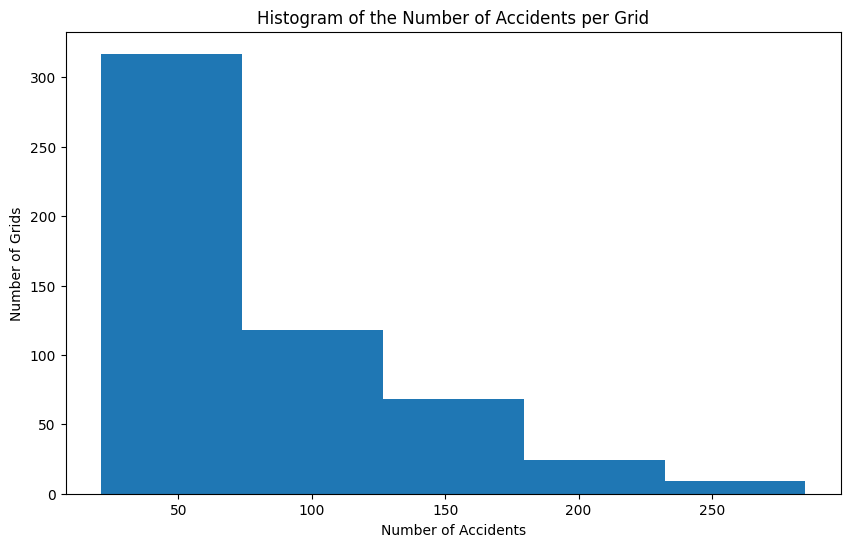

In [63]:
#plot histogram of the number of accidents per grid
plt.figure(figsize=(10, 6))
plt.hist(df_prophet_week.groupby('grid').sum()['y'][df_prophet_week.groupby('grid').sum()['y'] >  20], bins=5, label='Number of Accidents')
plt.xlabel('Number of Accidents')
plt.ylabel('Number of Grids')
plt.title('Histogram of the Number of Accidents per Grid')
plt.show()

#filtered_df.groupby('grid').sum()['y']

In [64]:
df_prophet_week.groupby('grid').sum()['y'].describe()

count    2394.000000
mean       20.900167
std        39.904478
min         1.000000
25%         2.000000
50%         4.000000
75%        17.000000
max       285.000000
Name: y, dtype: float64

In [65]:
grid_master_df.head()

,Grid,Total Injuries,Total Accidents,Cluster,Lat,Long,Polygon
0,Grid_1,123.0,393,Critical,45.379322,-75.668318,"POLYGON ((-75.656 45.376, -75.656 45.384, -75...."
1,Grid_10,106.0,391,Critical,45.428536,-75.661966,"POLYGON ((-75.64800000000001 45.424, -75.64800..."
2,Grid_100,36.0,122,Low,45.337665,-75.717995,"POLYGON ((-75.70400000000001 45.336, -75.70400..."
3,Grid_1000,0.0,2,Rare,45.142287,-75.963943,"POLYGON ((-75.95200000000001 45.136, -75.95200..."
4,Grid_1001,5.0,19,Rare,45.443480,-75.622016,"POLYGON ((-75.608 45.44, -75.608 45.448, -75.6..."


## Filtering Option

In [66]:
# Filtering by cluster
cluster = 'High'
#Merge clusters to the df
filtered_df = pd.merge(df_prophet_week, grid_master_df[['Grid', 'Cluster']], how='left', left_on='grid', right_on='Grid')

#Filter by desired cluster
filtered_df = filtered_df[filtered_df['Cluster'] == cluster]

filtered_df.tail()


,grid,ds,y,week,season,Grid,Cluster
410964,Grid_1299,2022-11-27,0.0,47,4,Grid_1299,High
410965,Grid_1299,2022-12-04,0.0,48,1,Grid_1299,High
410966,Grid_1299,2022-12-11,0.0,49,1,Grid_1299,High
410967,Grid_1299,2022-12-18,0.0,50,1,Grid_1299,High
410968,Grid_1299,2022-12-25,0.0,51,1,Grid_1299,High


In [67]:
filtered_df.head()

,grid,ds,y,week,season,Grid,Cluster
626,Grid_11,2017-01-01,1.0,52,1,Grid_11,High
627,Grid_11,2017-01-08,0.0,1,1,Grid_11,High
628,Grid_11,2017-01-15,0.0,2,1,Grid_11,High
629,Grid_11,2017-01-22,0.0,3,1,Grid_11,High
630,Grid_11,2017-01-29,0.0,4,1,Grid_11,High


In [68]:
#Filtering by total amount of accidents in last 5 years :::: Create a final dataset for the model to include only grids with more than N accident   N = 10
#N = 20  # Set your threshold
#filtered_df = df_prophet_week.groupby('grid').filter(lambda x: (x['y'] == 1).sum() >= N)


In [69]:
filtered_df.groupby('grid').sum()['y'].describe()

count    252.000000
mean      56.392857
std       20.253779
min       14.000000
25%       41.000000
50%       52.500000
75%       70.250000
max      112.000000
Name: y, dtype: float64

In [70]:
filtered_df['y'].value_counts()

0.0    64665
1.0    14211
Name: y, dtype: int64

### Weekly Model Execution

In [71]:
# Set the model  imports and initial variables
from prophet import Prophet
from sklearn.metrics import mean_absolute_error
from prophet.diagnostics import cross_validation
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

import logging
import matplotlib.pyplot as plt
import random


# Set logging level to INFO
#logging.getLogger('cmdstanpy').setLevel(logging.INFO)


# Initialize a dictionary to store models and predictions
grid_models_week = {}
grid_forecasts_week = {}

In [ ]:
#Total model for all the grids and all the Weeks
## Test with filter_df , remember to change the name of the df_prophet_week to filtered_df


# Loop through each unique grid in the DataFrame
for idx, grid_value in enumerate(filtered_df['grid'].unique()):
    # Filter data for the current grid
    grid_data = filtered_df[filtered_df['grid'] == grid_value].copy()

    # Check if there are at least 2 non-NaN rows for the current grid
    if grid_data['y'].notnull().sum() >= 2:
        # Initialize the model
        #logging.info(f"Training model for grid {grid_value} ({idx + 1}/{len(filtered_df['grid'].unique())})...")
        print(f"Training model for grid {grid_value} ({idx + 1}/{len(filtered_df['grid'].unique())})...")
        model = Prophet()


        # Add Canadian holidays
        model.add_country_holidays(country_name='CA')

        # Add additional regressors if needed
        # Example: model.add_regressor('DayOfWeek') // model.add_regressor('IsWeekend') // Season of the year
        model.add_regressor('week')
        model.add_regressor('season')
        model.add_seasonality(name='weekly', period=7, fourier_order=5, prior_scale=0.1)


        # Fit the model
        model.fit(grid_data)

        # Make future dataframe for prediction
        future = model.make_future_dataframe(periods=52, freq='W')  # Adjust the number of periods as needed

        # Add regressors to the future dataframe if needed
        # Example: future['day_of_week'] = future['ds'].dt.day_of_week
        future['week'] = future['ds'].apply(week_of_year)
        future['season'] = future['ds'].apply(season)

        # Predict for the current grid
        forecast = model.predict(future)

        # Merge the original data with the forecast to keep the actual 'y' values
        forecast = pd.merge(grid_data[['ds', 'y']], forecast, on='ds', how='right')


        # Store the model and forecast in the dictionaries
        grid_models_week[grid_value] = model
        grid_forecasts_week[grid_value] = forecast

        # Plot the components of the forecast
        #fig = model.plot_components(forecast)
        #plt.suptitle(f"Components of the Forecast for Grid {grid_value}")
        #plt.show()

        # Cross-validate the model and get the metrics
        metrics = custom_cross_validation(model, grid_data)
        for metric, values in metrics.items():
            print(f"Cross-validation {metric} for grid {grid_value}: {values}")

    else:
        print(f"Not enough data for grid {grid_value}. Skipping.")

# Now, grid_models and grid_forecasts contain the models and predictions for each grid


Training model for grid Grid_11 (1/252)...


INFO:prophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/rpm77zyl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/l3q745iu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46507', 'data', 'file=/tmp/tmp9ry986vy/rpm77zyl.json', 'init=/tmp/tmp9ry986vy/l3q745iu.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelf7b_rh8h/prophet_model-20231201220517.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs be

  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/2h096awv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/iigy2lqi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48157', 'data', 'file=/tmp/tmp9ry986vy/2h096awv.json', 'init=/tmp/tmp9ry986vy/iigy2lqi.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model_kmaotpq/prophet_model-20231201220518.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/02squnyb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/mw4pc4cx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_11: {'accuracy': 0.6153846153846154, 'precision': 0.07142857142857142, 'recall': 0.125, 'f1': 0.09090909090909091, 'roc_auc': 0.5653409090909091}
Cross-validation 2019-07-09 00:00:00 for grid Grid_11: {'accuracy': 0.6538461538461539, 'precision': 0.07142857142857142, 'recall': 0.16666666666666666, 'f1': 0.1, 'roc_auc': 0.6268115942028986}
Cross-validation 2020-01-05 00:00:00 for grid Grid_11: {'accuracy': 0.7692307692307693, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6604166666666667}
Cross-validation 2020-07-03 00:00:00 for grid Grid_11: {'accuracy': 0.7884615384615384, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6518847006651884}
Cross-validation 2020-12-30 00:00:00 for grid Grid_11: {'accuracy': 0.7884615384615384, 'precision': 0.3333333333333333, 'recall': 0.2222222222222222, 'f1': 0.26666666666666666, 'roc_auc': 0.6795865633074936}
Cross-validation 2021-06-28 00:00:00 for grid Grid_11: {'accuracy': 0.923

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/azlrflys.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/w8jt0yrp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31623', 'data', 'file=/tmp/tmp9ry986vy/azlrflys.json', 'init=/tmp/tmp9ry986vy/w8jt0yrp.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelfimrae05/prophet_model-20231201220520.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/q350_dty.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/41he_9zd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48450', 'data', 'file=/tmp/tmp9ry986vy/q350_dty.json', 'init=/tmp/tmp9ry986vy/41he_9zd.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelra_i1h08/prophet_model-20231201220520.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/2i6_4s55.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ehcbg601.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_2: {'accuracy': 0.5961538461538461, 'precision': 0.21428571428571427, 'recall': 0.23076923076923078, 'f1': 0.22222222222222224, 'roc_auc': 0.44575936883629186}
Cross-validation 2019-07-09 00:00:00 for grid Grid_2: {'accuracy': 0.6538461538461539, 'precision': 0.18181818181818182, 'recall': 0.18181818181818182, 'f1': 0.18181818181818182, 'roc_auc': 0.46341463414634154}
Cross-validation 2020-01-05 00:00:00 for grid Grid_2: {'accuracy': 0.6923076923076923, 'precision': 0.3333333333333333, 'recall': 0.14285714285714285, 'f1': 0.2, 'roc_auc': 0.4041353383458647}
Cross-validation 2020-07-03 00:00:00 for grid Grid_2: {'accuracy': 0.6346153846153846, 'precision': 0.3333333333333333, 'recall': 0.05555555555555555, 'f1': 0.09523809523809525, 'roc_auc': 0.47058823529411764}
Cross-validation 2020-12-30 00:00:00 for grid Grid_2: {'accuracy': 0.6538461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.34791666666666665}
Cross-valida

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/aetwizph.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73349', 'data', 'file=/tmp/tmp9ry986vy/zeeh84e2.json', 'init=/tmp/tmp9ry986vy/aetwizph.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modela8ledpsy/prophet_model-20231201220522.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/7wiretyy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/qeycjm1t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82510', 'data', 'file=/tmp/tmp9ry986vy/7wiretyy.json', 'init=/tmp/tmp9ry986vy/qeycjm1t.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelmuunm9ic/prophet_model-20231201220523.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/2az0v1ij.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/eteplwnk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_4: {'accuracy': 0.7115384615384616, 'precision': 0.35294117647058826, 'recall': 0.6, 'f1': 0.4444444444444445, 'roc_auc': 0.5785714285714286}
Cross-validation 2019-07-09 00:00:00 for grid Grid_4: {'accuracy': 0.75, 'precision': 0.23076923076923078, 'recall': 0.5, 'f1': 0.3157894736842105, 'roc_auc': 0.6666666666666666}
Cross-validation 2020-01-05 00:00:00 for grid Grid_4: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5289855072463767}
Cross-validation 2020-07-03 00:00:00 for grid Grid_4: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5297157622739018}
Cross-validation 2020-12-30 00:00:00 for grid Grid_4: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5297157622739017}
Cross-validation 2021-06-28 00:00:00 for grid Grid_4: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 

INFO:prophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/fwjb466d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/vfw2zag9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29777', 'data', 'file=/tmp/tmp9ry986vy/fwjb466d.json', 'init=/tmp/tmp9ry986vy/vfw2zag9.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelnir2be84/prophet_model-20231201220527.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs be

  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/rf82qn30.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/owb6p8xu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38501', 'data', 'file=/tmp/tmp9ry986vy/rf82qn30.json', 'init=/tmp/tmp9ry986vy/owb6p8xu.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelnzumwnua/prophet_model-20231201220527.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1qmvaejr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/udkp4f02.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_109: {'accuracy': 0.6346153846153846, 'precision': 0.375, 'recall': 0.17647058823529413, 'f1': 0.24, 'roc_auc': 0.6638655462184874}
Cross-validation 2019-07-09 00:00:00 for grid Grid_109: {'accuracy': 0.6346153846153846, 'precision': 0.45, 'recall': 0.5294117647058824, 'f1': 0.48648648648648646, 'roc_auc': 0.6890756302521008}
Cross-validation 2020-01-05 00:00:00 for grid Grid_109: {'accuracy': 0.6153846153846154, 'precision': 0.3, 'recall': 0.5, 'f1': 0.37499999999999994, 'roc_auc': 0.61875}
Cross-validation 2020-07-03 00:00:00 for grid Grid_109: {'accuracy': 0.6346153846153846, 'precision': 0.22727272727272727, 'recall': 0.7142857142857143, 'f1': 0.3448275862068965, 'roc_auc': 0.7333333333333333}
Cross-validation 2020-12-30 00:00:00 for grid Grid_109: {'accuracy': 0.6923076923076923, 'precision': 0.3, 'recall': 0.25, 'f1': 0.2727272727272727, 'roc_auc': 0.6104166666666667}
Cross-validation 2021-06-28 00:00:00 for grid Grid_109: {'accu

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/i569xk0v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/3gar980t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86532', 'data', 'file=/tmp/tmp9ry986vy/i569xk0v.json', 'init=/tmp/tmp9ry986vy/3gar980t.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model4uzojnrw/prophet_model-20231201220530.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/16i8o08l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/sd8b45qn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_117: {'accuracy': 0.6153846153846154, 'precision': 0.18181818181818182, 'recall': 0.15384615384615385, 'f1': 0.16666666666666669, 'roc_auc': 0.4161735700197239}
Cross-validation 2019-07-09 00:00:00 for grid Grid_117: {'accuracy': 0.5769230769230769, 'precision': 0.2, 'recall': 0.23076923076923078, 'f1': 0.21428571428571427, 'roc_auc': 0.5207100591715976}
Cross-validation 2020-01-05 00:00:00 for grid Grid_117: {'accuracy': 0.7884615384615384, 'precision': 0.75, 'recall': 0.23076923076923078, 'f1': 0.3529411764705882, 'roc_auc': 0.68836291913215}
Cross-validation 2020-07-03 00:00:00 for grid Grid_117: {'accuracy': 0.8846153846153846, 'precision': 0.6666666666666666, 'recall': 0.2857142857142857, 'f1': 0.4, 'roc_auc': 0.6952380952380952}
Cross-validation 2020-12-30 00:00:00 for grid Grid_117: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.40634920634920635}
Cross-validation 2021-06-28 00:00:00 fo

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/c6jmnnug.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/hj0n_qke.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86683', 'data', 'file=/tmp/tmp9ry986vy/c6jmnnug.json', 'init=/tmp/tmp9ry986vy/hj0n_qke.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelqwts9ihg/prophet_model-20231201220532.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/aayde5oi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/l0it5d7g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_142: {'accuracy': 0.4423076923076923, 'precision': 0.39285714285714285, 'recall': 0.4782608695652174, 'f1': 0.4313725490196078, 'roc_auc': 0.4512743628185907}
Cross-validation 2019-07-09 00:00:00 for grid Grid_142: {'accuracy': 0.36538461538461536, 'precision': 0.2702702702702703, 'recall': 0.625, 'f1': 0.3773584905660377, 'roc_auc': 0.4565972222222223}
Cross-validation 2020-01-05 00:00:00 for grid Grid_142: {'accuracy': 0.4423076923076923, 'precision': 0.16129032258064516, 'recall': 0.625, 'f1': 0.2564102564102564, 'roc_auc': 0.5397727272727273}
Cross-validation 2020-07-03 00:00:00 for grid Grid_142: {'accuracy': 0.5384615384615384, 'precision': 0.125, 'recall': 0.5, 'f1': 0.2, 'roc_auc': 0.5869565217391304}
Cross-validation 2020-12-30 00:00:00 for grid Grid_142: {'accuracy': 0.6538461538461539, 'precision': 0.3333333333333333, 'recall': 0.2, 'f1': 0.25, 'roc_auc': 0.6414414414414414}
Cross-validation 2021-06-28 00:00:00 for grid Grid

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23366', 'data', 'file=/tmp/tmp9ry986vy/2i4xnpx5.json', 'init=/tmp/tmp9ry986vy/xkbsbqdp.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model_tglx6mu/prophet_model-20231201220534.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/fqo4arr4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/m_cua3e7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43240', 'data', 'file=/tmp/tmp9ry986vy/fqo4arr4.json', 'init=/tmp/tmp9ry986vy/m_cua3e7.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelt54uxtgd/prophet_model-20231201220534.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/o7lu4yhk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/7dnv1urf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_148: {'accuracy': 0.7884615384615384, 'precision': 0.5714285714285714, 'recall': 0.3333333333333333, 'f1': 0.4210526315789474, 'roc_auc': 0.5895833333333333}
Cross-validation 2019-07-09 00:00:00 for grid Grid_148: {'accuracy': 0.7884615384615384, 'precision': 0.6666666666666666, 'recall': 0.3076923076923077, 'f1': 0.42105263157894735, 'roc_auc': 0.6903353057199212}
Cross-validation 2020-01-05 00:00:00 for grid Grid_148: {'accuracy': 0.7307692307692307, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.45396825396825397}
Cross-validation 2020-07-03 00:00:00 for grid Grid_148: {'accuracy': 0.7884615384615384, 'precision': 0.14285714285714285, 'recall': 0.16666666666666666, 'f1': 0.15384615384615383, 'roc_auc': 0.5398550724637681}
Cross-validation 2020-12-30 00:00:00 for grid Grid_148: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5736434108527132}
Cross-validation 2021-06-28 00:00:00 for

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/zxf3ghob.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55541', 'data', 'file=/tmp/tmp9ry986vy/srt49o7v.json', 'init=/tmp/tmp9ry986vy/zxf3ghob.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modeldxwwkhyc/prophet_model-20231201220536.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ssw3igyb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/d6pftf6d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46665', 'data', 'file=/tmp/tmp9ry986vy/ssw3igyb.json', 'init=/tmp/tmp9ry986vy/d6pftf6d.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model5vamqr83/prophet_model-20231201220537.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/efiltj6w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/cz46ip9t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_15: {'accuracy': 0.8846153846153846, 'precision': 0.2, 'recall': 0.3333333333333333, 'f1': 0.25, 'roc_auc': 0.8571428571428571}
Cross-validation 2019-07-09 00:00:00 for grid Grid_15: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5729166666666667}
Cross-validation 2020-01-05 00:00:00 for grid Grid_15: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4723404255319149}
Cross-validation 2020-07-03 00:00:00 for grid Grid_15: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5833333333333334}
Cross-validation 2020-12-30 00:00:00 for grid Grid_15: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.34108527131782945}
Cross-validation 2021-06-28 00:00:00 for grid Grid_15: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.40714285714285714}
Cros

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/jg7pbi30.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61426', 'data', 'file=/tmp/tmp9ry986vy/5zfmdtu6.json', 'init=/tmp/tmp9ry986vy/jg7pbi30.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model94o5e08v/prophet_model-20231201220540.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/h2igc4rq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6hkkcgk7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40563', 'data', 'file=/tmp/tmp9ry986vy/h2igc4rq.json', 'init=/tmp/tmp9ry986vy/6hkkcgk7.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modeletjo8trs/prophet_model-20231201220541.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/99qohcf0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ntyks_bk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_152: {'accuracy': 0.6730769230769231, 'precision': 0.2, 'recall': 0.07142857142857142, 'f1': 0.10526315789473682, 'roc_auc': 0.5112781954887218}
Cross-validation 2019-07-09 00:00:00 for grid Grid_152: {'accuracy': 0.6730769230769231, 'precision': 0.42857142857142855, 'recall': 0.1875, 'f1': 0.26086956521739124, 'roc_auc': 0.4861111111111111}
Cross-validation 2020-01-05 00:00:00 for grid Grid_152: {'accuracy': 0.7115384615384616, 'precision': 0.1, 'recall': 0.14285714285714285, 'f1': 0.11764705882352941, 'roc_auc': 0.3619047619047619}
Cross-validation 2020-07-03 00:00:00 for grid Grid_152: {'accuracy': 0.6923076923076923, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3319148936170213}
Cross-validation 2020-12-30 00:00:00 for grid Grid_152: {'accuracy': 0.7884615384615384, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5113636363636364}
Cross-validation 2021-06-28 00:00:00 for grid Grid_152: {'accuracy': 0.8461538461

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/7312acty.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/p9b975fs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4017', 'data', 'file=/tmp/tmp9ry986vy/7312acty.json', 'init=/tmp/tmp9ry986vy/p9b975fs.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modeloejajrpx/prophet_model-20231201220543.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/r4_m9jwi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/0prig9yg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

Cross-validation 2019-01-10 00:00:00 for grid Grid_156: {'accuracy': 0.5192307692307693, 'precision': 0.3181818181818182, 'recall': 0.4117647058823529, 'f1': 0.358974358974359, 'roc_auc': 0.49411764705882355}
Cross-validation 2019-07-09 00:00:00 for grid Grid_156: {'accuracy': 0.5961538461538461, 'precision': 0.3076923076923077, 'recall': 0.7272727272727273, 'f1': 0.43243243243243246, 'roc_auc': 0.6008869179600886}
Cross-validation 2020-01-05 00:00:00 for grid Grid_156: {'accuracy': 0.5961538461538461, 'precision': 0.24, 'recall': 0.75, 'f1': 0.36363636363636365, 'roc_auc': 0.6505681818181818}
Cross-validation 2020-07-03 00:00:00 for grid Grid_156: {'accuracy': 0.8461538461538461, 'precision': 0.4, 'recall': 0.2857142857142857, 'f1': 0.3333333333333333, 'roc_auc': 0.5968253968253969}
Cross-validation 2020-12-30 00:00:00 for grid Grid_156: {'accuracy': 0.7692307692307693, 'precision': 0.5, 'recall': 0.08333333333333333, 'f1': 0.14285714285714285, 'roc_auc': 0.5833333333333334}
Cross-val

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/qy4l1i1i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/uocsp17w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62894', 'data', 'file=/tmp/tmp9ry986vy/qy4l1i1i.json', 'init=/tmp/tmp9ry986vy/uocsp17w.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelp1hxlkrr/prophet_model-20231201220544.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/9lzoejpq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/otasww1t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_160: {'accuracy': 0.4807692307692308, 'precision': 0.36363636363636365, 'recall': 0.38095238095238093, 'f1': 0.37209302325581395, 'roc_auc': 0.4807987711213517}
Cross-validation 2019-07-09 00:00:00 for grid Grid_160: {'accuracy': 0.5, 'precision': 0.2916666666666667, 'recall': 0.4375, 'f1': 0.35000000000000003, 'roc_auc': 0.453125}
Cross-validation 2020-01-05 00:00:00 for grid Grid_160: {'accuracy': 0.5384615384615384, 'precision': 0.19230769230769232, 'recall': 0.625, 'f1': 0.29411764705882354, 'roc_auc': 0.5340909090909092}
Cross-validation 2020-07-03 00:00:00 for grid Grid_160: {'accuracy': 0.5, 'precision': 0.12, 'recall': 0.42857142857142855, 'f1': 0.1875, 'roc_auc': 0.43174603174603177}
Cross-validation 2020-12-30 00:00:00 for grid Grid_160: {'accuracy': 0.75, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.38412698412698415}
Cross-validation 2021-06-28 00:00:00 for grid Grid_160: {'accuracy': 0.6923076923076923, 'precis

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/xb6l077p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ort4x6xc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29797', 'data', 'file=/tmp/tmp9ry986vy/xb6l077p.json', 'init=/tmp/tmp9ry986vy/ort4x6xc.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model2hhvrjav/prophet_model-20231201220546.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/pq848nd0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/yrvt5whm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_165: {'accuracy': 0.8846153846153846, 'precision': 0.3333333333333333, 'recall': 0.2, 'f1': 0.25, 'roc_auc': 0.6}
Cross-validation 2019-07-09 00:00:00 for grid Grid_165: {'accuracy': 0.9038461538461539, 'precision': 0.5, 'recall': 0.2, 'f1': 0.28571428571428575, 'roc_auc': 0.5191489361702128}
Cross-validation 2020-01-05 00:00:00 for grid Grid_165: {'accuracy': 0.8076923076923077, 'precision': 0.5, 'recall': 0.1, 'f1': 0.16666666666666669, 'roc_auc': 0.3904761904761904}
Cross-validation 2020-07-03 00:00:00 for grid Grid_165: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.30113636363636365}
Cross-validation 2020-12-30 00:00:00 for grid Grid_165: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5905797101449275}
Cross-validation 2021-06-28 00:00:00 for grid Grid_165: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/srncv1_q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/q4_6g_vt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97736', 'data', 'file=/tmp/tmp9ry986vy/srncv1_q.json', 'init=/tmp/tmp9ry986vy/q4_6g_vt.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modellvbops_v/prophet_model-20231201220547.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/48ma5kz5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/7l_n4it_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_17: {'accuracy': 0.6538461538461539, 'precision': 0.5882352941176471, 'recall': 0.47619047619047616, 'f1': 0.5263157894736842, 'roc_auc': 0.6251920122887865}
Cross-validation 2019-07-09 00:00:00 for grid Grid_17: {'accuracy': 0.4807692307692308, 'precision': 0.28125, 'recall': 0.6923076923076923, 'f1': 0.4, 'roc_auc': 0.5779092702169626}
Cross-validation 2020-01-05 00:00:00 for grid Grid_17: {'accuracy': 0.5192307692307693, 'precision': 0.16, 'recall': 0.5, 'f1': 0.24242424242424243, 'roc_auc': 0.53125}
Cross-validation 2020-07-03 00:00:00 for grid Grid_17: {'accuracy': 0.6346153846153846, 'precision': 0.2222222222222222, 'recall': 0.4444444444444444, 'f1': 0.2962962962962963, 'roc_auc': 0.5167958656330749}
Cross-validation 2020-12-30 00:00:00 for grid Grid_17: {'accuracy': 0.6923076923076923, 'precision': 0.3, 'recall': 0.25, 'f1': 0.2727272727272727, 'roc_auc': 0.51875}
Cross-validation 2021-06-28 00:00:00 for grid Grid_17: {'accurac

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ss7lr_63.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/af1djmxw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82560', 'data', 'file=/tmp/tmp9ry986vy/ss7lr_63.json', 'init=/tmp/tmp9ry986vy/af1djmxw.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model20pza7il/prophet_model-20231201220549.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/34dzv2w1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/3ceeqzpb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_196: {'accuracy': 0.5, 'precision': 0.23529411764705882, 'recall': 0.23529411764705882, 'f1': 0.23529411764705882, 'roc_auc': 0.43529411764705894}
Cross-validation 2019-07-09 00:00:00 for grid Grid_196: {'accuracy': 0.6153846153846154, 'precision': 0.3333333333333333, 'recall': 0.42857142857142855, 'f1': 0.375, 'roc_auc': 0.5150375939849624}
Cross-validation 2020-01-05 00:00:00 for grid Grid_196: {'accuracy': 0.5961538461538461, 'precision': 0.2608695652173913, 'recall': 0.6, 'f1': 0.36363636363636365, 'roc_auc': 0.6428571428571428}
Cross-validation 2020-07-03 00:00:00 for grid Grid_196: {'accuracy': 0.7115384615384616, 'precision': 0.125, 'recall': 0.1111111111111111, 'f1': 0.11764705882352941, 'roc_auc': 0.5684754521963824}
Cross-validation 2020-12-30 00:00:00 for grid Grid_196: {'accuracy': 0.7692307692307693, 'precision': 0.3333333333333333, 'recall': 0.09090909090909091, 'f1': 0.14285714285714288, 'roc_auc': 0.5077605321507761}
Cr

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1a5hsgay.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/j2tuy40n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93579', 'data', 'file=/tmp/tmp9ry986vy/1a5hsgay.json', 'init=/tmp/tmp9ry986vy/j2tuy40n.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelu6a6eb1a/prophet_model-20231201220550.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1gahekta.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/k8hmzeqs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_199: {'accuracy': 0.5384615384615384, 'precision': 0.09523809523809523, 'recall': 0.2857142857142857, 'f1': 0.14285714285714285, 'roc_auc': 0.326984126984127}
Cross-validation 2019-07-09 00:00:00 for grid Grid_199: {'accuracy': 0.75, 'precision': 0.125, 'recall': 0.14285714285714285, 'f1': 0.13333333333333333, 'roc_auc': 0.4444444444444444}
Cross-validation 2020-01-05 00:00:00 for grid Grid_199: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.30212765957446813}
Cross-validation 2020-07-03 00:00:00 for grid Grid_199: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3829787234042553}
Cross-validation 2020-12-30 00:00:00 for grid Grid_199: {'accuracy': 0.9038461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5659574468085107}
Cross-validation 2021-06-28 00:00:00 for grid Grid_199: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recal

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/0k3orr5t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/7dfu4_i9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32969', 'data', 'file=/tmp/tmp9ry986vy/0k3orr5t.json', 'init=/tmp/tmp9ry986vy/7dfu4_i9.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model_sm11b4t/prophet_model-20231201220552.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/dsw2xjwe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/4kqux3sv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_201: {'accuracy': 0.7307692307692307, 'precision': 0.25, 'recall': 0.08333333333333333, 'f1': 0.125, 'roc_auc': 0.44791666666666663}
Cross-validation 2019-07-09 00:00:00 for grid Grid_201: {'accuracy': 0.75, 'precision': 0.16666666666666666, 'recall': 0.1111111111111111, 'f1': 0.13333333333333333, 'roc_auc': 0.3255813953488372}
Cross-validation 2020-01-05 00:00:00 for grid Grid_201: {'accuracy': 0.7692307692307693, 'precision': 0.1111111111111111, 'recall': 0.2, 'f1': 0.14285714285714285, 'roc_auc': 0.5404255319148936}
Cross-validation 2020-07-03 00:00:00 for grid Grid_201: {'accuracy': 0.8461538461538461, 'precision': 0.25, 'recall': 0.16666666666666666, 'f1': 0.2, 'roc_auc': 0.6884057971014493}
Cross-validation 2020-12-30 00:00:00 for grid Grid_201: {'accuracy': 0.8269230769230769, 'precision': 0.5, 'recall': 0.1111111111111111, 'f1': 0.1818181818181818, 'roc_auc': 0.5839793281653747}
Cross-validation 2021-06-28 00:00:00 for grid Gri

22:05:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/zwf8tm1_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/lxx82lgj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80742', 'data', 'file=/tmp/tmp9ry986vy/zwf8tm1_.json', 'init=/tmp/tmp9ry986vy/lxx82lgj.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelfbijkqmo/prophet_model-20231201220554.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/j3lsy0ym.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/vuafw69q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_21: {'accuracy': 0.5, 'precision': 0.3181818181818182, 'recall': 0.3888888888888889, 'f1': 0.35000000000000003, 'roc_auc': 0.39705882352941174}
Cross-validation 2019-07-09 00:00:00 for grid Grid_21: {'accuracy': 0.5192307692307693, 'precision': 0.2608695652173913, 'recall': 0.42857142857142855, 'f1': 0.3243243243243243, 'roc_auc': 0.4774436090225564}
Cross-validation 2020-01-05 00:00:00 for grid Grid_21: {'accuracy': 0.5384615384615384, 'precision': 0.11764705882352941, 'recall': 0.18181818181818182, 'f1': 0.14285714285714285, 'roc_auc': 0.44789356984478934}
Cross-validation 2020-07-03 00:00:00 for grid Grid_21: {'accuracy': 0.5, 'precision': 0.0625, 'recall': 0.08333333333333333, 'f1': 0.07142857142857144, 'roc_auc': 0.44375}
Cross-validation 2020-12-30 00:00:00 for grid Grid_21: {'accuracy': 0.5961538461538461, 'precision': 0.3333333333333333, 'recall': 0.10526315789473684, 'f1': 0.16, 'roc_auc': 0.5518341307814991}
Cross-validation 

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/mq_0ik1t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/3lbduefe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76748', 'data', 'file=/tmp/tmp9ry986vy/mq_0ik1t.json', 'init=/tmp/tmp9ry986vy/3lbduefe.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelf83zvl5p/prophet_model-20231201220556.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/vjm1wbxh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/2pvx_0j_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_214: {'accuracy': 0.5769230769230769, 'precision': 0.41935483870967744, 'recall': 0.7647058823529411, 'f1': 0.5416666666666666, 'roc_auc': 0.6571428571428571}
Cross-validation 2019-07-09 00:00:00 for grid Grid_214: {'accuracy': 0.5192307692307693, 'precision': 0.2608695652173913, 'recall': 0.42857142857142855, 'f1': 0.3243243243243243, 'roc_auc': 0.5357142857142857}
Cross-validation 2020-01-05 00:00:00 for grid Grid_214: {'accuracy': 0.34615384615384615, 'precision': 0.10344827586206896, 'recall': 0.2727272727272727, 'f1': 0.15, 'roc_auc': 0.31929046563192903}
Cross-validation 2020-07-03 00:00:00 for grid Grid_214: {'accuracy': 0.5961538461538461, 'precision': 0.17647058823529413, 'recall': 0.3, 'f1': 0.22222222222222224, 'roc_auc': 0.45000000000000007}
Cross-validation 2020-12-30 00:00:00 for grid Grid_214: {'accuracy': 0.5, 'precision': 0.13333333333333333, 'recall': 0.13333333333333333, 'f1': 0.13333333333333333, 'roc_auc': 0.4}
Cro

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/qdettrva.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/86dtt65q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33442', 'data', 'file=/tmp/tmp9ry986vy/qdettrva.json', 'init=/tmp/tmp9ry986vy/86dtt65q.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model3ajow_kb/prophet_model-20231201220558.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ge231g7_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/kev8tsfo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_220: {'accuracy': 0.6730769230769231, 'precision': 0.375, 'recall': 0.46153846153846156, 'f1': 0.41379310344827586, 'roc_auc': 0.6449704142011834}
Cross-validation 2019-07-09 00:00:00 for grid Grid_220: {'accuracy': 0.5769230769230769, 'precision': 0.1111111111111111, 'recall': 0.25, 'f1': 0.15384615384615383, 'roc_auc': 0.5426136363636365}
Cross-validation 2020-01-05 00:00:00 for grid Grid_220: {'accuracy': 0.7884615384615384, 'precision': 0.16666666666666666, 'recall': 0.14285714285714285, 'f1': 0.15384615384615383, 'roc_auc': 0.4666666666666667}
Cross-validation 2020-07-03 00:00:00 for grid Grid_220: {'accuracy': 0.8461538461538461, 'precision': 0.2, 'recall': 0.2, 'f1': 0.20000000000000004, 'roc_auc': 0.4723404255319149}
Cross-validation 2020-12-30 00:00:00 for grid Grid_220: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.22553191489361704}
Cross-validation 2021-06-28 00:00:00 for grid Gri

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/8_hgp34b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/9p089bkj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83893', 'data', 'file=/tmp/tmp9ry986vy/8_hgp34b.json', 'init=/tmp/tmp9ry986vy/9p089bkj.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelenohw7lt/prophet_model-20231201220559.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:05:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:05:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/81v8wd_2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/dz2mawno.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_221: {'accuracy': 0.5769230769230769, 'precision': 0.55, 'recall': 0.4583333333333333, 'f1': 0.5, 'roc_auc': 0.53125}
Cross-validation 2019-07-09 00:00:00 for grid Grid_221: {'accuracy': 0.4807692307692308, 'precision': 0.2903225806451613, 'recall': 0.6428571428571429, 'f1': 0.4, 'roc_auc': 0.5281954887218046}
Cross-validation 2020-01-05 00:00:00 for grid Grid_221: {'accuracy': 0.5384615384615384, 'precision': 0.16, 'recall': 0.5714285714285714, 'f1': 0.25, 'roc_auc': 0.5142857142857142}
Cross-validation 2020-07-03 00:00:00 for grid Grid_221: {'accuracy': 0.6153846153846154, 'precision': 0.19047619047619047, 'recall': 0.5714285714285714, 'f1': 0.2857142857142857, 'roc_auc': 0.5523809523809524}
Cross-validation 2020-12-30 00:00:00 for grid Grid_221: {'accuracy': 0.75, 'precision': 0.3333333333333333, 'recall': 0.08333333333333333, 'f1': 0.13333333333333333, 'roc_auc': 0.6104166666666667}
Cross-validation 2021-06-28 00:00:00 for grid Gri

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/egrmb_tt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/lxaiu10o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4329', 'data', 'file=/tmp/tmp9ry986vy/egrmb_tt.json', 'init=/tmp/tmp9ry986vy/lxaiu10o.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelffes0svn/prophet_model-20231201220601.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6_688b33.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1794qx2l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

Cross-validation 2019-01-10 00:00:00 for grid Grid_224: {'accuracy': 0.6730769230769231, 'precision': 0.42857142857142855, 'recall': 0.4, 'f1': 0.4137931034482759, 'roc_auc': 0.6216216216216216}
Cross-validation 2019-07-09 00:00:00 for grid Grid_224: {'accuracy': 0.5961538461538461, 'precision': 0.23529411764705882, 'recall': 0.3333333333333333, 'f1': 0.27586206896551724, 'roc_auc': 0.5479166666666666}
Cross-validation 2020-01-05 00:00:00 for grid Grid_224: {'accuracy': 0.6153846153846154, 'precision': 0.15384615384615385, 'recall': 0.18181818181818182, 'f1': 0.16666666666666669, 'roc_auc': 0.5454545454545454}
Cross-validation 2020-07-03 00:00:00 for grid Grid_224: {'accuracy': 0.5384615384615384, 'precision': 0.125, 'recall': 0.5, 'f1': 0.2, 'roc_auc': 0.4528985507246377}
Cross-validation 2020-12-30 00:00:00 for grid Grid_224: {'accuracy': 0.6346153846153846, 'precision': 0.06666666666666667, 'recall': 0.16666666666666666, 'f1': 0.09523809523809522, 'roc_auc': 0.3152173913043478}
Cros

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/m1csi9u_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/laejspwm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42644', 'data', 'file=/tmp/tmp9ry986vy/m1csi9u_.json', 'init=/tmp/tmp9ry986vy/laejspwm.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelpd6tex7y/prophet_model-20231201220603.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ywpvpg6q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/xvr7seqe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_227: {'accuracy': 0.7115384615384616, 'precision': 0.375, 'recall': 0.23076923076923078, 'f1': 0.2857142857142857, 'roc_auc': 0.6429980276134122}
Cross-validation 2019-07-09 00:00:00 for grid Grid_227: {'accuracy': 0.6923076923076923, 'precision': 0.25, 'recall': 0.16666666666666666, 'f1': 0.2, 'roc_auc': 0.6645833333333334}
Cross-validation 2020-01-05 00:00:00 for grid Grid_227: {'accuracy': 0.6538461538461539, 'precision': 0.09090909090909091, 'recall': 0.1111111111111111, 'f1': 0.09999999999999999, 'roc_auc': 0.5064599483204135}
Cross-validation 2020-07-03 00:00:00 for grid Grid_227: {'accuracy': 0.6923076923076923, 'precision': 0.2222222222222222, 'recall': 0.18181818181818182, 'f1': 0.19999999999999998, 'roc_auc': 0.5476718403547671}
Cross-validation 2020-12-30 00:00:00 for grid Grid_227: {'accuracy': 0.7692307692307693, 'precision': 0.3333333333333333, 'recall': 0.3333333333333333, 'f1': 0.3333333333333333, 'roc_auc': 0.684754521

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/b_cxmi7l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/c8ezjlbr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51499', 'data', 'file=/tmp/tmp9ry986vy/b_cxmi7l.json', 'init=/tmp/tmp9ry986vy/c8ezjlbr.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelrih9aibe/prophet_model-20231201220604.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6rzwx3k2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/knf1_z8p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_228: {'accuracy': 0.4230769230769231, 'precision': 0.23809523809523808, 'recall': 0.2631578947368421, 'f1': 0.25, 'roc_auc': 0.4688995215311005}
Cross-validation 2019-07-09 00:00:00 for grid Grid_228: {'accuracy': 0.5192307692307693, 'precision': 0.38095238095238093, 'recall': 0.4, 'f1': 0.3902439024390244, 'roc_auc': 0.521875}
Cross-validation 2020-01-05 00:00:00 for grid Grid_228: {'accuracy': 0.4807692307692308, 'precision': 0.2857142857142857, 'recall': 0.5333333333333333, 'f1': 0.37209302325581395, 'roc_auc': 0.46306306306306305}
Cross-validation 2020-07-03 00:00:00 for grid Grid_228: {'accuracy': 0.4807692307692308, 'precision': 0.041666666666666664, 'recall': 0.2, 'f1': 0.06896551724137931, 'roc_auc': 0.34042553191489366}
Cross-validation 2020-12-30 00:00:00 for grid Grid_228: {'accuracy': 0.5, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3115942028985507}
Cross-validation 2021-06-28 00:00:00 for grid Grid_228: {'acc

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/seno7mna.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/f7btkkac.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90066', 'data', 'file=/tmp/tmp9ry986vy/seno7mna.json', 'init=/tmp/tmp9ry986vy/f7btkkac.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelyrpdu0m5/prophet_model-20231201220606.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/owa10ytz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/sxsvyjk3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_229: {'accuracy': 0.6923076923076923, 'precision': 0.36363636363636365, 'recall': 0.3076923076923077, 'f1': 0.33333333333333337, 'roc_auc': 0.4990138067061144}
Cross-validation 2019-07-09 00:00:00 for grid Grid_229: {'accuracy': 0.6923076923076923, 'precision': 0.3333333333333333, 'recall': 0.14285714285714285, 'f1': 0.2, 'roc_auc': 0.5545112781954887}
Cross-validation 2020-01-05 00:00:00 for grid Grid_229: {'accuracy': 0.6730769230769231, 'precision': 0.2222222222222222, 'recall': 0.16666666666666666, 'f1': 0.1904761904761905, 'roc_auc': 0.5958333333333334}
Cross-validation 2020-07-03 00:00:00 for grid Grid_229: {'accuracy': 0.7115384615384616, 'precision': 0.375, 'recall': 0.23076923076923078, 'f1': 0.2857142857142857, 'roc_auc': 0.5976331360946746}
Cross-validation 2020-12-30 00:00:00 for grid Grid_229: {'accuracy': 0.6730769230769231, 'precision': 0.2, 'recall': 0.18181818181818182, 'f1': 0.1904761904761905, 'roc_auc': 0.4988913525

22:06:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/jkw8pr9b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/_1qrki0i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3388', 'data', 'file=/tmp/tmp9ry986vy/jkw8pr9b.json', 'init=/tmp/tmp9ry986vy/_1qrki0i.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelgc6wnp3s/prophet_model-20231201220608.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/g9o19z9i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/cozk2kmv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

Cross-validation 2019-01-10 00:00:00 for grid Grid_230: {'accuracy': 0.7115384615384616, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4190687361419069}
Cross-validation 2019-07-09 00:00:00 for grid Grid_230: {'accuracy': 0.75, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4079822616407982}
Cross-validation 2020-01-05 00:00:00 for grid Grid_230: {'accuracy': 0.7884615384615384, 'precision': 0.16666666666666666, 'recall': 0.14285714285714285, 'f1': 0.15384615384615383, 'roc_auc': 0.4793650793650794}
Cross-validation 2020-07-03 00:00:00 for grid Grid_230: {'accuracy': 0.8269230769230769, 'precision': 0.2, 'recall': 0.16666666666666666, 'f1': 0.1818181818181818, 'roc_auc': 0.5217391304347825}
Cross-validation 2020-12-30 00:00:00 for grid Grid_230: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6857142857142857}
Cross-validation 2021-06-28 00:00:00 for grid Grid_230: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall'

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/z2lyrvxd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6xlxai4a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99075', 'data', 'file=/tmp/tmp9ry986vy/z2lyrvxd.json', 'init=/tmp/tmp9ry986vy/6xlxai4a.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelo8gv5imr/prophet_model-20231201220610.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/rrbhu0t3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/n2_2j3ow.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_231: {'accuracy': 0.5384615384615384, 'precision': 0.21739130434782608, 'recall': 0.45454545454545453, 'f1': 0.29411764705882354, 'roc_auc': 0.5498891352549888}
Cross-validation 2019-07-09 00:00:00 for grid Grid_231: {'accuracy': 0.7692307692307693, 'precision': 0.2857142857142857, 'recall': 0.2222222222222222, 'f1': 0.25, 'roc_auc': 0.5633074935400517}
Cross-validation 2020-01-05 00:00:00 for grid Grid_231: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4791666666666667}
Cross-validation 2020-07-03 00:00:00 for grid Grid_231: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5104166666666666}
Cross-validation 2020-12-30 00:00:00 for grid Grid_231: {'accuracy': 0.9038461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6340425531914894}
Cross-validation 2021-06-28 00:00:00 for grid Grid_231: {'accuracy': 0.8653846153846154, 'precision':

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ztw5c5pg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1763xnwz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81740', 'data', 'file=/tmp/tmp9ry986vy/ztw5c5pg.json', 'init=/tmp/tmp9ry986vy/1763xnwz.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model52sd310b/prophet_model-20231201220612.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/fhqqkuoo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/fyechcji.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_234: {'accuracy': 0.5384615384615384, 'precision': 0.29411764705882354, 'recall': 0.29411764705882354, 'f1': 0.29411764705882354, 'roc_auc': 0.5411764705882354}
Cross-validation 2019-07-09 00:00:00 for grid Grid_234: {'accuracy': 0.5576923076923077, 'precision': 0.1875, 'recall': 0.23076923076923078, 'f1': 0.20689655172413793, 'roc_auc': 0.4990138067061144}
Cross-validation 2020-01-05 00:00:00 for grid Grid_234: {'accuracy': 0.5576923076923077, 'precision': 0.2777777777777778, 'recall': 0.3333333333333333, 'f1': 0.303030303030303, 'roc_auc': 0.4774774774774775}
Cross-validation 2020-07-03 00:00:00 for grid Grid_234: {'accuracy': 0.6538461538461539, 'precision': 0.2, 'recall': 0.16666666666666666, 'f1': 0.1818181818181818, 'roc_auc': 0.47708333333333336}
Cross-validation 2020-12-30 00:00:00 for grid Grid_234: {'accuracy': 0.6923076923076923, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.52}
Cross-validation 2021-06-28 00:00:0

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/zk7f8q3z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/9ti_pba7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65936', 'data', 'file=/tmp/tmp9ry986vy/zk7f8q3z.json', 'init=/tmp/tmp9ry986vy/9ti_pba7.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model0iwbjlrv/prophet_model-20231201220613.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/2en30o49.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6qmdtrgv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_235: {'accuracy': 0.5384615384615384, 'precision': 0.4166666666666667, 'recall': 0.22727272727272727, 'f1': 0.29411764705882354, 'roc_auc': 0.5287878787878788}
Cross-validation 2019-07-09 00:00:00 for grid Grid_235: {'accuracy': 0.6153846153846154, 'precision': 0.47619047619047616, 'recall': 0.5263157894736842, 'f1': 0.5, 'roc_auc': 0.5629984051036683}
Cross-validation 2020-01-05 00:00:00 for grid Grid_235: {'accuracy': 0.3076923076923077, 'precision': 0.21621621621621623, 'recall': 0.5333333333333333, 'f1': 0.3076923076923077, 'roc_auc': 0.3747747747747748}
Cross-validation 2020-07-03 00:00:00 for grid Grid_235: {'accuracy': 0.36538461538461536, 'precision': 0.2571428571428571, 'recall': 0.5625, 'f1': 0.3529411764705882, 'roc_auc': 0.37847222222222227}
Cross-validation 2020-12-30 00:00:00 for grid Grid_235: {'accuracy': 0.5769230769230769, 'precision': 0.3333333333333333, 'recall': 0.375, 'f1': 0.35294117647058826, 'roc_auc': 0.506944

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/f820lx0m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/9g926u6z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82325', 'data', 'file=/tmp/tmp9ry986vy/f820lx0m.json', 'init=/tmp/tmp9ry986vy/9g926u6z.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model5wqsen8d/prophet_model-20231201220615.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/vhd6efdm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/z_9r1exj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_238: {'accuracy': 0.6730769230769231, 'precision': 0.16666666666666666, 'recall': 0.07692307692307693, 'f1': 0.10526315789473684, 'roc_auc': 0.5502958579881657}
Cross-validation 2019-07-09 00:00:00 for grid Grid_238: {'accuracy': 0.6346153846153846, 'precision': 0.08333333333333333, 'recall': 0.1111111111111111, 'f1': 0.09523809523809525, 'roc_auc': 0.48578811369509045}
Cross-validation 2020-01-05 00:00:00 for grid Grid_238: {'accuracy': 0.7692307692307693, 'precision': 0.1111111111111111, 'recall': 0.2, 'f1': 0.14285714285714285, 'roc_auc': 0.46382978723404256}
Cross-validation 2020-07-03 00:00:00 for grid Grid_238: {'accuracy': 0.7692307692307693, 'precision': 0.25, 'recall': 0.1, 'f1': 0.14285714285714288, 'roc_auc': 0.5476190476190477}
Cross-validation 2020-12-30 00:00:00 for grid Grid_238: {'accuracy': 0.7307692307692307, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5604166666666666}
Cross-validation 2021-06-28 00:00:0

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/h3l8o6r0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/j4iicxjz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90791', 'data', 'file=/tmp/tmp9ry986vy/h3l8o6r0.json', 'init=/tmp/tmp9ry986vy/j4iicxjz.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelg9p406va/prophet_model-20231201220617.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/opopsqs7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/wq4olpkk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_239: {'accuracy': 0.5384615384615384, 'precision': 0.3333333333333333, 'recall': 0.2631578947368421, 'f1': 0.29411764705882354, 'roc_auc': 0.44178628389154706}
Cross-validation 2019-07-09 00:00:00 for grid Grid_239: {'accuracy': 0.5961538461538461, 'precision': 0.29411764705882354, 'recall': 0.35714285714285715, 'f1': 0.3225806451612903, 'roc_auc': 0.5244360902255639}
Cross-validation 2020-01-05 00:00:00 for grid Grid_239: {'accuracy': 0.4230769230769231, 'precision': 0.2857142857142857, 'recall': 0.6666666666666666, 'f1': 0.4, 'roc_auc': 0.5603603603603603}
Cross-validation 2020-07-03 00:00:00 for grid Grid_239: {'accuracy': 0.5576923076923077, 'precision': 0.375, 'recall': 0.3157894736842105, 'f1': 0.34285714285714286, 'roc_auc': 0.5247208931419458}
Cross-validation 2020-12-30 00:00:00 for grid Grid_239: {'accuracy': 0.46153846153846156, 'precision': 0.375, 'recall': 0.4090909090909091, 'f1': 0.3913043478260869, 'roc_auc': 0.50454545

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/pqrgkp1l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/yusdzjoy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48231', 'data', 'file=/tmp/tmp9ry986vy/pqrgkp1l.json', 'init=/tmp/tmp9ry986vy/yusdzjoy.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelaaoc8zor/prophet_model-20231201220618.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/fqryh72_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/m669csp1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_245: {'accuracy': 0.5961538461538461, 'precision': 0.48, 'recall': 0.6, 'f1': 0.5333333333333332, 'roc_auc': 0.7124999999999999}
Cross-validation 2019-07-09 00:00:00 for grid Grid_245: {'accuracy': 0.46153846153846156, 'precision': 0.2413793103448276, 'recall': 0.5384615384615384, 'f1': 0.3333333333333333, 'roc_auc': 0.5128205128205128}
Cross-validation 2020-01-05 00:00:00 for grid Grid_245: {'accuracy': 0.4230769230769231, 'precision': 0.07407407407407407, 'recall': 0.2857142857142857, 'f1': 0.11764705882352941, 'roc_auc': 0.3746031746031746}
Cross-validation 2020-07-03 00:00:00 for grid Grid_245: {'accuracy': 0.5384615384615384, 'precision': 0.09090909090909091, 'recall': 0.3333333333333333, 'f1': 0.14285714285714288, 'roc_auc': 0.5253623188405797}
Cross-validation 2020-12-30 00:00:00 for grid Grid_245: {'accuracy': 0.8076923076923077, 'precision': 0.42857142857142855, 'recall': 0.3333333333333333, 'f1': 0.375, 'roc_auc': 0.617571059

22:06:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ocz_1wxr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/k4hdj99p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68190', 'data', 'file=/tmp/tmp9ry986vy/ocz_1wxr.json', 'init=/tmp/tmp9ry986vy/k4hdj99p.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model7kgm9610/prophet_model-20231201220620.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/d_a2qagu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/sa254fid.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_247: {'accuracy': 0.46153846153846156, 'precision': 0.08333333333333333, 'recall': 0.25, 'f1': 0.125, 'roc_auc': 0.4147727272727273}
Cross-validation 2019-07-09 00:00:00 for grid Grid_247: {'accuracy': 0.9038461538461539, 'precision': 0.4, 'recall': 0.5, 'f1': 0.4444444444444445, 'roc_auc': 0.7291666666666666}
Cross-validation 2020-01-05 00:00:00 for grid Grid_247: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6297872340425532}
Cross-validation 2020-07-03 00:00:00 for grid Grid_247: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5797101449275363}
Cross-validation 2020-12-30 00:00:00 for grid Grid_247: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5471014492753623}
Cross-validation 2021-06-28 00:00:00 for grid Grid_247: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/pvn29xtf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/d2zki31v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39899', 'data', 'file=/tmp/tmp9ry986vy/pvn29xtf.json', 'init=/tmp/tmp9ry986vy/d2zki31v.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modeliqm5g1kp/prophet_model-20231201220622.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/_cs3p_p_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/tkb2qb57.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_25: {'accuracy': 0.7692307692307693, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.38636363636363635}
Cross-validation 2019-07-09 00:00:00 for grid Grid_25: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5034013605442177}
Cross-validation 2020-01-05 00:00:00 for grid Grid_25: {'accuracy': 0.9038461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.49659863945578225}
Cross-validation 2020-07-03 00:00:00 for grid Grid_25: {'accuracy': 0.9807692307692307, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.21568627450980393}
Cross-validation 2020-12-30 00:00:00 for grid Grid_25: {'accuracy': 0.9807692307692307, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3529411764705882}
Cross-validation 2021-06-28 00:00:00 for grid Grid_25: {'accuracy': 0.9807692307692307, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3529411764705882}
Cross-validation 20

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/nr_n1ngx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ya00shgk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54710', 'data', 'file=/tmp/tmp9ry986vy/nr_n1ngx.json', 'init=/tmp/tmp9ry986vy/ya00shgk.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelfstrlne1/prophet_model-20231201220624.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ls4ajorc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6gfl27ym.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_250: {'accuracy': 0.36538461538461536, 'precision': 0.36, 'recall': 0.9473684210526315, 'f1': 0.5217391304347826, 'roc_auc': 0.5135566188197767}
Cross-validation 2019-07-09 00:00:00 for grid Grid_250: {'accuracy': 0.46153846153846156, 'precision': 0.35, 'recall': 0.875, 'f1': 0.4999999999999999, 'roc_auc': 0.5208333333333333}
Cross-validation 2020-01-05 00:00:00 for grid Grid_250: {'accuracy': 0.34615384615384615, 'precision': 0.2916666666666667, 'recall': 1.0, 'f1': 0.45161290322580644, 'roc_auc': 0.5639097744360902}
Cross-validation 2020-07-03 00:00:00 for grid Grid_250: {'accuracy': 0.5192307692307693, 'precision': 0.2727272727272727, 'recall': 0.4, 'f1': 0.3243243243243243, 'roc_auc': 0.5225225225225225}
Cross-validation 2020-12-30 00:00:00 for grid Grid_250: {'accuracy': 0.5576923076923077, 'precision': 0.3, 'recall': 0.4, 'f1': 0.34285714285714286, 'roc_auc': 0.46306306306306305}
Cross-validation 2021-06-28 00:00:00 for grid Grid

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/tr0ebzdx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/hlq_fex3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92491', 'data', 'file=/tmp/tmp9ry986vy/tr0ebzdx.json', 'init=/tmp/tmp9ry986vy/hlq_fex3.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelr7imiaqe/prophet_model-20231201220626.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/cn5d_frt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/w3b4c5a5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_255: {'accuracy': 0.6923076923076923, 'precision': 0.4117647058823529, 'recall': 0.5384615384615384, 'f1': 0.4666666666666667, 'roc_auc': 0.6785009861932939}
Cross-validation 2019-07-09 00:00:00 for grid Grid_255: {'accuracy': 0.5769230769230769, 'precision': 0.1, 'recall': 0.3333333333333333, 'f1': 0.15384615384615383, 'roc_auc': 0.3695652173913044}
Cross-validation 2020-01-05 00:00:00 for grid Grid_255: {'accuracy': 0.7307692307692307, 'precision': 0.1, 'recall': 0.16666666666666666, 'f1': 0.125, 'roc_auc': 0.36231884057971014}
Cross-validation 2020-07-03 00:00:00 for grid Grid_255: {'accuracy': 0.7884615384615384, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.2897727272727273}
Cross-validation 2020-12-30 00:00:00 for grid Grid_255: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.44565217391304346}
Cross-validation 2021-06-28 00:00:00 for grid Grid_255: {'accuracy': 0.8461538461538

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/r8e_u680.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ki6l30nx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37843', 'data', 'file=/tmp/tmp9ry986vy/r8e_u680.json', 'init=/tmp/tmp9ry986vy/ki6l30nx.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modeluxj2zxnr/prophet_model-20231201220628.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ywmqkgay.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/469wjgib.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_258: {'accuracy': 0.6153846153846154, 'precision': 0.2222222222222222, 'recall': 0.4, 'f1': 0.2857142857142857, 'roc_auc': 0.6285714285714286}
Cross-validation 2019-07-09 00:00:00 for grid Grid_258: {'accuracy': 0.6538461538461539, 'precision': 0.15384615384615385, 'recall': 0.2222222222222222, 'f1': 0.18181818181818185, 'roc_auc': 0.4702842377260982}
Cross-validation 2020-01-05 00:00:00 for grid Grid_258: {'accuracy': 0.6923076923076923, 'precision': 0.07692307692307693, 'recall': 0.2, 'f1': 0.1111111111111111, 'roc_auc': 0.48510638297872344}
Cross-validation 2020-07-03 00:00:00 for grid Grid_258: {'accuracy': 0.9038461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7446808510638299}
Cross-validation 2020-12-30 00:00:00 for grid Grid_258: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7333333333333333}
Cross-validation 2021-06-28 00:00:00 for grid Grid_258: {'accuracy': 0.

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/d8de8g8b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/qvbon5vd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36232', 'data', 'file=/tmp/tmp9ry986vy/d8de8g8b.json', 'init=/tmp/tmp9ry986vy/qvbon5vd.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelzvirhwhi/prophet_model-20231201220629.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/gpme1hjm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/37t5ttmo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_260: {'accuracy': 0.7115384615384616, 'precision': 0.25, 'recall': 0.07692307692307693, 'f1': 0.11764705882352941, 'roc_auc': 0.6074950690335306}
Cross-validation 2019-07-09 00:00:00 for grid Grid_260: {'accuracy': 0.6923076923076923, 'precision': 0.16666666666666666, 'recall': 0.08333333333333333, 'f1': 0.1111111111111111, 'roc_auc': 0.6541666666666667}
Cross-validation 2020-01-05 00:00:00 for grid Grid_260: {'accuracy': 0.8076923076923077, 'precision': 0.25, 'recall': 0.125, 'f1': 0.16666666666666666, 'roc_auc': 0.5397727272727273}
Cross-validation 2020-07-03 00:00:00 for grid Grid_260: {'accuracy': 0.8846153846153846, 'precision': 0.2, 'recall': 0.3333333333333333, 'f1': 0.25, 'roc_auc': 0.41496598639455773}
Cross-validation 2020-12-30 00:00:00 for grid Grid_260: {'accuracy': 0.9038461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3469387755102041}
Cross-validation 2021-06-28 00:00:00 for grid Grid_260: {'accura

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ks00jo8w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/23mngv6x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64014', 'data', 'file=/tmp/tmp9ry986vy/ks00jo8w.json', 'init=/tmp/tmp9ry986vy/23mngv6x.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelr2dhvhu7/prophet_model-20231201220631.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/9i111r4a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/uzlc8ic_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_264: {'accuracy': 0.5384615384615384, 'precision': 0.3684210526315789, 'recall': 0.3684210526315789, 'f1': 0.3684210526315789, 'roc_auc': 0.48165869218500795}
Cross-validation 2019-07-09 00:00:00 for grid Grid_264: {'accuracy': 0.6346153846153846, 'precision': 0.6153846153846154, 'recall': 0.36363636363636365, 'f1': 0.4571428571428572, 'roc_auc': 0.6151515151515151}
Cross-validation 2020-01-05 00:00:00 for grid Grid_264: {'accuracy': 0.6538461538461539, 'precision': 0.29411764705882354, 'recall': 0.45454545454545453, 'f1': 0.35714285714285715, 'roc_auc': 0.5787139689578714}
Cross-validation 2020-07-03 00:00:00 for grid Grid_264: {'accuracy': 0.4807692307692308, 'precision': 0.125, 'recall': 0.3333333333333333, 'f1': 0.18181818181818182, 'roc_auc': 0.524547803617571}
Cross-validation 2020-12-30 00:00:00 for grid Grid_264: {'accuracy': 0.6730769230769231, 'precision': 0.3333333333333333, 'recall': 0.4166666666666667, 'f1': 0.370370370370

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/exflpib9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/dbj__4xi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12285', 'data', 'file=/tmp/tmp9ry986vy/exflpib9.json', 'init=/tmp/tmp9ry986vy/dbj__4xi.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model4jtb5ghu/prophet_model-20231201220633.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/wv0ollo3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/yf68nr3d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_272: {'accuracy': 0.6730769230769231, 'precision': 0.26666666666666666, 'recall': 0.4, 'f1': 0.32, 'roc_auc': 0.5714285714285714}
Cross-validation 2019-07-09 00:00:00 for grid Grid_272: {'accuracy': 0.7115384615384616, 'precision': 0.36363636363636365, 'recall': 0.3333333333333333, 'f1': 0.34782608695652173, 'roc_auc': 0.6229166666666667}
Cross-validation 2020-01-05 00:00:00 for grid Grid_272: {'accuracy': 0.7692307692307693, 'precision': 0.2, 'recall': 0.3333333333333333, 'f1': 0.25, 'roc_auc': 0.6521739130434783}
Cross-validation 2020-07-03 00:00:00 for grid Grid_272: {'accuracy': 0.7692307692307693, 'precision': 0.16666666666666666, 'recall': 0.5, 'f1': 0.25, 'roc_auc': 0.5520833333333333}
Cross-validation 2020-12-30 00:00:00 for grid Grid_272: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.37318840579710144}
Cross-validation 2021-06-28 00:00:00 for grid Grid_272: {'accuracy': 0.86538461538

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/syjz2wsc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/phuo20nm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31052', 'data', 'file=/tmp/tmp9ry986vy/syjz2wsc.json', 'init=/tmp/tmp9ry986vy/phuo20nm.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelxv6e_1hd/prophet_model-20231201220635.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/eyn69bpp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/2sc7_9tp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_276: {'accuracy': 0.6153846153846154, 'precision': 0.45, 'recall': 0.5, 'f1': 0.4736842105263158, 'roc_auc': 0.5669934640522876}
Cross-validation 2019-07-09 00:00:00 for grid Grid_276: {'accuracy': 0.4230769230769231, 'precision': 0.21212121212121213, 'recall': 0.6363636363636364, 'f1': 0.3181818181818182, 'roc_auc': 0.614190687361419}
Cross-validation 2020-01-05 00:00:00 for grid Grid_276: {'accuracy': 0.5769230769230769, 'precision': 0.23809523809523808, 'recall': 0.45454545454545453, 'f1': 0.31249999999999994, 'roc_auc': 0.5277161862527717}
Cross-validation 2020-07-03 00:00:00 for grid Grid_276: {'accuracy': 0.5769230769230769, 'precision': 0.2222222222222222, 'recall': 0.3333333333333333, 'f1': 0.26666666666666666, 'roc_auc': 0.46041666666666664}
Cross-validation 2020-12-30 00:00:00 for grid Grid_276: {'accuracy': 0.6923076923076923, 'precision': 0.3076923076923077, 'recall': 0.36363636363636365, 'f1': 0.33333333333333337, 'roc_auc

22:06:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/q3v98lkz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/kjwsh_zs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69126', 'data', 'file=/tmp/tmp9ry986vy/q3v98lkz.json', 'init=/tmp/tmp9ry986vy/kjwsh_zs.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelp9666eih/prophet_model-20231201220637.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/f9295zd8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ibvy9agc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_279: {'accuracy': 0.7307692307692307, 'precision': 0.25, 'recall': 0.375, 'f1': 0.3, 'roc_auc': 0.5965909090909091}
Cross-validation 2019-07-09 00:00:00 for grid Grid_279: {'accuracy': 0.75, 'precision': 0.18181818181818182, 'recall': 0.3333333333333333, 'f1': 0.23529411764705885, 'roc_auc': 0.6811594202898551}
Cross-validation 2020-01-05 00:00:00 for grid Grid_279: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6594202898550725}
Cross-validation 2020-07-03 00:00:00 for grid Grid_279: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7021276595744682}
Cross-validation 2020-12-30 00:00:00 for grid Grid_279: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6326530612244898}
Cross-validation 2021-06-28 00:00:00 for grid Grid_279: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/bt3b0vo8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/62zod4_f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49833', 'data', 'file=/tmp/tmp9ry986vy/bt3b0vo8.json', 'init=/tmp/tmp9ry986vy/62zod4_f.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model2krf0zrg/prophet_model-20231201220639.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/zcpajhzo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/v4b41rlb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_28: {'accuracy': 0.6730769230769231, 'precision': 0.47058823529411764, 'recall': 0.5, 'f1': 0.48484848484848486, 'roc_auc': 0.5729166666666666}
Cross-validation 2019-07-09 00:00:00 for grid Grid_28: {'accuracy': 0.6538461538461539, 'precision': 0.3125, 'recall': 0.4166666666666667, 'f1': 0.35714285714285715, 'roc_auc': 0.5270833333333333}
Cross-validation 2020-01-05 00:00:00 for grid Grid_28: {'accuracy': 0.6730769230769231, 'precision': 0.21428571428571427, 'recall': 0.3333333333333333, 'f1': 0.2608695652173913, 'roc_auc': 0.49612403100775193}
Cross-validation 2020-07-03 00:00:00 for grid Grid_28: {'accuracy': 0.7307692307692307, 'precision': 0.1, 'recall': 0.16666666666666666, 'f1': 0.125, 'roc_auc': 0.4528985507246377}
Cross-validation 2020-12-30 00:00:00 for grid Grid_28: {'accuracy': 0.6923076923076923, 'precision': 0.2222222222222222, 'recall': 0.18181818181818182, 'f1': 0.19999999999999998, 'roc_auc': 0.583148558758315}
Cross-va

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6jgtlvsq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/i6ahcumn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73629', 'data', 'file=/tmp/tmp9ry986vy/6jgtlvsq.json', 'init=/tmp/tmp9ry986vy/i6ahcumn.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model3lcwhkby/prophet_model-20231201220641.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/7e_sdc3o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/bvelcogn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_282: {'accuracy': 0.6538461538461539, 'precision': 0.375, 'recall': 0.1875, 'f1': 0.25, 'roc_auc': 0.42708333333333337}
Cross-validation 2019-07-09 00:00:00 for grid Grid_282: {'accuracy': 0.5, 'precision': 0.25, 'recall': 0.3125, 'f1': 0.2777777777777778, 'roc_auc': 0.4461805555555556}
Cross-validation 2020-01-05 00:00:00 for grid Grid_282: {'accuracy': 0.5769230769230769, 'precision': 0.2, 'recall': 0.05263157894736842, 'f1': 0.08333333333333333, 'roc_auc': 0.4688995215311005}
Cross-validation 2020-07-03 00:00:00 for grid Grid_282: {'accuracy': 0.5769230769230769, 'precision': 0.3125, 'recall': 0.3125, 'f1': 0.3125, 'roc_auc': 0.5121527777777778}
Cross-validation 2020-12-30 00:00:00 for grid Grid_282: {'accuracy': 0.6923076923076923, 'precision': 0.42857142857142855, 'recall': 0.42857142857142855, 'f1': 0.42857142857142855, 'roc_auc': 0.518796992481203}
Cross-validation 2021-06-28 00:00:00 for grid Grid_282: {'accuracy': 0.6923076923

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/rwbs_wqx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/tgevk37j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29963', 'data', 'file=/tmp/tmp9ry986vy/rwbs_wqx.json', 'init=/tmp/tmp9ry986vy/tgevk37j.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelatvp356j/prophet_model-20231201220642.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/u5xaexq1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ztq6uvuu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_284: {'accuracy': 0.7884615384615384, 'precision': 0.25, 'recall': 0.1111111111111111, 'f1': 0.15384615384615383, 'roc_auc': 0.4780361757105943}
Cross-validation 2019-07-09 00:00:00 for grid Grid_284: {'accuracy': 0.8653846153846154, 'precision': 0.5, 'recall': 0.14285714285714285, 'f1': 0.22222222222222224, 'roc_auc': 0.6476190476190476}
Cross-validation 2020-01-05 00:00:00 for grid Grid_284: {'accuracy': 0.8653846153846154, 'precision': 1.0, 'recall': 0.125, 'f1': 0.2222222222222222, 'roc_auc': 0.5909090909090909}
Cross-validation 2020-07-03 00:00:00 for grid Grid_284: {'accuracy': 0.9230769230769231, 'precision': 1.0, 'recall': 0.3333333333333333, 'f1': 0.5, 'roc_auc': 0.6884057971014492}
Cross-validation 2020-12-30 00:00:00 for grid Grid_284: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.13}
Cross-validation 2021-06-28 00:00:00 for grid Grid_284: {'accuracy': 0.9038461538461539, 'precisio

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/8a5kyo2m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/7204ecbr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75909', 'data', 'file=/tmp/tmp9ry986vy/8a5kyo2m.json', 'init=/tmp/tmp9ry986vy/7204ecbr.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelzmn5je3b/prophet_model-20231201220644.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/xpekt594.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/b0cy4wul.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_290: {'accuracy': 0.5769230769230769, 'precision': 0.2, 'recall': 0.05263157894736842, 'f1': 0.08333333333333333, 'roc_auc': 0.49601275917065396}
Cross-validation 2019-07-09 00:00:00 for grid Grid_290: {'accuracy': 0.5961538461538461, 'precision': 0.125, 'recall': 0.06666666666666667, 'f1': 0.08695652173913045, 'roc_auc': 0.47207207207207214}
Cross-validation 2020-01-05 00:00:00 for grid Grid_290: {'accuracy': 0.6153846153846154, 'precision': 0.16666666666666666, 'recall': 0.16666666666666666, 'f1': 0.16666666666666666, 'roc_auc': 0.44166666666666665}
Cross-validation 2020-07-03 00:00:00 for grid Grid_290: {'accuracy': 0.5576923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3747534516765286}
Cross-validation 2020-12-30 00:00:00 for grid Grid_290: {'accuracy': 0.6538461538461539, 'precision': 0.25, 'recall': 0.14285714285714285, 'f1': 0.18181818181818182, 'roc_auc': 0.49624060150375937}
Cross-validation 2021-06-28 0

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/_cph27wa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/w9xhmo9q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42032', 'data', 'file=/tmp/tmp9ry986vy/_cph27wa.json', 'init=/tmp/tmp9ry986vy/w9xhmo9q.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelhkg6ugy_/prophet_model-20231201220646.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/op_tup1m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ygvoyds9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_294: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.35476190476190483}
Cross-validation 2019-07-09 00:00:00 for grid Grid_294: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5380952380952382}
Cross-validation 2020-01-05 00:00:00 for grid Grid_294: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6485507246376812}
Cross-validation 2020-07-03 00:00:00 for grid Grid_294: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4285714285714286}
Cross-validation 2020-12-30 00:00:00 for grid Grid_294: {'accuracy': 0.9423076923076923, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.44897959183673464}
Cross-validation 2021-06-28 00:00:00 for grid Grid_294: {'accuracy': 0.9615384615384616, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.75}
Cross-validation 2021-12-25 

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/_ffoairq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/9r17eob6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32637', 'data', 'file=/tmp/tmp9ry986vy/_ffoairq.json', 'init=/tmp/tmp9ry986vy/9r17eob6.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelr1acjxq0/prophet_model-20231201220648.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/3m4c4247.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/x_nzlk9r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_297: {'accuracy': 0.6923076923076923, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4476190476190476}
Cross-validation 2019-07-09 00:00:00 for grid Grid_297: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4042553191489362}
Cross-validation 2020-01-05 00:00:00 for grid Grid_297: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6041666666666666}
Cross-validation 2020-07-03 00:00:00 for grid Grid_297: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7210144927536233}
Cross-validation 2020-12-30 00:00:00 for grid Grid_297: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7031250000000001}
Cross-validation 2021-06-28 00:00:00 for grid Grid_297: {'accuracy': 0.9807692307692307, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5882352941176471}
Training model f

22:06:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/8lk7gvrf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/m984yk19.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25345', 'data', 'file=/tmp/tmp9ry986vy/8lk7gvrf.json', 'init=/tmp/tmp9ry986vy/m984yk19.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelonwnx3px/prophet_model-20231201220650.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/pdy0lxc6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/281txknq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_298: {'accuracy': 0.6730769230769231, 'precision': 0.36363636363636365, 'recall': 0.2857142857142857, 'f1': 0.32, 'roc_auc': 0.6146616541353384}
Cross-validation 2019-07-09 00:00:00 for grid Grid_298: {'accuracy': 0.75, 'precision': 0.2857142857142857, 'recall': 0.5714285714285714, 'f1': 0.38095238095238093, 'roc_auc': 0.5999999999999999}
Cross-validation 2020-01-05 00:00:00 for grid Grid_298: {'accuracy': 0.7884615384615384, 'precision': 0.2, 'recall': 0.4, 'f1': 0.26666666666666666, 'roc_auc': 0.774468085106383}
Cross-validation 2020-07-03 00:00:00 for grid Grid_298: {'accuracy': 0.7692307692307693, 'precision': 0.375, 'recall': 0.3, 'f1': 0.33333333333333326, 'roc_auc': 0.6261904761904762}
Cross-validation 2020-12-30 00:00:00 for grid Grid_298: {'accuracy': 0.7115384615384616, 'precision': 0.16666666666666666, 'recall': 0.09090909090909091, 'f1': 0.11764705882352942, 'roc_auc': 0.42793791574279383}
Cross-validation 2021-06-28 00:00:

22:06:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/jx8uswjt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/xn57ep68.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36718', 'data', 'file=/tmp/tmp9ry986vy/jx8uswjt.json', 'init=/tmp/tmp9ry986vy/xn57ep68.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modeldfc1oout/prophet_model-20231201220652.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/laxrbjbe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6qjxh0es.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_299: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3072916666666667}
Cross-validation 2019-07-09 00:00:00 for grid Grid_299: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5063829787234042}
Cross-validation 2020-01-05 00:00:00 for grid Grid_299: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5833333333333333}
Cross-validation 2020-07-03 00:00:00 for grid Grid_299: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5587301587301587}
Cross-validation 2020-12-30 00:00:00 for grid Grid_299: {'accuracy': 0.8653846153846154, 'precision': 0.2, 'recall': 0.25, 'f1': 0.22222222222222224, 'roc_auc': 0.5520833333333333}
Cross-validation 2021-06-28 00:00:00 for grid Grid_299: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5543478260869565}

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6awdt5ll.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/h7ufqzoc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48582', 'data', 'file=/tmp/tmp9ry986vy/6awdt5ll.json', 'init=/tmp/tmp9ry986vy/h7ufqzoc.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelxo25jhpz/prophet_model-20231201220654.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/vnflwm1s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/4ic7ughq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_301: {'accuracy': 0.75, 'precision': 0.2857142857142857, 'recall': 0.5714285714285714, 'f1': 0.38095238095238093, 'roc_auc': 0.7746031746031745}
Cross-validation 2019-07-09 00:00:00 for grid Grid_301: {'accuracy': 0.75, 'precision': 0.2, 'recall': 0.75, 'f1': 0.31578947368421056, 'roc_auc': 0.8385416666666666}
Cross-validation 2020-01-05 00:00:00 for grid Grid_301: {'accuracy': 0.8461538461538461, 'precision': 0.16666666666666666, 'recall': 0.25, 'f1': 0.2, 'roc_auc': 0.5104166666666667}
Cross-validation 2020-07-03 00:00:00 for grid Grid_301: {'accuracy': 0.8653846153846154, 'precision': 0.25, 'recall': 0.2, 'f1': 0.22222222222222224, 'roc_auc': 0.6382978723404256}
Cross-validation 2020-12-30 00:00:00 for grid Grid_301: {'accuracy': 0.9230769230769231, 'precision': 1.0, 'recall': 0.2, 'f1': 0.33333333333333337, 'roc_auc': 0.9702127659574469}
Cross-validation 2021-06-28 00:00:00 for grid Grid_301: {'accuracy': 0.8653846153846154, 'preci

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/xmu19iog.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/u1yiby_r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74993', 'data', 'file=/tmp/tmp9ry986vy/xmu19iog.json', 'init=/tmp/tmp9ry986vy/u1yiby_r.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelqf_sly0h/prophet_model-20231201220656.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/z8gq3wb7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/zcuf3ovf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_313: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.36054421768707484}
Cross-validation 2019-07-09 00:00:00 for grid Grid_313: {'accuracy': 0.9423076923076923, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.44217687074829926}
Cross-validation 2020-01-05 00:00:00 for grid Grid_313: {'accuracy': 0.9423076923076923, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4693877551020408}
Cross-validation 2020-07-03 00:00:00 for grid Grid_313: {'accuracy': 0.9615384615384616, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.31999999999999995}
Cross-validation 2020-12-30 00:00:00 for grid Grid_313: {'accuracy': 0.9423076923076923, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5238095238095238}
Cross-validation 2021-06-28 00:00:00 for grid Grid_313: {'accuracy': 0.9038461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6978723404255319}
Cross-validat

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/__6df9eo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/fgp91yjs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77892', 'data', 'file=/tmp/tmp9ry986vy/__6df9eo.json', 'init=/tmp/tmp9ry986vy/fgp91yjs.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model0qji8t_8/prophet_model-20231201220657.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/mm5ywiw1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/pgiem9xi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_320: {'accuracy': 0.5384615384615384, 'precision': 0.2222222222222222, 'recall': 0.10526315789473684, 'f1': 0.14285714285714285, 'roc_auc': 0.4736842105263158}
Cross-validation 2019-07-09 00:00:00 for grid Grid_320: {'accuracy': 0.4230769230769231, 'precision': 0.18518518518518517, 'recall': 0.38461538461538464, 'f1': 0.25, 'roc_auc': 0.4181459566074951}
Cross-validation 2020-01-05 00:00:00 for grid Grid_320: {'accuracy': 0.5576923076923077, 'precision': 0.15, 'recall': 0.3333333333333333, 'f1': 0.20689655172413793, 'roc_auc': 0.39018087855297157}
Cross-validation 2020-07-03 00:00:00 for grid Grid_320: {'accuracy': 0.7307692307692307, 'precision': 0.125, 'recall': 0.125, 'f1': 0.125, 'roc_auc': 0.4090909090909091}
Cross-validation 2020-12-30 00:00:00 for grid Grid_320: {'accuracy': 0.7884615384615384, 'precision': 0.3333333333333333, 'recall': 0.2222222222222222, 'f1': 0.26666666666666666, 'roc_auc': 0.689922480620155}
Cross-validation

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6uxx0lji.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/swm3a4t8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50789', 'data', 'file=/tmp/tmp9ry986vy/6uxx0lji.json', 'init=/tmp/tmp9ry986vy/swm3a4t8.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelkb8ghiqb/prophet_model-20231201220659.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:06:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:06:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/k2pytu_l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/tidlea1e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_323: {'accuracy': 0.46153846153846156, 'precision': 0.42857142857142855, 'recall': 0.5, 'f1': 0.4615384615384615, 'roc_auc': 0.4642857142857143}
Cross-validation 2019-07-09 00:00:00 for grid Grid_323: {'accuracy': 0.5, 'precision': 0.32142857142857145, 'recall': 0.5625, 'f1': 0.40909090909090917, 'roc_auc': 0.4375}
Cross-validation 2020-01-05 00:00:00 for grid Grid_323: {'accuracy': 0.46153846153846156, 'precision': 0.17857142857142858, 'recall': 0.5, 'f1': 0.2631578947368421, 'roc_auc': 0.4119047619047619}
Cross-validation 2020-07-03 00:00:00 for grid Grid_323: {'accuracy': 0.4423076923076923, 'precision': 0.08695652173913043, 'recall': 0.2, 'f1': 0.12121212121212122, 'roc_auc': 0.3952380952380953}
Cross-validation 2020-12-30 00:00:00 for grid Grid_323: {'accuracy': 0.6538461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4571428571428572}
Cross-validation 2021-06-28 00:00:00 for grid Grid_323: {'accuracy': 0.82692

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/kdxzhjjn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/m574_2wv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36857', 'data', 'file=/tmp/tmp9ry986vy/kdxzhjjn.json', 'init=/tmp/tmp9ry986vy/m574_2wv.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelo0cwvya0/prophet_model-20231201220701.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/9xplib3j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/718lo9at.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_324: {'accuracy': 0.6923076923076923, 'precision': 0.375, 'recall': 0.5, 'f1': 0.42857142857142855, 'roc_auc': 0.5666666666666667}
Cross-validation 2019-07-09 00:00:00 for grid Grid_324: {'accuracy': 0.6153846153846154, 'precision': 0.09090909090909091, 'recall': 0.09090909090909091, 'f1': 0.09090909090909091, 'roc_auc': 0.3503325942350332}
Cross-validation 2020-01-05 00:00:00 for grid Grid_324: {'accuracy': 0.5961538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.2642857142857143}
Cross-validation 2020-07-03 00:00:00 for grid Grid_324: {'accuracy': 0.6923076923076923, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.23579545454545453}
Cross-validation 2020-12-30 00:00:00 for grid Grid_324: {'accuracy': 0.7884615384615384, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5284090909090908}
Cross-validation 2021-06-28 00:00:00 for grid Grid_324: {'accuracy': 0.7884615384615384, 'precision': 0.0, 'recal

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/e19oygqj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/rkrj0q71.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78321', 'data', 'file=/tmp/tmp9ry986vy/e19oygqj.json', 'init=/tmp/tmp9ry986vy/rkrj0q71.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelpnxoqlj_/prophet_model-20231201220703.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/jqh73dy2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/8g28nrnw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_333: {'accuracy': 0.5192307692307693, 'precision': 0.42424242424242425, 'recall': 0.7, 'f1': 0.5283018867924527, 'roc_auc': 0.528125}
Cross-validation 2019-07-09 00:00:00 for grid Grid_333: {'accuracy': 0.6730769230769231, 'precision': 0.6, 'recall': 0.5714285714285714, 'f1': 0.5853658536585366, 'roc_auc': 0.6774193548387097}
Cross-validation 2020-01-05 00:00:00 for grid Grid_333: {'accuracy': 0.5, 'precision': 0.2903225806451613, 'recall': 0.6923076923076923, 'f1': 0.4090909090909091, 'roc_auc': 0.6035502958579881}
Cross-validation 2020-07-03 00:00:00 for grid Grid_333: {'accuracy': 0.5, 'precision': 0.2, 'recall': 0.45454545454545453, 'f1': 0.2777777777777778, 'roc_auc': 0.5299334811529933}
Cross-validation 2020-12-30 00:00:00 for grid Grid_333: {'accuracy': 0.7115384615384616, 'precision': 0.3333333333333333, 'recall': 0.5, 'f1': 0.4, 'roc_auc': 0.7595238095238095}
Cross-validation 2021-06-28 00:00:00 for grid Grid_333: {'accuracy':

22:07:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/l8srp5m5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/9_9bu8kc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11677', 'data', 'file=/tmp/tmp9ry986vy/l8srp5m5.json', 'init=/tmp/tmp9ry986vy/9_9bu8kc.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modela65vl96d/prophet_model-20231201220705.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/c7rtwj6p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/dakk2_oq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_335: {'accuracy': 0.6153846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5714285714285715}
Cross-validation 2019-07-09 00:00:00 for grid Grid_335: {'accuracy': 0.5961538461538461, 'precision': 0.3448275862068966, 'recall': 0.8333333333333334, 'f1': 0.4878048780487806, 'roc_auc': 0.6499999999999999}
Cross-validation 2020-01-05 00:00:00 for grid Grid_335: {'accuracy': 0.5384615384615384, 'precision': 0.3, 'recall': 0.75, 'f1': 0.4285714285714285, 'roc_auc': 0.59375}
Cross-validation 2020-07-03 00:00:00 for grid Grid_335: {'accuracy': 0.4423076923076923, 'precision': 0.13043478260869565, 'recall': 0.25, 'f1': 0.1714285714285714, 'roc_auc': 0.36041666666666666}
Cross-validation 2020-12-30 00:00:00 for grid Grid_335: {'accuracy': 0.5192307692307693, 'precision': 0.11764705882352941, 'recall': 0.16666666666666666, 'f1': 0.13793103448275862, 'roc_auc': 0.3208333333333333}
Cross-validation 2021-06-28 00:00:00 for grid Gri

22:07:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/30x5ph3d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/gaw27hky.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82516', 'data', 'file=/tmp/tmp9ry986vy/30x5ph3d.json', 'init=/tmp/tmp9ry986vy/gaw27hky.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelw4xkhv49/prophet_model-20231201220707.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/nunxvfi7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/q13res89.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_338: {'accuracy': 0.9807692307692307, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4509803921568627}
Cross-validation 2019-07-09 00:00:00 for grid Grid_338: {'accuracy': 0.9807692307692307, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5686274509803921}
Cross-validation 2020-01-05 00:00:00 for grid Grid_338: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.40625}
Cross-validation 2020-07-03 00:00:00 for grid Grid_338: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.47395833333333337}
Cross-validation 2020-12-30 00:00:00 for grid Grid_338: {'accuracy': 0.9038461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6638297872340426}
Cross-validation 2021-06-28 00:00:00 for grid Grid_338: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5108695652173914}
Cross-validation 2021-12-2

22:07:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/szcs20t8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/938ew8cz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64507', 'data', 'file=/tmp/tmp9ry986vy/szcs20t8.json', 'init=/tmp/tmp9ry986vy/938ew8cz.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model1xq0suwp/prophet_model-20231201220709.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/xffeukto.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/45exl9p0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_340: {'accuracy': 0.7307692307692307, 'precision': 0.2727272727272727, 'recall': 0.3333333333333333, 'f1': 0.3, 'roc_auc': 0.5710594315245477}
Cross-validation 2019-07-09 00:00:00 for grid Grid_340: {'accuracy': 0.6923076923076923, 'precision': 0.16666666666666666, 'recall': 0.75, 'f1': 0.27272727272727276, 'roc_auc': 0.6145833333333334}
Cross-validation 2020-01-05 00:00:00 for grid Grid_340: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.8823529411764706}
Cross-validation 2021-06-28 00:00:00 for grid Grid_340: {'accuracy': 0.9423076923076923, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3945578231292517}
Cross-validation 2021-12-25 00:00:00 for grid Grid_340: {'accuracy': 0.9433962264150944, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4533333333333333}
Training model for grid Grid_344 (59/252)...


INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ih8g4j8n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1xxagy68.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87965', 'data', 'file=/tmp/tmp9ry986vy/ih8g4j8n.json', 'init=/tmp/tmp9ry986vy/1xxagy68.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelcsnmeopq/prophet_model-20231201220712.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/_vhvyaly.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/a0fnyvo2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_344: {'accuracy': 0.5576923076923077, 'precision': 0.3076923076923077, 'recall': 0.2222222222222222, 'f1': 0.2580645161290323, 'roc_auc': 0.49673202614379086}
Cross-validation 2019-07-09 00:00:00 for grid Grid_344: {'accuracy': 0.5576923076923077, 'precision': 0.2222222222222222, 'recall': 0.3076923076923077, 'f1': 0.2580645161290323, 'roc_auc': 0.5029585798816568}
Cross-validation 2020-01-05 00:00:00 for grid Grid_344: {'accuracy': 0.5384615384615384, 'precision': 0.21739130434782608, 'recall': 0.45454545454545453, 'f1': 0.29411764705882354, 'roc_auc': 0.47671840354767187}
Cross-validation 2020-07-03 00:00:00 for grid Grid_344: {'accuracy': 0.6730769230769231, 'precision': 0.16666666666666666, 'recall': 0.2222222222222222, 'f1': 0.1904761904761905, 'roc_auc': 0.4289405684754522}
Cross-validation 2020-12-30 00:00:00 for grid Grid_344: {'accuracy': 0.6346153846153846, 'precision': 0.2857142857142857, 'recall': 0.125, 'f1': 0.17391304347

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/wncrc7ux.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1ckbgzg3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71574', 'data', 'file=/tmp/tmp9ry986vy/wncrc7ux.json', 'init=/tmp/tmp9ry986vy/1ckbgzg3.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modeluei7nmbg/prophet_model-20231201220714.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/rj15k2z_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/37klc7ji.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_345: {'accuracy': 0.5384615384615384, 'precision': 0.22727272727272727, 'recall': 0.4166666666666667, 'f1': 0.29411764705882354, 'roc_auc': 0.5125}
Cross-validation 2019-07-09 00:00:00 for grid Grid_345: {'accuracy': 0.6730769230769231, 'precision': 0.2222222222222222, 'recall': 0.16666666666666666, 'f1': 0.1904761904761905, 'roc_auc': 0.55}
Cross-validation 2020-01-05 00:00:00 for grid Grid_345: {'accuracy': 0.6346153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3436692506459948}
Cross-validation 2020-07-03 00:00:00 for grid Grid_345: {'accuracy': 0.7692307692307693, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.2505543237250555}
Cross-validation 2020-12-30 00:00:00 for grid Grid_345: {'accuracy': 0.7692307692307693, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.2666666666666667}
Cross-validation 2021-06-28 00:00:00 for grid Grid_345: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recal

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/erqowjiw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/_xto4sum.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54741', 'data', 'file=/tmp/tmp9ry986vy/erqowjiw.json', 'init=/tmp/tmp9ry986vy/_xto4sum.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelfdpq6uhv/prophet_model-20231201220716.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/0rh1s6ns.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/a85sr3q5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_346: {'accuracy': 0.6538461538461539, 'precision': 0.15384615384615385, 'recall': 0.2222222222222222, 'f1': 0.18181818181818185, 'roc_auc': 0.45478036175710596}
Cross-validation 2019-07-09 00:00:00 for grid Grid_346: {'accuracy': 0.7307692307692307, 'precision': 0.2727272727272727, 'recall': 0.3333333333333333, 'f1': 0.3, 'roc_auc': 0.5813953488372092}
Cross-validation 2020-01-05 00:00:00 for grid Grid_346: {'accuracy': 0.75, 'precision': 0.14285714285714285, 'recall': 0.125, 'f1': 0.13333333333333333, 'roc_auc': 0.5767045454545454}
Cross-validation 2020-07-03 00:00:00 for grid Grid_346: {'accuracy': 0.7115384615384616, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.46904761904761905}
Cross-validation 2020-12-30 00:00:00 for grid Grid_346: {'accuracy': 0.8269230769230769, 'precision': 0.6, 'recall': 0.3, 'f1': 0.4, 'roc_auc': 0.6595238095238095}
Cross-validation 2021-06-28 00:00:00 for grid Grid_346: {'accuracy': 0.8461538461

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/lztqj8cc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/p2ejg8pt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=968', 'data', 'file=/tmp/tmp9ry986vy/lztqj8cc.json', 'init=/tmp/tmp9ry986vy/p2ejg8pt.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelq672clf2/prophet_model-20231201220718.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/_i9jjn8k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/a2tldogp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/li

Cross-validation 2019-01-10 00:00:00 for grid Grid_349: {'accuracy': 0.7307692307692307, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5502958579881657}
Cross-validation 2019-07-09 00:00:00 for grid Grid_349: {'accuracy': 0.6538461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5207100591715976}
Cross-validation 2020-01-05 00:00:00 for grid Grid_349: {'accuracy': 0.6538461538461539, 'precision': 0.16666666666666666, 'recall': 0.07142857142857142, 'f1': 0.1, 'roc_auc': 0.4849624060150376}
Cross-validation 2020-07-03 00:00:00 for grid Grid_349: {'accuracy': 0.6538461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5}
Cross-validation 2020-12-30 00:00:00 for grid Grid_349: {'accuracy': 0.6538461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5761904761904761}
Cross-validation 2021-06-28 00:00:00 for grid Grid_349: {'accuracy': 0.6923076923076923, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5476718403547672}

22:07:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1kmtuo3y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/9izpmz1c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83085', 'data', 'file=/tmp/tmp9ry986vy/1kmtuo3y.json', 'init=/tmp/tmp9ry986vy/9izpmz1c.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelhgzp6kd_/prophet_model-20231201220720.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/kau06x39.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/qo6xitz_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_37: {'accuracy': 0.7692307692307693, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.2857142857142857}
Cross-validation 2019-07-09 00:00:00 for grid Grid_37: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3043478260869565}
Cross-validation 2020-01-05 00:00:00 for grid Grid_37: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.44202898550724634}
Cross-validation 2020-07-03 00:00:00 for grid Grid_37: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.536231884057971}
Cross-validation 2020-12-30 00:00:00 for grid Grid_37: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.47463768115942023}
Cross-validation 2021-06-28 00:00:00 for grid Grid_37: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.39534883720930236}
Cross-validation 202

22:07:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/bo1mq9jd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/yv1swrz2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20454', 'data', 'file=/tmp/tmp9ry986vy/bo1mq9jd.json', 'init=/tmp/tmp9ry986vy/yv1swrz2.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model0ftly35n/prophet_model-20231201220723.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/67xxggbr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ezy5s9n_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_38: {'accuracy': 0.6346153846153846, 'precision': 0.3, 'recall': 0.2, 'f1': 0.24, 'roc_auc': 0.48288288288288284}
Cross-validation 2019-07-09 00:00:00 for grid Grid_38: {'accuracy': 0.6923076923076923, 'precision': 0.2, 'recall': 0.07692307692307693, 'f1': 0.1111111111111111, 'roc_auc': 0.5463510848126233}
Cross-validation 2020-01-05 00:00:00 for grid Grid_38: {'accuracy': 0.6538461538461539, 'precision': 0.14285714285714285, 'recall': 0.25, 'f1': 0.18181818181818182, 'roc_auc': 0.5738636363636364}
Cross-validation 2020-07-03 00:00:00 for grid Grid_38: {'accuracy': 0.8269230769230769, 'precision': 0.2857142857142857, 'recall': 0.3333333333333333, 'f1': 0.30769230769230765, 'roc_auc': 0.6630434782608696}
Cross-validation 2020-12-30 00:00:00 for grid Grid_38: {'accuracy': 0.8653846153846154, 'precision': 0.4, 'recall': 0.3333333333333333, 'f1': 0.3636363636363636, 'roc_auc': 0.6666666666666666}
Cross-validation 2021-06-28 00:00:00 for gr

22:07:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/k4pcrr0x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/_w7w0jd5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26023', 'data', 'file=/tmp/tmp9ry986vy/k4pcrr0x.json', 'init=/tmp/tmp9ry986vy/_w7w0jd5.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model36c8mntr/prophet_model-20231201220725.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/o_aqocri.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1grv9z7r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_42: {'accuracy': 0.7692307692307693, 'precision': 0.375, 'recall': 0.3, 'f1': 0.33333333333333326, 'roc_auc': 0.5952380952380952}
Cross-validation 2019-07-09 00:00:00 for grid Grid_42: {'accuracy': 0.8461538461538461, 'precision': 0.16666666666666666, 'recall': 0.25, 'f1': 0.2, 'roc_auc': 0.703125}
Cross-validation 2020-01-05 00:00:00 for grid Grid_42: {'accuracy': 0.8461538461538461, 'precision': 0.2, 'recall': 0.2, 'f1': 0.20000000000000004, 'roc_auc': 0.4893617021276596}
Cross-validation 2020-07-03 00:00:00 for grid Grid_42: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.36458333333333337}
Cross-validation 2020-12-30 00:00:00 for grid Grid_42: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.44126984126984126}
Cross-validation 2021-06-28 00:00:00 for grid Grid_42: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc':

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/__4fx7oh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/hc5wukyg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6730', 'data', 'file=/tmp/tmp9ry986vy/__4fx7oh.json', 'init=/tmp/tmp9ry986vy/hc5wukyg.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model768fo7og/prophet_model-20231201220726.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/wd64347g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/u3h1guc9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

Cross-validation 2019-01-10 00:00:00 for grid Grid_47: {'accuracy': 0.40384615384615385, 'precision': 0.42857142857142855, 'recall': 0.5769230769230769, 'f1': 0.4918032786885245, 'roc_auc': 0.3313609467455621}
Cross-validation 2019-07-09 00:00:00 for grid Grid_47: {'accuracy': 0.34615384615384615, 'precision': 0.3488372093023256, 'recall': 0.7142857142857143, 'f1': 0.46875, 'roc_auc': 0.41013824884792627}
Cross-validation 2020-01-05 00:00:00 for grid Grid_47: {'accuracy': 0.3269230769230769, 'precision': 0.24390243902439024, 'recall': 0.7142857142857143, 'f1': 0.36363636363636365, 'roc_auc': 0.5714285714285714}
Cross-validation 2020-07-03 00:00:00 for grid Grid_47: {'accuracy': 0.38461538461538464, 'precision': 0.24242424242424243, 'recall': 0.5333333333333333, 'f1': 0.3333333333333333, 'roc_auc': 0.4306306306306305}
Cross-validation 2020-12-30 00:00:00 for grid Grid_47: {'accuracy': 0.46153846153846156, 'precision': 0.19230769230769232, 'recall': 0.4166666666666667, 'f1': 0.2631578947

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/kcwfgynu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/iq5xwshz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77899', 'data', 'file=/tmp/tmp9ry986vy/kcwfgynu.json', 'init=/tmp/tmp9ry986vy/iq5xwshz.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelgswhvtqp/prophet_model-20231201220728.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/yizl1hj5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6i8hjm9o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_48: {'accuracy': 0.38461538461538464, 'precision': 0.30952380952380953, 'recall': 0.8125, 'f1': 0.4482758620689655, 'roc_auc': 0.4548611111111111}
Cross-validation 2019-07-09 00:00:00 for grid Grid_48: {'accuracy': 0.38461538461538464, 'precision': 0.16666666666666666, 'recall': 0.75, 'f1': 0.27272727272727276, 'roc_auc': 0.5170454545454546}
Cross-validation 2020-01-05 00:00:00 for grid Grid_48: {'accuracy': 0.5192307692307693, 'precision': 0.14814814814814814, 'recall': 0.6666666666666666, 'f1': 0.24242424242424243, 'roc_auc': 0.5652173913043479}
Cross-validation 2020-07-03 00:00:00 for grid Grid_48: {'accuracy': 0.7884615384615384, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6051136363636364}
Cross-validation 2020-12-30 00:00:00 for grid Grid_48: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.625}
Cross-validation 2021-06-28 00:00:00 for grid Grid_48: {'accuracy': 0.788461538461

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/cy0a1e0o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/r2p8xh3q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73018', 'data', 'file=/tmp/tmp9ry986vy/cy0a1e0o.json', 'init=/tmp/tmp9ry986vy/r2p8xh3q.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modell9770xh4/prophet_model-20231201220730.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/4qbuppyr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/dtyhn6yz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_49: {'accuracy': 0.4423076923076923, 'precision': 0.15789473684210525, 'recall': 0.1875, 'f1': 0.17142857142857143, 'roc_auc': 0.32986111111111116}
Cross-validation 2019-07-09 00:00:00 for grid Grid_49: {'accuracy': 0.2692307692307692, 'precision': 0.14634146341463414, 'recall': 0.6666666666666666, 'f1': 0.24, 'roc_auc': 0.3746770025839793}
Cross-validation 2020-01-05 00:00:00 for grid Grid_49: {'accuracy': 0.7115384615384616, 'precision': 0.16666666666666666, 'recall': 0.2857142857142857, 'f1': 0.2105263157894737, 'roc_auc': 0.42857142857142855}
Cross-validation 2020-07-03 00:00:00 for grid Grid_49: {'accuracy': 0.7692307692307693, 'precision': 0.2857142857142857, 'recall': 0.2222222222222222, 'f1': 0.25, 'roc_auc': 0.37209302325581395}
Cross-validation 2020-12-30 00:00:00 for grid Grid_49: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.40340909090909094}
Cross-validation 2021-06-28 00:00:00 

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/cbybgsus.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/v2s1t_jj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41093', 'data', 'file=/tmp/tmp9ry986vy/cbybgsus.json', 'init=/tmp/tmp9ry986vy/v2s1t_jj.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model1olzzdl4/prophet_model-20231201220732.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/td7xbis4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/pquvw9gm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_50: {'accuracy': 0.6730769230769231, 'precision': 0.43478260869565216, 'recall': 0.7142857142857143, 'f1': 0.5405405405405405, 'roc_auc': 0.6691729323308271}
Cross-validation 2019-07-09 00:00:00 for grid Grid_50: {'accuracy': 0.5961538461538461, 'precision': 0.3333333333333333, 'recall': 0.5, 'f1': 0.4, 'roc_auc': 0.5977443609022557}
Cross-validation 2020-01-05 00:00:00 for grid Grid_50: {'accuracy': 0.6923076923076923, 'precision': 0.26666666666666666, 'recall': 0.4444444444444444, 'f1': 0.33333333333333337, 'roc_auc': 0.6795865633074935}
Cross-validation 2020-07-03 00:00:00 for grid Grid_50: {'accuracy': 0.5384615384615384, 'precision': 0.14285714285714285, 'recall': 0.3333333333333333, 'f1': 0.2, 'roc_auc': 0.5633074935400517}
Cross-validation 2020-12-30 00:00:00 for grid Grid_50: {'accuracy': 0.7115384615384616, 'precision': 0.16666666666666666, 'recall': 0.09090909090909091, 'f1': 0.11764705882352942, 'roc_auc': 0.5388026607538803

22:07:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/43flvpyk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/wfy9y33i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36286', 'data', 'file=/tmp/tmp9ry986vy/43flvpyk.json', 'init=/tmp/tmp9ry986vy/wfy9y33i.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelx71zl5rc/prophet_model-20231201220734.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/66lscbq6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/cwl29ymy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_52: {'accuracy': 0.5192307692307693, 'precision': 0.11764705882352941, 'recall': 0.16666666666666666, 'f1': 0.13793103448275862, 'roc_auc': 0.45625000000000004}
Cross-validation 2019-07-09 00:00:00 for grid Grid_52: {'accuracy': 0.5961538461538461, 'precision': 0.0625, 'recall': 0.14285714285714285, 'f1': 0.08695652173913043, 'roc_auc': 0.4380952380952381}
Cross-validation 2020-01-05 00:00:00 for grid Grid_52: {'accuracy': 0.8076923076923077, 'precision': 0.25, 'recall': 0.3333333333333333, 'f1': 0.28571428571428575, 'roc_auc': 0.536231884057971}
Cross-validation 2020-07-03 00:00:00 for grid Grid_52: {'accuracy': 0.8461538461538461, 'precision': 1.0, 'recall': 0.1111111111111111, 'f1': 0.19999999999999998, 'roc_auc': 0.44444444444444453}
Cross-validation 2020-12-30 00:00:00 for grid Grid_52: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.46590909090909094}
Cross-validation 2021-06-28 00:00:00 

22:07:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/_xn3ql6a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/kqwtdu4q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93777', 'data', 'file=/tmp/tmp9ry986vy/_xn3ql6a.json', 'init=/tmp/tmp9ry986vy/kqwtdu4q.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model008sjkaj/prophet_model-20231201220736.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/5im928vf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/rtljw4dl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_53: {'accuracy': 0.7884615384615384, 'precision': 0.6363636363636364, 'recall': 0.5, 'f1': 0.56, 'roc_auc': 0.6879699248120301}
Cross-validation 2019-07-09 00:00:00 for grid Grid_53: {'accuracy': 0.5192307692307693, 'precision': 0.06666666666666667, 'recall': 0.08333333333333333, 'f1': 0.07407407407407407, 'roc_auc': 0.38541666666666663}
Cross-validation 2020-01-05 00:00:00 for grid Grid_53: {'accuracy': 0.6346153846153846, 'precision': 0.08333333333333333, 'recall': 0.1111111111111111, 'f1': 0.09523809523809525, 'roc_auc': 0.4780361757105943}
Cross-validation 2020-07-03 00:00:00 for grid Grid_53: {'accuracy': 0.6153846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3702127659574468}
Cross-validation 2020-12-30 00:00:00 for grid Grid_53: {'accuracy': 0.6730769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.44126984126984126}
Cross-validation 2021-06-28 00:00:00 for grid Grid_53: {'accuracy': 0.90

22:07:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/mfciwajl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/60ponxp7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62301', 'data', 'file=/tmp/tmp9ry986vy/mfciwajl.json', 'init=/tmp/tmp9ry986vy/60ponxp7.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modele2tt6z7m/prophet_model-20231201220738.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/_v7u693k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/rxkum8zo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_55: {'accuracy': 0.75, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4855072463768116}
Cross-validation 2019-07-09 00:00:00 for grid Grid_55: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6098191214470284}
Cross-validation 2020-01-05 00:00:00 for grid Grid_55: {'accuracy': 0.7884615384615384, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6071428571428572}
Cross-validation 2020-07-03 00:00:00 for grid Grid_55: {'accuracy': 0.8653846153846154, 'precision': 0.5, 'recall': 0.14285714285714285, 'f1': 0.22222222222222224, 'roc_auc': 0.6031746031746033}
Cross-validation 2020-12-30 00:00:00 for grid Grid_55: {'accuracy': 0.8846153846153846, 'precision': 0.5, 'recall': 0.16666666666666666, 'f1': 0.25, 'roc_auc': 0.5217391304347826}
Cross-validation 2021-06-28 00:00:00 for grid Grid_55: {'accuracy': 0.8461538461538461, 'precision': 0.5, 'recall': 0.125, 'f1': 0.2, 'roc_auc': 0.329

22:07:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/haik19b5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/hqchf4ry.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25566', 'data', 'file=/tmp/tmp9ry986vy/haik19b5.json', 'init=/tmp/tmp9ry986vy/hqchf4ry.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelcif0c91y/prophet_model-20231201220741.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/4z9lc1qc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/jq4iyf4j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_56: {'accuracy': 0.6730769230769231, 'precision': 0.5, 'recall': 0.23529411764705882, 'f1': 0.31999999999999995, 'roc_auc': 0.5394957983193278}
Cross-validation 2019-07-09 00:00:00 for grid Grid_56: {'accuracy': 0.6730769230769231, 'precision': 0.3684210526315789, 'recall': 0.5833333333333334, 'f1': 0.4516129032258065, 'roc_auc': 0.5895833333333333}
Cross-validation 2020-01-05 00:00:00 for grid Grid_56: {'accuracy': 0.7692307692307693, 'precision': 0.2727272727272727, 'recall': 0.42857142857142855, 'f1': 0.33333333333333326, 'roc_auc': 0.6380952380952382}
Cross-validation 2020-07-03 00:00:00 for grid Grid_56: {'accuracy': 0.8269230769230769, 'precision': 0.3, 'recall': 0.6, 'f1': 0.4, 'roc_auc': 0.8382978723404255}
Cross-validation 2020-12-30 00:00:00 for grid Grid_56: {'accuracy': 0.8269230769230769, 'precision': 0.14285714285714285, 'recall': 0.25, 'f1': 0.18181818181818182, 'roc_auc': 0.8229166666666666}
Cross-validation 2021-06-28 

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/7xdz3csq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/mzq6iin_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28044', 'data', 'file=/tmp/tmp9ry986vy/7xdz3csq.json', 'init=/tmp/tmp9ry986vy/mzq6iin_.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model6iw1ers9/prophet_model-20231201220742.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/df_hrjr1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/3_qv41xi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_57: {'accuracy': 0.5576923076923077, 'precision': 0.4666666666666667, 'recall': 0.6666666666666666, 'f1': 0.5490196078431373, 'roc_auc': 0.5898617511520736}
Cross-validation 2019-07-09 00:00:00 for grid Grid_57: {'accuracy': 0.46153846153846156, 'precision': 0.3333333333333333, 'recall': 0.47368421052631576, 'f1': 0.391304347826087, 'roc_auc': 0.5007974481658692}
Cross-validation 2020-01-05 00:00:00 for grid Grid_57: {'accuracy': 0.46153846153846156, 'precision': 0.23333333333333334, 'recall': 0.5833333333333334, 'f1': 0.33333333333333337, 'roc_auc': 0.5104166666666667}
Cross-validation 2020-07-03 00:00:00 for grid Grid_57: {'accuracy': 0.5192307692307693, 'precision': 0.15, 'recall': 0.2727272727272727, 'f1': 0.19354838709677416, 'roc_auc': 0.483370288248337}
Cross-validation 2020-12-30 00:00:00 for grid Grid_57: {'accuracy': 0.6346153846153846, 'precision': 0.3333333333333333, 'recall': 0.26666666666666666, 'f1': 0.2962962962962963, 

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/axjxk6pg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/3lnp1ke8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34759', 'data', 'file=/tmp/tmp9ry986vy/axjxk6pg.json', 'init=/tmp/tmp9ry986vy/3lnp1ke8.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelvw1smqoj/prophet_model-20231201220744.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/wwk9nb4e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/2jz7k12_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_59: {'accuracy': 0.6923076923076923, 'precision': 0.3, 'recall': 0.25, 'f1': 0.2727272727272727, 'roc_auc': 0.5}
Cross-validation 2019-07-09 00:00:00 for grid Grid_59: {'accuracy': 0.8269230769230769, 'precision': 0.5, 'recall': 0.4444444444444444, 'f1': 0.47058823529411764, 'roc_auc': 0.7002583979328165}
Cross-validation 2020-01-05 00:00:00 for grid Grid_59: {'accuracy': 0.8461538461538461, 'precision': 0.6666666666666666, 'recall': 0.4, 'f1': 0.5, 'roc_auc': 0.7047619047619047}
Cross-validation 2020-07-03 00:00:00 for grid Grid_59: {'accuracy': 0.7307692307692307, 'precision': 0.25, 'recall': 0.08333333333333333, 'f1': 0.125, 'roc_auc': 0.59375}
Cross-validation 2020-12-30 00:00:00 for grid Grid_59: {'accuracy': 0.75, 'precision': 0.25, 'recall': 0.09090909090909091, 'f1': 0.13333333333333333, 'roc_auc': 0.70509977827051}
Cross-validation 2021-06-28 00:00:00 for grid Grid_59: {'accuracy': 0.7884615384615384, 'precision': 0.25, 'recal

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/prn05ddp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/_hgoput3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98746', 'data', 'file=/tmp/tmp9ry986vy/prn05ddp.json', 'init=/tmp/tmp9ry986vy/_hgoput3.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model_bud4_tz/prophet_model-20231201220746.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/9jnrjisv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/jhk41iny.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_65: {'accuracy': 0.4807692307692308, 'precision': 0.42857142857142855, 'recall': 0.6818181818181818, 'f1': 0.5263157894736843, 'roc_auc': 0.6242424242424243}
Cross-validation 2019-07-09 00:00:00 for grid Grid_65: {'accuracy': 0.46153846153846156, 'precision': 0.3333333333333333, 'recall': 0.75, 'f1': 0.46153846153846156, 'roc_auc': 0.640625}
Cross-validation 2020-01-05 00:00:00 for grid Grid_65: {'accuracy': 0.38461538461538464, 'precision': 0.23529411764705882, 'recall': 0.5714285714285714, 'f1': 0.3333333333333333, 'roc_auc': 0.41729323308270677}
Cross-validation 2020-07-03 00:00:00 for grid Grid_65: {'accuracy': 0.4423076923076923, 'precision': 0.14285714285714285, 'recall': 0.21428571428571427, 'f1': 0.17142857142857143, 'roc_auc': 0.39285714285714285}
Cross-validation 2020-12-30 00:00:00 for grid Grid_65: {'accuracy': 0.5769230769230769, 'precision': 0.25, 'recall': 0.2857142857142857, 'f1': 0.26666666666666666, 'roc_auc': 0.58270

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1tiyxm52.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/2fth33rf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75227', 'data', 'file=/tmp/tmp9ry986vy/1tiyxm52.json', 'init=/tmp/tmp9ry986vy/2fth33rf.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_models1x5yj2l/prophet_model-20231201220748.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/eg5zfc62.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/cm6imt_j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_67: {'accuracy': 0.6730769230769231, 'precision': 0.2222222222222222, 'recall': 0.16666666666666666, 'f1': 0.1904761904761905, 'roc_auc': 0.5791666666666667}
Cross-validation 2019-07-09 00:00:00 for grid Grid_67: {'accuracy': 0.7307692307692307, 'precision': 0.25, 'recall': 0.375, 'f1': 0.3, 'roc_auc': 0.7130681818181819}
Cross-validation 2020-01-05 00:00:00 for grid Grid_67: {'accuracy': 0.7692307692307693, 'precision': 0.16666666666666666, 'recall': 0.5, 'f1': 0.25, 'roc_auc': 0.8020833333333333}
Cross-validation 2020-07-03 00:00:00 for grid Grid_67: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.75}
Cross-validation 2020-12-30 00:00:00 for grid Grid_67: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5507246376811594}
Cross-validation 2021-06-28 00:00:00 for grid Grid_67: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, '

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/fxgvrobu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/4n80ibd7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77123', 'data', 'file=/tmp/tmp9ry986vy/fxgvrobu.json', 'init=/tmp/tmp9ry986vy/4n80ibd7.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model9tqa2u9y/prophet_model-20231201220750.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/af2qa0ih.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/9of64huc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_69: {'accuracy': 0.7307692307692307, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4700665188470067}
Cross-validation 2019-07-09 00:00:00 for grid Grid_69: {'accuracy': 0.7692307692307693, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6095238095238096}
Cross-validation 2020-01-05 00:00:00 for grid Grid_69: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6413043478260869}
Cross-validation 2020-07-03 00:00:00 for grid Grid_69: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4855072463768116}
Cross-validation 2020-12-30 00:00:00 for grid Grid_69: {'accuracy': 0.75, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5458333333333334}
Cross-validation 2021-06-28 00:00:00 for grid Grid_69: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5788113695090439}
Cross-validation 2021-12-25 00:00:00

22:07:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/zlqeeg18.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ebe1ikml.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66990', 'data', 'file=/tmp/tmp9ry986vy/zlqeeg18.json', 'init=/tmp/tmp9ry986vy/ebe1ikml.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modela55172zu/prophet_model-20231201220752.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/lj8nz158.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/mjaa_48c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_75: {'accuracy': 0.7692307692307693, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5148936170212766}
Cross-validation 2019-07-09 00:00:00 for grid Grid_75: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.65625}
Cross-validation 2020-01-05 00:00:00 for grid Grid_75: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5885416666666667}
Cross-validation 2020-07-03 00:00:00 for grid Grid_75: {'accuracy': 0.9423076923076923, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5374149659863945}
Cross-validation 2020-12-30 00:00:00 for grid Grid_75: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.703125}
Cross-validation 2021-06-28 00:00:00 for grid Grid_75: {'accuracy': 0.9038461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7617021276595745}
Cross-validation 2021-12-25 00:00:00 for gr

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/2wwijjjh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/t21cejzv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94455', 'data', 'file=/tmp/tmp9ry986vy/2wwijjjh.json', 'init=/tmp/tmp9ry986vy/t21cejzv.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model33xqwsqi/prophet_model-20231201220754.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/njkgg_ib.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ryxn9p93.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_80: {'accuracy': 0.7115384615384616, 'precision': 0.45454545454545453, 'recall': 0.35714285714285715, 'f1': 0.4, 'roc_auc': 0.5526315789473684}
Cross-validation 2019-07-09 00:00:00 for grid Grid_80: {'accuracy': 0.6923076923076923, 'precision': 0.25, 'recall': 0.5, 'f1': 0.3333333333333333, 'roc_auc': 0.5965909090909092}
Cross-validation 2020-01-05 00:00:00 for grid Grid_80: {'accuracy': 0.7884615384615384, 'precision': 0.2222222222222222, 'recall': 0.3333333333333333, 'f1': 0.26666666666666666, 'roc_auc': 0.644927536231884}
Cross-validation 2020-07-03 00:00:00 for grid Grid_80: {'accuracy': 0.8653846153846154, 'precision': 0.3333333333333333, 'recall': 0.4, 'f1': 0.3636363636363636, 'roc_auc': 0.6170212765957447}
Cross-validation 2020-12-30 00:00:00 for grid Grid_80: {'accuracy': 0.8269230769230769, 'precision': 0.3333333333333333, 'recall': 0.2857142857142857, 'f1': 0.30769230769230765, 'roc_auc': 0.5650793650793651}
Cross-validation

22:07:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/yo0j2l8q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/vhmlg3_t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86837', 'data', 'file=/tmp/tmp9ry986vy/yo0j2l8q.json', 'init=/tmp/tmp9ry986vy/vhmlg3_t.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model35nirvez/prophet_model-20231201220756.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/4yc5mppp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1azenzs9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_83: {'accuracy': 0.7692307692307693, 'precision': 0.3333333333333333, 'recall': 0.3333333333333333, 'f1': 0.3333333333333333, 'roc_auc': 0.6098191214470284}
Cross-validation 2019-07-09 00:00:00 for grid Grid_83: {'accuracy': 0.7692307692307693, 'precision': 0.2857142857142857, 'recall': 0.2222222222222222, 'f1': 0.25, 'roc_auc': 0.6925064599483204}
Cross-validation 2020-01-05 00:00:00 for grid Grid_83: {'accuracy': 0.8269230769230769, 'precision': 0.25, 'recall': 0.14285714285714285, 'f1': 0.18181818181818182, 'roc_auc': 0.6952380952380952}
Cross-validation 2020-07-03 00:00:00 for grid Grid_83: {'accuracy': 0.8846153846153846, 'precision': 0.4, 'recall': 0.4, 'f1': 0.4000000000000001, 'roc_auc': 0.8851063829787233}
Cross-validation 2020-12-30 00:00:00 for grid Grid_83: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7536231884057971}
Cross-validation 2021-06-28 00:00:00 for grid Grid_83: {'accu

22:07:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/t6p_34jo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/0o3g7ckz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40484', 'data', 'file=/tmp/tmp9ry986vy/t6p_34jo.json', 'init=/tmp/tmp9ry986vy/0o3g7ckz.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modeljsubpjc_/prophet_model-20231201220758.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:07:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:07:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/cehfvam4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/i56jx3vg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_86: {'accuracy': 0.7115384615384616, 'precision': 0.5, 'recall': 0.2, 'f1': 0.28571428571428575, 'roc_auc': 0.5567567567567568}
Cross-validation 2019-07-09 00:00:00 for grid Grid_86: {'accuracy': 0.75, 'precision': 0.5, 'recall': 0.23076923076923078, 'f1': 0.3157894736842105, 'roc_auc': 0.5305719921104537}
Cross-validation 2020-01-05 00:00:00 for grid Grid_86: {'accuracy': 0.8269230769230769, 'precision': 0.5, 'recall': 0.3333333333333333, 'f1': 0.4, 'roc_auc': 0.5891472868217054}
Cross-validation 2020-07-03 00:00:00 for grid Grid_86: {'accuracy': 0.9230769230769231, 'precision': 0.6666666666666666, 'recall': 0.6666666666666666, 'f1': 0.6666666666666666, 'roc_auc': 0.7101449275362319}
Cross-validation 2020-12-30 00:00:00 for grid Grid_86: {'accuracy': 0.7884615384615384, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.48888888888888893}
Cross-validation 2021-06-28 00:00:00 for grid Grid_86: {'accuracy': 0.7115384615384616, 'pr

22:08:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/k7rvdw6l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/oavgboxl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47348', 'data', 'file=/tmp/tmp9ry986vy/k7rvdw6l.json', 'init=/tmp/tmp9ry986vy/oavgboxl.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model3elq3fdj/prophet_model-20231201220800.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/talxcgyg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/vf1jwgc7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_88: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4528985507246377}
Cross-validation 2019-07-09 00:00:00 for grid Grid_88: {'accuracy': 0.8461538461538461, 'precision': 0.3333333333333333, 'recall': 0.14285714285714285, 'f1': 0.2, 'roc_auc': 0.5079365079365079}
Cross-validation 2020-01-05 00:00:00 for grid Grid_88: {'accuracy': 0.9038461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.37446808510638296}
Cross-validation 2020-07-03 00:00:00 for grid Grid_88: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.41666666666666663}
Cross-validation 2020-12-30 00:00:00 for grid Grid_88: {'accuracy': 0.9615384615384616, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.63}
Cross-validation 2021-06-28 00:00:00 for grid Grid_88: {'accuracy': 0.9423076923076923, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.761904761904762}
Cros

22:08:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/wrf56vrw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/jguz8i0_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46296', 'data', 'file=/tmp/tmp9ry986vy/wrf56vrw.json', 'init=/tmp/tmp9ry986vy/jguz8i0_.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelv860ecr0/prophet_model-20231201220802.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/akd5eu5t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/88y1j2fv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_89: {'accuracy': 0.7692307692307693, 'precision': 0.08333333333333333, 'recall': 0.5, 'f1': 0.14285714285714285, 'roc_auc': 0.78}
Cross-validation 2019-07-09 00:00:00 for grid Grid_89: {'accuracy': 0.9038461538461539, 'precision': 0.5, 'recall': 0.2, 'f1': 0.28571428571428575, 'roc_auc': 0.7361702127659574}
Cross-validation 2020-01-05 00:00:00 for grid Grid_89: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6221590909090908}
Cross-validation 2020-07-03 00:00:00 for grid Grid_89: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5170454545454545}
Cross-validation 2020-12-30 00:00:00 for grid Grid_89: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.526984126984127}
Cross-validation 2021-06-28 00:00:00 for grid Grid_89: {'accuracy': 0.9038461538461539, 'precision': 0.3333333333333333, 'recall': 0.25, 'f1': 0.2857142

22:08:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/y1gfgyjv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ngo3xmo3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96458', 'data', 'file=/tmp/tmp9ry986vy/y1gfgyjv.json', 'init=/tmp/tmp9ry986vy/ngo3xmo3.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelzsbqqah_/prophet_model-20231201220804.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1khtds5o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/vfha75j1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_97: {'accuracy': 0.6538461538461539, 'precision': 0.1111111111111111, 'recall': 0.09090909090909091, 'f1': 0.09999999999999999, 'roc_auc': 0.4101995565410199}
Cross-validation 2019-07-09 00:00:00 for grid Grid_97: {'accuracy': 0.8076923076923077, 'precision': 1.0, 'recall': 0.09090909090909091, 'f1': 0.16666666666666669, 'roc_auc': 0.35698447893569846}
Cross-validation 2020-01-05 00:00:00 for grid Grid_97: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3352272727272727}
Cross-validation 2020-07-03 00:00:00 for grid Grid_97: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.44961240310077516}
Cross-validation 2020-12-30 00:00:00 for grid Grid_97: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.35511363636363635}
Cross-validation 2021-06-28 00:00:00 for grid Grid_97: {'accuracy': 0.8653846153846154, 'precision': 0.

INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/hny2u0ub.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/vfdz76ez.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23728', 'data', 'file=/tmp/tmp9ry986vy/hny2u0ub.json', 'init=/tmp/tmp9ry986vy/vfdz76ez.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model36ggj2jr/prophet_model-20231201220806.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/llvljja0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/lcyceowy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_115: {'accuracy': 0.6153846153846154, 'precision': 0.38461538461538464, 'recall': 0.29411764705882354, 'f1': 0.33333333333333337, 'roc_auc': 0.534453781512605}
Cross-validation 2019-07-09 00:00:00 for grid Grid_115: {'accuracy': 0.5576923076923077, 'precision': 0.25, 'recall': 0.38461538461538464, 'f1': 0.30303030303030304, 'roc_auc': 0.455621301775148}
Cross-validation 2020-01-05 00:00:00 for grid Grid_115: {'accuracy': 0.5, 'precision': 0.16666666666666666, 'recall': 0.4, 'f1': 0.23529411764705882, 'roc_auc': 0.4428571428571429}
Cross-validation 2020-07-03 00:00:00 for grid Grid_115: {'accuracy': 0.6538461538461539, 'precision': 0.2, 'recall': 0.3333333333333333, 'f1': 0.25, 'roc_auc': 0.5142118863049095}
Cross-validation 2020-12-30 00:00:00 for grid Grid_115: {'accuracy': 0.6730769230769231, 'precision': 0.16666666666666666, 'recall': 0.2222222222222222, 'f1': 0.1904761904761905, 'roc_auc': 0.4470284237726098}
Cross-validation 2021-

22:08:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/gxtermvy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/62rrg_kc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23380', 'data', 'file=/tmp/tmp9ry986vy/gxtermvy.json', 'init=/tmp/tmp9ry986vy/62rrg_kc.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modeldcep_j_k/prophet_model-20231201220808.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/qwwc2670.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/9ps21n4k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_118: {'accuracy': 0.7115384615384616, 'precision': 0.36363636363636365, 'recall': 0.3333333333333333, 'f1': 0.34782608695652173, 'roc_auc': 0.5645833333333332}
Cross-validation 2019-07-09 00:00:00 for grid Grid_118: {'accuracy': 0.6730769230769231, 'precision': 0.16666666666666666, 'recall': 0.2222222222222222, 'f1': 0.1904761904761905, 'roc_auc': 0.5607235142118863}
Cross-validation 2020-01-05 00:00:00 for grid Grid_118: {'accuracy': 0.7884615384615384, 'precision': 0.1111111111111111, 'recall': 0.25, 'f1': 0.15384615384615383, 'roc_auc': 0.5260416666666666}
Cross-validation 2020-07-03 00:00:00 for grid Grid_118: {'accuracy': 0.7884615384615384, 'precision': 0.1111111111111111, 'recall': 0.25, 'f1': 0.15384615384615383, 'roc_auc': 0.4739583333333333}
Cross-validation 2020-12-30 00:00:00 for grid Grid_118: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5787234042553191}
Cross-validation 2021-0

22:08:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ixc2q1ut.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/whmnh0zz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22437', 'data', 'file=/tmp/tmp9ry986vy/ixc2q1ut.json', 'init=/tmp/tmp9ry986vy/whmnh0zz.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelbj63k5st/prophet_model-20231201220810.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/b0ng13kg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/l4qrwk36.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_121: {'accuracy': 0.6538461538461539, 'precision': 0.35294117647058826, 'recall': 0.46153846153846156, 'f1': 0.4000000000000001, 'roc_auc': 0.5522682445759368}
Cross-validation 2019-07-09 00:00:00 for grid Grid_121: {'accuracy': 0.7115384615384616, 'precision': 0.4, 'recall': 0.3076923076923077, 'f1': 0.34782608695652173, 'roc_auc': 0.6055226824457594}
Cross-validation 2020-01-05 00:00:00 for grid Grid_121: {'accuracy': 0.6730769230769231, 'precision': 0.16666666666666666, 'recall': 0.2222222222222222, 'f1': 0.1904761904761905, 'roc_auc': 0.6589147286821706}
Cross-validation 2020-07-03 00:00:00 for grid Grid_121: {'accuracy': 0.7115384615384616, 'precision': 0.08333333333333333, 'recall': 0.2, 'f1': 0.11764705882352941, 'roc_auc': 0.5361702127659574}
Cross-validation 2020-12-30 00:00:00 for grid Grid_121: {'accuracy': 0.8076923076923077, 'precision': 0.1111111111111111, 'recall': 0.3333333333333333, 'f1': 0.16666666666666666, 'roc_auc'

22:08:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/4tt58ex7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/05ksc_e4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57956', 'data', 'file=/tmp/tmp9ry986vy/4tt58ex7.json', 'init=/tmp/tmp9ry986vy/05ksc_e4.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modell0xapgea/prophet_model-20231201220812.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/4drnj1vx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/b4nhmr7v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_122: {'accuracy': 0.9038461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5617021276595745}
Cross-validation 2019-07-09 00:00:00 for grid Grid_122: {'accuracy': 0.9230769230769231, 'precision': 1.0, 'recall': 0.2, 'f1': 0.33333333333333337, 'roc_auc': 0.6978723404255319}
Cross-validation 2020-01-05 00:00:00 for grid Grid_122: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7365079365079366}
Cross-validation 2020-07-03 00:00:00 for grid Grid_122: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5142857142857142}
Cross-validation 2020-12-30 00:00:00 for grid Grid_122: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4602272727272727}
Cross-validation 2021-06-28 00:00:00 for grid Grid_122: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5452196382428941}


INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/jgfihaht.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/k1c58ku3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75655', 'data', 'file=/tmp/tmp9ry986vy/jgfihaht.json', 'init=/tmp/tmp9ry986vy/k1c58ku3.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model47mr0lj2/prophet_model-20231201220814.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/lv49586l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/bjm7gf3h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_128: {'accuracy': 0.6153846153846154, 'precision': 0.5238095238095238, 'recall': 0.5238095238095238, 'f1': 0.5238095238095238, 'roc_auc': 0.6344086021505376}
Cross-validation 2019-07-09 00:00:00 for grid Grid_128: {'accuracy': 0.6538461538461539, 'precision': 0.43478260869565216, 'recall': 0.6666666666666666, 'f1': 0.5263157894736841, 'roc_auc': 0.7027027027027026}
Cross-validation 2020-01-05 00:00:00 for grid Grid_128: {'accuracy': 0.5769230769230769, 'precision': 0.20833333333333334, 'recall': 0.625, 'f1': 0.3125, 'roc_auc': 0.6477272727272727}
Cross-validation 2020-07-03 00:00:00 for grid Grid_128: {'accuracy': 0.5192307692307693, 'precision': 0.09090909090909091, 'recall': 0.2857142857142857, 'f1': 0.13793103448275862, 'roc_auc': 0.5333333333333333}
Cross-validation 2020-12-30 00:00:00 for grid Grid_128: {'accuracy': 0.6346153846153846, 'precision': 0.3076923076923077, 'recall': 0.2857142857142857, 'f1': 0.29629629629629634, 'roc_a

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/p6op7s5z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/pcm875yz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69785', 'data', 'file=/tmp/tmp9ry986vy/p6op7s5z.json', 'init=/tmp/tmp9ry986vy/pcm875yz.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelkm8ziun4/prophet_model-20231201220816.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/sp_ahzns.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/wxjh31md.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_166: {'accuracy': 0.7115384615384616, 'precision': 0.6666666666666666, 'recall': 0.125, 'f1': 0.21052631578947367, 'roc_auc': 0.6736111111111112}
Cross-validation 2019-07-09 00:00:00 for grid Grid_166: {'accuracy': 0.75, 'precision': 0.42857142857142855, 'recall': 0.25, 'f1': 0.3157894736842105, 'roc_auc': 0.6625}
Cross-validation 2020-01-05 00:00:00 for grid Grid_166: {'accuracy': 0.6153846153846154, 'precision': 0.21052631578947367, 'recall': 0.4444444444444444, 'f1': 0.2857142857142857, 'roc_auc': 0.5607235142118863}
Cross-validation 2020-07-03 00:00:00 for grid Grid_166: {'accuracy': 0.8076923076923077, 'precision': 0.125, 'recall': 0.25, 'f1': 0.16666666666666666, 'roc_auc': 0.34375}
Cross-validation 2020-12-30 00:00:00 for grid Grid_166: {'accuracy': 0.8653846153846154, 'precision': 0.16666666666666666, 'recall': 0.3333333333333333, 'f1': 0.2222222222222222, 'roc_auc': 0.7074829931972789}
Cross-validation 2021-06-28 00:00:00 for 

INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/si5pzopl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/qhfz4gdy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84040', 'data', 'file=/tmp/tmp9ry986vy/si5pzopl.json', 'init=/tmp/tmp9ry986vy/qhfz4gdy.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelyp7jnd7c/prophet_model-20231201220818.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/0or5kcnj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/v2v2fb5g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_168: {'accuracy': 0.4807692307692308, 'precision': 0.4230769230769231, 'recall': 0.4782608695652174, 'f1': 0.44897959183673475, 'roc_auc': 0.5727136431784108}
Cross-validation 2019-07-09 00:00:00 for grid Grid_168: {'accuracy': 0.38461538461538464, 'precision': 0.3, 'recall': 0.75, 'f1': 0.4285714285714285, 'roc_auc': 0.6440972222222222}
Cross-validation 2020-01-05 00:00:00 for grid Grid_168: {'accuracy': 0.5192307692307693, 'precision': 0.23333333333333334, 'recall': 0.7777777777777778, 'f1': 0.35897435897435903, 'roc_auc': 0.5968992248062015}
Cross-validation 2020-07-03 00:00:00 for grid Grid_168: {'accuracy': 0.5, 'precision': 0.09523809523809523, 'recall': 0.2222222222222222, 'f1': 0.13333333333333333, 'roc_auc': 0.3772609819121447}
Cross-validation 2020-12-30 00:00:00 for grid Grid_168: {'accuracy': 0.7115384615384616, 'precision': 0.16666666666666666, 'recall': 0.09090909090909091, 'f1': 0.11764705882352942, 'roc_auc': 0.48558758

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80117', 'data', 'file=/tmp/tmp9ry986vy/fqoje7mq.json', 'init=/tmp/tmp9ry986vy/6odrubp3.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelvshf1oax/prophet_model-20231201220820.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/gc6mx2p5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/n01r7rwu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93468', 'data', 'file=/tmp/tmp9ry986vy/gc6mx2p5.json', 'init=/tmp/tmp9ry986vy/n01r7rwu.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modeletblamo0/prophet_model-20231201220820.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/aru7jl39.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/fnbuv53o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_170: {'accuracy': 0.6153846153846154, 'precision': 0.35294117647058826, 'recall': 0.4, 'f1': 0.37500000000000006, 'roc_auc': 0.5405405405405406}
Cross-validation 2019-07-09 00:00:00 for grid Grid_170: {'accuracy': 0.6538461538461539, 'precision': 0.2857142857142857, 'recall': 0.3333333333333333, 'f1': 0.30769230769230765, 'roc_auc': 0.5041666666666667}
Cross-validation 2020-01-05 00:00:00 for grid Grid_170: {'accuracy': 0.6538461538461539, 'precision': 0.125, 'recall': 0.3333333333333333, 'f1': 0.18181818181818182, 'roc_auc': 0.4963768115942029}
Cross-validation 2020-07-03 00:00:00 for grid Grid_170: {'accuracy': 0.7692307692307693, 'precision': 0.16666666666666666, 'recall': 0.5, 'f1': 0.25, 'roc_auc': 0.625}
Cross-validation 2020-12-30 00:00:00 for grid Grid_170: {'accuracy': 0.8461538461538461, 'precision': 0.3333333333333333, 'recall': 0.3333333333333333, 'f1': 0.3333333333333333, 'roc_auc': 0.8333333333333334}
Cross-validation 202

22:08:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/j9ex40i1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/_wswg6yp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18421', 'data', 'file=/tmp/tmp9ry986vy/j9ex40i1.json', 'init=/tmp/tmp9ry986vy/_wswg6yp.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelzl_is19g/prophet_model-20231201220822.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/c064myqc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/liqark7m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_178: {'accuracy': 0.46153846153846156, 'precision': 0.2222222222222222, 'recall': 0.46153846153846156, 'f1': 0.3, 'roc_auc': 0.40828402366863903}
Cross-validation 2019-07-09 00:00:00 for grid Grid_178: {'accuracy': 0.4423076923076923, 'precision': 0.05, 'recall': 0.09090909090909091, 'f1': 0.06451612903225806, 'roc_auc': 0.41463414634146345}
Cross-validation 2020-01-05 00:00:00 for grid Grid_178: {'accuracy': 0.5576923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4571428571428572}
Cross-validation 2020-07-03 00:00:00 for grid Grid_178: {'accuracy': 0.7692307692307693, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.48295454545454547}
Cross-validation 2020-12-30 00:00:00 for grid Grid_178: {'accuracy': 0.7115384615384616, 'precision': 0.42857142857142855, 'recall': 0.21428571428571427, 'f1': 0.2857142857142857, 'roc_auc': 0.7105263157894737}
Cross-validation 2021-06-28 00:00:00 for grid Grid_178: {'accurac

22:08:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/x8pfeeej.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/00aekc2j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25376', 'data', 'file=/tmp/tmp9ry986vy/x8pfeeej.json', 'init=/tmp/tmp9ry986vy/00aekc2j.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelj5x4v6pz/prophet_model-20231201220824.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/kkbtqllc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/4b9jyxzk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_181: {'accuracy': 0.7884615384615384, 'precision': 0.5, 'recall': 0.18181818181818182, 'f1': 0.26666666666666666, 'roc_auc': 0.5343680709534369}
Cross-validation 2019-07-09 00:00:00 for grid Grid_181: {'accuracy': 0.8269230769230769, 'precision': 0.25, 'recall': 0.14285714285714285, 'f1': 0.18181818181818182, 'roc_auc': 0.5365079365079365}
Cross-validation 2020-01-05 00:00:00 for grid Grid_181: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5428571428571428}
Cross-validation 2020-07-03 00:00:00 for grid Grid_181: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4888888888888889}
Cross-validation 2020-12-30 00:00:00 for grid Grid_181: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7552083333333333}
Cross-validation 2021-06-28 00:00:00 for grid Grid_181: {'accuracy': 0.9423076923076923, 'precision': 0.0, 'recall'

22:08:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/dlti9pbg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/hxqbxm2e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29661', 'data', 'file=/tmp/tmp9ry986vy/dlti9pbg.json', 'init=/tmp/tmp9ry986vy/hxqbxm2e.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelg6rny_aj/prophet_model-20231201220826.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/0jzscg_3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/hta9nr_b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_192: {'accuracy': 0.4423076923076923, 'precision': 0.325, 'recall': 0.8666666666666667, 'f1': 0.4727272727272728, 'roc_auc': 0.5603603603603604}
Cross-validation 2019-07-09 00:00:00 for grid Grid_192: {'accuracy': 0.5576923076923077, 'precision': 0.22727272727272727, 'recall': 0.45454545454545453, 'f1': 0.30303030303030304, 'roc_auc': 0.58980044345898}
Cross-validation 2020-01-05 00:00:00 for grid Grid_192: {'accuracy': 0.6923076923076923, 'precision': 0.25, 'recall': 0.3, 'f1': 0.2727272727272727, 'roc_auc': 0.5071428571428571}
Cross-validation 2020-07-03 00:00:00 for grid Grid_192: {'accuracy': 0.6730769230769231, 'precision': 0.2, 'recall': 0.18181818181818182, 'f1': 0.1904761904761905, 'roc_auc': 0.45898004434589795}
Cross-validation 2020-12-30 00:00:00 for grid Grid_192: {'accuracy': 0.7115384615384616, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.43465909090909094}
Cross-validation 2021-06-28 00:00:00 for grid Grid_19

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/kan4hqyi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/eicokeuf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97653', 'data', 'file=/tmp/tmp9ry986vy/kan4hqyi.json', 'init=/tmp/tmp9ry986vy/eicokeuf.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelvuqa29s5/prophet_model-20231201220828.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/u15ecodp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/cno4cs1m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_195: {'accuracy': 0.4230769230769231, 'precision': 0.34375, 'recall': 0.55, 'f1': 0.42307692307692313, 'roc_auc': 0.48593749999999997}
Cross-validation 2019-07-09 00:00:00 for grid Grid_195: {'accuracy': 0.7884615384615384, 'precision': 0.7142857142857143, 'recall': 0.35714285714285715, 'f1': 0.4761904761904762, 'roc_auc': 0.6165413533834586}
Cross-validation 2020-01-05 00:00:00 for grid Grid_195: {'accuracy': 0.5961538461538461, 'precision': 0.25, 'recall': 0.6666666666666666, 'f1': 0.36363636363636365, 'roc_auc': 0.6589147286821705}
Cross-validation 2020-07-03 00:00:00 for grid Grid_195: {'accuracy': 0.7692307692307693, 'precision': 0.3333333333333333, 'recall': 0.2, 'f1': 0.25, 'roc_auc': 0.7166666666666666}
Cross-validation 2020-12-30 00:00:00 for grid Grid_195: {'accuracy': 0.8269230769230769, 'precision': 0.5, 'recall': 0.1111111111111111, 'f1': 0.1818181818181818, 'roc_auc': 0.7441860465116279}
Cross-validation 2021-06-28 00:00:

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/j6rjuklr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/loar_xel.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42210', 'data', 'file=/tmp/tmp9ry986vy/j6rjuklr.json', 'init=/tmp/tmp9ry986vy/loar_xel.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelo_l1_pt9/prophet_model-20231201220830.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ps_o1a7n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1skwbkyx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_202: {'accuracy': 0.5961538461538461, 'precision': 0.2631578947368421, 'recall': 0.4166666666666667, 'f1': 0.3225806451612903, 'roc_auc': 0.5520833333333334}
Cross-validation 2019-07-09 00:00:00 for grid Grid_202: {'accuracy': 0.6538461538461539, 'precision': 0.3125, 'recall': 0.4166666666666667, 'f1': 0.35714285714285715, 'roc_auc': 0.56875}
Cross-validation 2020-01-05 00:00:00 for grid Grid_202: {'accuracy': 0.7115384615384616, 'precision': 0.2857142857142857, 'recall': 0.16666666666666666, 'f1': 0.2105263157894737, 'roc_auc': 0.5687500000000001}
Cross-validation 2020-07-03 00:00:00 for grid Grid_202: {'accuracy': 0.6730769230769231, 'precision': 0.2, 'recall': 0.18181818181818182, 'f1': 0.1904761904761905, 'roc_auc': 0.5254988913525499}
Cross-validation 2020-12-30 00:00:00 for grid Grid_202: {'accuracy': 0.75, 'precision': 0.2857142857142857, 'recall': 0.2, 'f1': 0.23529411764705882, 'roc_auc': 0.5214285714285715}
Cross-validation 2

22:08:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ehyy7302.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6m4ethq8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=833', 'data', 'file=/tmp/tmp9ry986vy/ehyy7302.json', 'init=/tmp/tmp9ry986vy/6m4ethq8.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelero70dte/prophet_model-20231201220832.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/0pysxbbr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/m9jyyhxb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/li

Cross-validation 2019-01-10 00:00:00 for grid Grid_203: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5253623188405797}
Cross-validation 2019-07-09 00:00:00 for grid Grid_203: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5227272727272727}
Cross-validation 2020-01-05 00:00:00 for grid Grid_203: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3659420289855072}
Cross-validation 2020-07-03 00:00:00 for grid Grid_203: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4857142857142857}
Cross-validation 2020-12-30 00:00:00 for grid Grid_203: {'accuracy': 0.7692307692307693, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6083333333333334}
Cross-validation 2021-06-28 00:00:00 for grid Grid_203: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.707936507936508}
Cross-validation 

22:08:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/h_5coaaf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/c7ui2ron.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68125', 'data', 'file=/tmp/tmp9ry986vy/h_5coaaf.json', 'init=/tmp/tmp9ry986vy/c7ui2ron.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model7d6nj5n_/prophet_model-20231201220834.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/bxyvx8e2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/knqrigd4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_210: {'accuracy': 0.75, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5277161862527715}
Cross-validation 2019-07-09 00:00:00 for grid Grid_210: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7467700258397931}
Cross-validation 2020-01-05 00:00:00 for grid Grid_210: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6221590909090909}
Cross-validation 2020-07-03 00:00:00 for grid Grid_210: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6214285714285716}
Cross-validation 2020-12-30 00:00:00 for grid Grid_210: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5833333333333334}
Cross-validation 2021-06-28 00:00:00 for grid Grid_210: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.49999999999999994}
Cross-validation 2021-12-25 0

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/iec36_4f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ny48z79i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70465', 'data', 'file=/tmp/tmp9ry986vy/iec36_4f.json', 'init=/tmp/tmp9ry986vy/ny48z79i.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelm8vfkwv9/prophet_model-20231201220836.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/8ygdzowp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/nxl1avsn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_215: {'accuracy': 0.7307692307692307, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5036231884057971}
Cross-validation 2019-07-09 00:00:00 for grid Grid_215: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3873015873015873}
Cross-validation 2020-01-05 00:00:00 for grid Grid_215: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4793650793650794}
Cross-validation 2020-07-03 00:00:00 for grid Grid_215: {'accuracy': 0.9038461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7148936170212766}
Cross-validation 2020-12-30 00:00:00 for grid Grid_215: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5688405797101449}
Cross-validation 2021-06-28 00:00:00 for grid Grid_215: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5581395348837209}
Cross-validation

22:08:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/xt7bo2w_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/jsqwkg9q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6962', 'data', 'file=/tmp/tmp9ry986vy/xt7bo2w_.json', 'init=/tmp/tmp9ry986vy/jsqwkg9q.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelna9xb1fz/prophet_model-20231201220838.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/rogkygn7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ah4hinm9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

Cross-validation 2019-01-10 00:00:00 for grid Grid_217: {'accuracy': 0.6730769230769231, 'precision': 0.3333333333333333, 'recall': 0.13333333333333333, 'f1': 0.19047619047619044, 'roc_auc': 0.5855855855855856}
Cross-validation 2019-07-09 00:00:00 for grid Grid_217: {'accuracy': 0.6730769230769231, 'precision': 0.2, 'recall': 0.18181818181818182, 'f1': 0.1904761904761905, 'roc_auc': 0.5388026607538803}
Cross-validation 2020-01-05 00:00:00 for grid Grid_217: {'accuracy': 0.6538461538461539, 'precision': 0.21052631578947367, 'recall': 0.5714285714285714, 'f1': 0.3076923076923077, 'roc_auc': 0.5777777777777778}
Cross-validation 2020-07-03 00:00:00 for grid Grid_217: {'accuracy': 0.6923076923076923, 'precision': 0.125, 'recall': 0.1, 'f1': 0.11111111111111112, 'roc_auc': 0.43333333333333335}
Cross-validation 2020-12-30 00:00:00 for grid Grid_217: {'accuracy': 0.7307692307692307, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3295454545454546}
Cross-validation 2021-06-28 00:00:00 

22:08:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/8c_i9usj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/holu_0qe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5487', 'data', 'file=/tmp/tmp9ry986vy/8c_i9usj.json', 'init=/tmp/tmp9ry986vy/holu_0qe.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model7rucp3if/prophet_model-20231201220840.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/qv61mwd2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/peu36ip9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

Cross-validation 2019-01-10 00:00:00 for grid Grid_310: {'accuracy': 0.6923076923076923, 'precision': 0.09090909090909091, 'recall': 0.14285714285714285, 'f1': 0.1111111111111111, 'roc_auc': 0.526984126984127}
Cross-validation 2019-07-09 00:00:00 for grid Grid_310: {'accuracy': 0.8461538461538461, 'precision': 0.16666666666666666, 'recall': 0.25, 'f1': 0.2, 'roc_auc': 0.515625}
Cross-validation 2020-01-05 00:00:00 for grid Grid_310: {'accuracy': 0.9038461538461539, 'precision': 0.2, 'recall': 0.5, 'f1': 0.28571428571428575, 'roc_auc': 0.89}
Cross-validation 2020-07-03 00:00:00 for grid Grid_310: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7083333333333333}
Cross-validation 2020-12-30 00:00:00 for grid Grid_310: {'accuracy': 0.7884615384615384, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4922394678492239}
Cross-validation 2021-06-28 00:00:00 for grid Grid_310: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1

22:08:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/17xdkfs8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/vn24a5hp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16274', 'data', 'file=/tmp/tmp9ry986vy/17xdkfs8.json', 'init=/tmp/tmp9ry986vy/vn24a5hp.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model1ny4g8lb/prophet_model-20231201220842.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/px_7iz02.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/0ce0k839.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_390: {'accuracy': 0.9423076923076923, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6802721088435375}
Cross-validation 2019-07-09 00:00:00 for grid Grid_390: {'accuracy': 0.9615384615384616, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.76}
Cross-validation 2020-01-05 00:00:00 for grid Grid_390: {'accuracy': 0.9615384615384616, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.8}
Cross-validation 2020-07-03 00:00:00 for grid Grid_390: {'accuracy': 0.9615384615384616, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7899999999999999}
Cross-validation 2020-12-30 00:00:00 for grid Grid_390: {'accuracy': 0.9807692307692307, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7450980392156863}
Cross-validation 2021-06-28 00:00:00 for grid Grid_390: {'accuracy': 0.9807692307692307, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7843137254901961}
Cross-validation 2021-12-25 00:00:00 for grid

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/a0pjlnbh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ydtwwg_v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65563', 'data', 'file=/tmp/tmp9ry986vy/a0pjlnbh.json', 'init=/tmp/tmp9ry986vy/ydtwwg_v.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelntod6wmr/prophet_model-20231201220844.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/0rl484yo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/tzdp67j5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_391: {'accuracy': 0.8076923076923077, 'precision': 0.3333333333333333, 'recall': 0.1111111111111111, 'f1': 0.16666666666666666, 'roc_auc': 0.3695090439276486}
Cross-validation 2019-07-09 00:00:00 for grid Grid_391: {'accuracy': 0.8076923076923077, 'precision': 0.3333333333333333, 'recall': 0.1111111111111111, 'f1': 0.16666666666666666, 'roc_auc': 0.5064599483204134}
Cross-validation 2020-01-05 00:00:00 for grid Grid_391: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5056818181818181}
Cross-validation 2020-07-03 00:00:00 for grid Grid_391: {'accuracy': 0.7692307692307693, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6124031007751938}
Cross-validation 2020-12-30 00:00:00 for grid Grid_391: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6098191214470283}
Cross-validation 2021-06-28 00:00:00 for grid Grid_391: {'accuracy': 0.7692307692307693,

22:08:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/fg3g9w2h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/9o37n5g4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1836', 'data', 'file=/tmp/tmp9ry986vy/fg3g9w2h.json', 'init=/tmp/tmp9ry986vy/9o37n5g4.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modela84cagdf/prophet_model-20231201220846.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/pu0hlygh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/rxy2ybtp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

Cross-validation 2019-01-10 00:00:00 for grid Grid_407: {'accuracy': 0.5, 'precision': 0.11764705882352941, 'recall': 0.15384615384615385, 'f1': 0.13333333333333333, 'roc_auc': 0.42800788954635105}
Cross-validation 2019-07-09 00:00:00 for grid Grid_407: {'accuracy': 0.5192307692307693, 'precision': 0.1111111111111111, 'recall': 0.18181818181818182, 'f1': 0.13793103448275862, 'roc_auc': 0.5676274944567627}
Cross-validation 2020-01-05 00:00:00 for grid Grid_407: {'accuracy': 0.6346153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5095238095238095}
Cross-validation 2020-07-03 00:00:00 for grid Grid_407: {'accuracy': 0.5769230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4846846846846847}
Cross-validation 2020-12-30 00:00:00 for grid Grid_407: {'accuracy': 0.5, 'precision': 0.2857142857142857, 'recall': 0.08695652173913043, 'f1': 0.13333333333333333, 'roc_auc': 0.5862068965517241}
Cross-validation 2021-06-28 00:00:00 for grid Grid_407: {'accuracy'

22:08:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/_4bzg_fu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6s8u980b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93704', 'data', 'file=/tmp/tmp9ry986vy/_4bzg_fu.json', 'init=/tmp/tmp9ry986vy/6s8u980b.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelcfi_okm2/prophet_model-20231201220848.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/uqa5ytsi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/yffe4u6q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_411: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6285714285714286}
Cross-validation 2019-07-09 00:00:00 for grid Grid_411: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.47619047619047616}
Cross-validation 2020-01-05 00:00:00 for grid Grid_411: {'accuracy': 0.9230769230769231, 'precision': 0.3333333333333333, 'recall': 0.3333333333333333, 'f1': 0.3333333333333333, 'roc_auc': 0.4285714285714285}
Cross-validation 2020-07-03 00:00:00 for grid Grid_411: {'accuracy': 0.9423076923076923, 'precision': 0.5, 'recall': 0.3333333333333333, 'f1': 0.4, 'roc_auc': 0.4897959183673469}
Cross-validation 2020-12-30 00:00:00 for grid Grid_411: {'accuracy': 0.9615384615384616, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.37254901960784315}
Cross-validation 2021-06-28 00:00:00 for grid Grid_411: {'accuracy': 0.9615384615384616, 'precision': 0.0, 'recall': 0

INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/n08x2gpe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/o8sg4sd6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96204', 'data', 'file=/tmp/tmp9ry986vy/n08x2gpe.json', 'init=/tmp/tmp9ry986vy/o8sg4sd6.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model35wpgewz/prophet_model-20231201220850.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/o5nf0763.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6ndg8mco.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_417: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4545454545454546}
Cross-validation 2019-07-09 00:00:00 for grid Grid_417: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.40624999999999994}
Cross-validation 2020-01-05 00:00:00 for grid Grid_417: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5777777777777777}
Cross-validation 2020-07-03 00:00:00 for grid Grid_417: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6448863636363636}
Cross-validation 2020-12-30 00:00:00 for grid Grid_417: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6376811594202898}
Cross-validation 2021-06-28 00:00:00 for grid Grid_417: {'accuracy': 0.9038461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7191489361702127}
Cross-validatio

22:08:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/gc9h_of2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/r8cm7xdi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48686', 'data', 'file=/tmp/tmp9ry986vy/gc9h_of2.json', 'init=/tmp/tmp9ry986vy/r8cm7xdi.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelcyn82lop/prophet_model-20231201220852.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/n4vmqjxj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/gsf4ki3a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_418: {'accuracy': 0.5769230769230769, 'precision': 0.4, 'recall': 0.5882352941176471, 'f1': 0.4761904761904762, 'roc_auc': 0.5781512605042016}
Cross-validation 2019-07-09 00:00:00 for grid Grid_418: {'accuracy': 0.6346153846153846, 'precision': 0.3125, 'recall': 0.38461538461538464, 'f1': 0.3448275862068966, 'roc_auc': 0.5601577909270217}
Cross-validation 2020-01-05 00:00:00 for grid Grid_418: {'accuracy': 0.5192307692307693, 'precision': 0.22727272727272727, 'recall': 0.38461538461538464, 'f1': 0.2857142857142857, 'roc_auc': 0.5069033530571992}
Cross-validation 2020-07-03 00:00:00 for grid Grid_418: {'accuracy': 0.5769230769230769, 'precision': 0.45454545454545453, 'recall': 0.23809523809523808, 'f1': 0.31249999999999994, 'roc_auc': 0.5837173579109063}
Cross-validation 2020-12-30 00:00:00 for grid Grid_418: {'accuracy': 0.5769230769230769, 'precision': 0.5, 'recall': 0.2727272727272727, 'f1': 0.3529411764705882, 'roc_auc': 0.596969696

22:08:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6u_5oht1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6pd1x5wk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55840', 'data', 'file=/tmp/tmp9ry986vy/6u_5oht1.json', 'init=/tmp/tmp9ry986vy/6pd1x5wk.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model16dhamuz/prophet_model-20231201220854.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/_9dygnyr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/s4zeouej.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_421: {'accuracy': 0.7692307692307693, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3617571059431524}
Cross-validation 2019-07-09 00:00:00 for grid Grid_421: {'accuracy': 0.7307692307692307, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5038759689922481}
Cross-validation 2020-01-05 00:00:00 for grid Grid_421: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5217391304347827}
Cross-validation 2020-07-03 00:00:00 for grid Grid_421: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3841269841269841}
Cross-validation 2020-12-30 00:00:00 for grid Grid_421: {'accuracy': 0.7884615384615384, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5033259423503326}
Cross-validation 2021-06-28 00:00:00 for grid Grid_421: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6164772727272727}
Cross-validation

22:08:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/oednla_c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ogd7pxkc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96036', 'data', 'file=/tmp/tmp9ry986vy/oednla_c.json', 'init=/tmp/tmp9ry986vy/ogd7pxkc.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelmyrlu0ch/prophet_model-20231201220857.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/s86ma3_k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/i3b21nfg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_422: {'accuracy': 0.5576923076923077, 'precision': 0.27586206896551724, 'recall': 0.8, 'f1': 0.4102564102564103, 'roc_auc': 0.65}
Cross-validation 2019-07-09 00:00:00 for grid Grid_422: {'accuracy': 0.7307692307692307, 'precision': 0.2727272727272727, 'recall': 0.3333333333333333, 'f1': 0.3, 'roc_auc': 0.6744186046511629}
Cross-validation 2020-01-05 00:00:00 for grid Grid_422: {'accuracy': 0.6923076923076923, 'precision': 0.18181818181818182, 'recall': 0.2222222222222222, 'f1': 0.19999999999999998, 'roc_auc': 0.6744186046511628}
Cross-validation 2020-07-03 00:00:00 for grid Grid_422: {'accuracy': 0.7884615384615384, 'precision': 0.3333333333333333, 'recall': 0.375, 'f1': 0.35294117647058826, 'roc_auc': 0.7556818181818181}
Cross-validation 2020-12-30 00:00:00 for grid Grid_422: {'accuracy': 0.7307692307692307, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5166666666666666}
Cross-validation 2021-06-28 00:00:00 for grid Grid_42

22:08:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/b2rvvwfj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/fblwrm0u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69512', 'data', 'file=/tmp/tmp9ry986vy/b2rvvwfj.json', 'init=/tmp/tmp9ry986vy/fblwrm0u.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelq9r00x1l/prophet_model-20231201220859.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:08:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:08:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/vjkbhcar.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/to2_icf6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_426: {'accuracy': 0.7115384615384616, 'precision': 0.3333333333333333, 'recall': 0.07142857142857142, 'f1': 0.11764705882352941, 'roc_auc': 0.5093984962406014}
Cross-validation 2019-07-09 00:00:00 for grid Grid_426: {'accuracy': 0.6730769230769231, 'precision': 0.16666666666666666, 'recall': 0.2222222222222222, 'f1': 0.1904761904761905, 'roc_auc': 0.5684754521963824}
Cross-validation 2020-01-05 00:00:00 for grid Grid_426: {'accuracy': 0.7884615384615384, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6598639455782314}
Cross-validation 2020-07-03 00:00:00 for grid Grid_426: {'accuracy': 0.7884615384615384, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.2851063829787234}
Cross-validation 2020-12-30 00:00:00 for grid Grid_426: {'accuracy': 0.9038461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.2978723404255319}
Cross-validation 2021-06-28 00:00:00 for grid Grid_426: {'accuracy': 0.9230769230769231

INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/gzbim8my.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/04jmiqvj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26820', 'data', 'file=/tmp/tmp9ry986vy/gzbim8my.json', 'init=/tmp/tmp9ry986vy/04jmiqvj.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelk8ujsyyl/prophet_model-20231201220901.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/qrmu3u3f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6igk2fpp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_427: {'accuracy': 0.4807692307692308, 'precision': 0.19047619047619047, 'recall': 0.2857142857142857, 'f1': 0.22857142857142854, 'roc_auc': 0.3966165413533835}
Cross-validation 2019-07-09 00:00:00 for grid Grid_427: {'accuracy': 0.6153846153846154, 'precision': 0.125, 'recall': 0.25, 'f1': 0.16666666666666666, 'roc_auc': 0.3721590909090909}
Cross-validation 2020-01-05 00:00:00 for grid Grid_427: {'accuracy': 0.7307692307692307, 'precision': 0.1875, 'recall': 0.75, 'f1': 0.3, 'roc_auc': 0.7864583333333334}
Cross-validation 2020-07-03 00:00:00 for grid Grid_427: {'accuracy': 0.8461538461538461, 'precision': 0.5, 'recall': 0.125, 'f1': 0.2, 'roc_auc': 0.6164772727272727}
Cross-validation 2020-12-30 00:00:00 for grid Grid_427: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5760869565217391}
Cross-validation 2021-06-28 00:00:00 for grid Grid_427: {'accuracy': 0.8461538461538461, 'precision': 0.0, '

22:09:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/smrtge_s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/158nknii.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10624', 'data', 'file=/tmp/tmp9ry986vy/smrtge_s.json', 'init=/tmp/tmp9ry986vy/158nknii.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelo5hikxk7/prophet_model-20231201220903.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/4vj846x9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/b19pdnn5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_431: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.346031746031746}
Cross-validation 2019-07-09 00:00:00 for grid Grid_431: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5397727272727273}
Cross-validation 2020-01-05 00:00:00 for grid Grid_431: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5994318181818181}
Cross-validation 2020-07-03 00:00:00 for grid Grid_431: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5036231884057971}
Cross-validation 2020-12-30 00:00:00 for grid Grid_431: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.19270833333333334}
Cross-validation 2021-06-28 00:00:00 for grid Grid_431: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.38768115942028986}
Cross-validatio

INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/53507y16.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/tslr55op.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82834', 'data', 'file=/tmp/tmp9ry986vy/53507y16.json', 'init=/tmp/tmp9ry986vy/tslr55op.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelidy02tma/prophet_model-20231201220905.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/05khv465.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/esu9cikk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_433: {'accuracy': 0.46153846153846156, 'precision': 0.18181818181818182, 'recall': 0.2857142857142857, 'f1': 0.2222222222222222, 'roc_auc': 0.3703007518796992}
Cross-validation 2019-07-09 00:00:00 for grid Grid_433: {'accuracy': 0.5576923076923077, 'precision': 0.05555555555555555, 'recall': 0.14285714285714285, 'f1': 0.08, 'roc_auc': 0.45714285714285713}
Cross-validation 2020-01-05 00:00:00 for grid Grid_433: {'accuracy': 0.6346153846153846, 'precision': 0.07692307692307693, 'recall': 0.125, 'f1': 0.09523809523809525, 'roc_auc': 0.4204545454545454}
Cross-validation 2020-07-03 00:00:00 for grid Grid_433: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5357142857142857}
Cross-validation 2020-12-30 00:00:00 for grid Grid_433: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7073863636363636}
Cross-validation 2021-06-28 00:00:00 for grid Grid_433: {'accurac

INFO:cmdstanpy:Chain [1] start processing
22:09:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/yv60banf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/0uuk396x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44916', 'data', 'file=/tmp/tmp9ry986vy/yv60banf.json', 'init=/tmp/tmp9ry986vy/0uuk396x.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model3wi49dpj/prophet_model-20231201220907.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/7wmjb7az.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/uay8wd22.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_434: {'accuracy': 0.7692307692307693, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5797101449275363}
Cross-validation 2019-07-09 00:00:00 for grid Grid_434: {'accuracy': 0.7884615384615384, 'precision': 0.16666666666666666, 'recall': 0.14285714285714285, 'f1': 0.15384615384615383, 'roc_auc': 0.5079365079365079}
Cross-validation 2020-01-05 00:00:00 for grid Grid_434: {'accuracy': 0.8269230769230769, 'precision': 0.25, 'recall': 0.14285714285714285, 'f1': 0.18181818181818182, 'roc_auc': 0.49523809523809526}
Cross-validation 2020-07-03 00:00:00 for grid Grid_434: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5869565217391304}
Cross-validation 2020-12-30 00:00:00 for grid Grid_434: {'accuracy': 0.9230769230769231, 'precision': 0.3333333333333333, 'recall': 0.3333333333333333, 'f1': 0.3333333333333333, 'roc_auc': 0.7891156462585034}
Cross-validation 2021-06-28 00:00:00 for grid Grid_43

22:09:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6onjwznl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/muu9acy8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94427', 'data', 'file=/tmp/tmp9ry986vy/6onjwznl.json', 'init=/tmp/tmp9ry986vy/muu9acy8.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelyp5p_ckn/prophet_model-20231201220909.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/cw0sjddx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/fl4bog95.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_436: {'accuracy': 0.5384615384615384, 'precision': 0.35, 'recall': 0.3888888888888889, 'f1': 0.36842105263157887, 'roc_auc': 0.5702614379084967}
Cross-validation 2019-07-09 00:00:00 for grid Grid_436: {'accuracy': 0.7115384615384616, 'precision': 0.2857142857142857, 'recall': 0.16666666666666666, 'f1': 0.2105263157894737, 'roc_auc': 0.5145833333333334}
Cross-validation 2020-01-05 00:00:00 for grid Grid_436: {'accuracy': 0.38461538461538464, 'precision': 0.1, 'recall': 0.375, 'f1': 0.15789473684210528, 'roc_auc': 0.3522727272727273}
Cross-validation 2020-07-03 00:00:00 for grid Grid_436: {'accuracy': 0.7307692307692307, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.21739130434782605}
Cross-validation 2020-12-30 00:00:00 for grid Grid_436: {'accuracy': 0.75, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.375}
Cross-validation 2021-06-28 00:00:00 for grid Grid_436: {'accuracy': 0.75, 'precision': 0.0, 'recall': 0.0, '

22:09:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/se2qlo1z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/gwf2wmvc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26484', 'data', 'file=/tmp/tmp9ry986vy/se2qlo1z.json', 'init=/tmp/tmp9ry986vy/gwf2wmvc.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model5o3qherr/prophet_model-20231201220911.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1228avyw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1n3c1ko6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_438: {'accuracy': 0.7307692307692307, 'precision': 0.4, 'recall': 0.3333333333333333, 'f1': 0.3636363636363636, 'roc_auc': 0.6645833333333333}
Cross-validation 2019-07-09 00:00:00 for grid Grid_438: {'accuracy': 0.75, 'precision': 0.36363636363636365, 'recall': 0.4, 'f1': 0.380952380952381, 'roc_auc': 0.6166666666666667}
Cross-validation 2020-01-05 00:00:00 for grid Grid_438: {'accuracy': 0.7115384615384616, 'precision': 0.09090909090909091, 'recall': 0.16666666666666666, 'f1': 0.11764705882352942, 'roc_auc': 0.4565217391304348}
Cross-validation 2020-07-03 00:00:00 for grid Grid_438: {'accuracy': 0.7115384615384616, 'precision': 0.07692307692307693, 'recall': 0.25, 'f1': 0.11764705882352941, 'roc_auc': 0.41145833333333337}
Cross-validation 2020-12-30 00:00:00 for grid Grid_438: {'accuracy': 0.8461538461538461, 'precision': 0.16666666666666666, 'recall': 0.25, 'f1': 0.2, 'roc_auc': 0.515625}
Cross-validation 2021-06-28 00:00:00 for grid

22:09:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/3_hy0pcz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/o0ialq4a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39236', 'data', 'file=/tmp/tmp9ry986vy/3_hy0pcz.json', 'init=/tmp/tmp9ry986vy/o0ialq4a.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modeliq8soi9w/prophet_model-20231201220913.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/_tvn5fat.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/iwgwzol5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_439: {'accuracy': 0.6538461538461539, 'precision': 0.2222222222222222, 'recall': 0.15384615384615385, 'f1': 0.18181818181818185, 'roc_auc': 0.485207100591716}
Cross-validation 2019-07-09 00:00:00 for grid Grid_439: {'accuracy': 0.6538461538461539, 'precision': 0.23076923076923078, 'recall': 0.2727272727272727, 'f1': 0.24999999999999994, 'roc_auc': 0.5365853658536586}
Cross-validation 2020-01-05 00:00:00 for grid Grid_439: {'accuracy': 0.6346153846153846, 'precision': 0.17647058823529413, 'recall': 0.375, 'f1': 0.24, 'roc_auc': 0.5625}
Cross-validation 2020-07-03 00:00:00 for grid Grid_439: {'accuracy': 0.8461538461538461, 'precision': 0.16666666666666666, 'recall': 0.25, 'f1': 0.2, 'roc_auc': 0.5052083333333334}
Cross-validation 2020-12-30 00:00:00 for grid Grid_439: {'accuracy': 0.8846153846153846, 'precision': 0.3333333333333333, 'recall': 0.2, 'f1': 0.25, 'roc_auc': 0.7659574468085107}
Cross-validation 2021-06-28 00:00:00 for grid G

22:09:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/kl0qfx2d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/_weyzzep.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76815', 'data', 'file=/tmp/tmp9ry986vy/kl0qfx2d.json', 'init=/tmp/tmp9ry986vy/_weyzzep.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model_lrgdbmb/prophet_model-20231201220915.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/z5h6r94r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ftlx9ype.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_441: {'accuracy': 0.7307692307692307, 'precision': 0.375, 'recall': 0.25, 'f1': 0.3, 'roc_auc': 0.6333333333333333}
Cross-validation 2019-07-09 00:00:00 for grid Grid_441: {'accuracy': 0.7307692307692307, 'precision': 0.2727272727272727, 'recall': 0.3333333333333333, 'f1': 0.3, 'roc_auc': 0.640826873385013}
Cross-validation 2020-01-05 00:00:00 for grid Grid_441: {'accuracy': 0.75, 'precision': 0.125, 'recall': 0.14285714285714285, 'f1': 0.13333333333333333, 'roc_auc': 0.5619047619047619}
Cross-validation 2020-07-03 00:00:00 for grid Grid_441: {'accuracy': 0.7884615384615384, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.45531914893617026}
Cross-validation 2020-12-30 00:00:00 for grid Grid_441: {'accuracy': 0.8269230769230769, 'precision': 0.2, 'recall': 0.16666666666666666, 'f1': 0.1818181818181818, 'roc_auc': 0.5036231884057971}
Cross-validation 2021-06-28 00:00:00 for grid Grid_441: {'accuracy': 0.8846153846153846, 'precis

22:09:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ii68ii8f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/fydn8q89.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57116', 'data', 'file=/tmp/tmp9ry986vy/ii68ii8f.json', 'init=/tmp/tmp9ry986vy/fydn8q89.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelzd_mddpp/prophet_model-20231201220917.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/l471zwij.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/jbrfjj1h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_442: {'accuracy': 0.75, 'precision': 0.6666666666666666, 'recall': 0.14285714285714285, 'f1': 0.23529411764705882, 'roc_auc': 0.6278195488721805}
Cross-validation 2019-07-09 00:00:00 for grid Grid_442: {'accuracy': 0.7884615384615384, 'precision': 0.6666666666666666, 'recall': 0.16666666666666666, 'f1': 0.26666666666666666, 'roc_auc': 0.6979166666666666}
Cross-validation 2020-01-05 00:00:00 for grid Grid_442: {'accuracy': 0.8076923076923077, 'precision': 0.2857142857142857, 'recall': 0.2857142857142857, 'f1': 0.2857142857142857, 'roc_auc': 0.5619047619047618}
Cross-validation 2020-07-03 00:00:00 for grid Grid_442: {'accuracy': 0.8076923076923077, 'precision': 0.2857142857142857, 'recall': 0.2857142857142857, 'f1': 0.2857142857142857, 'roc_auc': 0.6253968253968254}
Cross-validation 2020-12-30 00:00:00 for grid Grid_442: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3872340425531915}
Cross-vali

22:09:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/jtn5y1j5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/lrt9iefz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28855', 'data', 'file=/tmp/tmp9ry986vy/jtn5y1j5.json', 'init=/tmp/tmp9ry986vy/lrt9iefz.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modeld0_v4e_e/prophet_model-20231201220919.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/0hvnrrfh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/rbquytyq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_443: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7260981912144702}
Cross-validation 2019-07-09 00:00:00 for grid Grid_443: {'accuracy': 0.7884615384615384, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.7364341085271318}
Cross-validation 2020-01-05 00:00:00 for grid Grid_443: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5936507936507937}
Cross-validation 2020-07-03 00:00:00 for grid Grid_443: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3574468085106383}
Cross-validation 2020-12-30 00:00:00 for grid Grid_443: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5729166666666667}
Cross-validation 2021-06-28 00:00:00 for grid Grid_443: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.35873015873015873}
Cross-validatio

INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/kddd5pbd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1zszkm19.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6096', 'data', 'file=/tmp/tmp9ry986vy/kddd5pbd.json', 'init=/tmp/tmp9ry986vy/1zszkm19.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelzo3gvcu3/prophet_model-20231201220921.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/udiu4b8f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/7mx754nc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

Cross-validation 2019-01-10 00:00:00 for grid Grid_96: {'accuracy': 0.6346153846153846, 'precision': 0.4375, 'recall': 0.4117647058823529, 'f1': 0.42424242424242425, 'roc_auc': 0.6184873949579832}
Cross-validation 2019-07-09 00:00:00 for grid Grid_96: {'accuracy': 0.6538461538461539, 'precision': 0.4444444444444444, 'recall': 0.23529411764705882, 'f1': 0.30769230769230765, 'roc_auc': 0.5949579831932773}
Cross-validation 2020-01-05 00:00:00 for grid Grid_96: {'accuracy': 0.6346153846153846, 'precision': 0.25, 'recall': 0.23076923076923078, 'f1': 0.24000000000000002, 'roc_auc': 0.5857988165680473}
Cross-validation 2020-07-03 00:00:00 for grid Grid_96: {'accuracy': 0.6538461538461539, 'precision': 0.23076923076923078, 'recall': 0.2727272727272727, 'f1': 0.24999999999999994, 'roc_auc': 0.5210643015521065}
Cross-validation 2020-12-30 00:00:00 for grid Grid_96: {'accuracy': 0.6730769230769231, 'precision': 0.125, 'recall': 0.09090909090909091, 'f1': 0.10526315789473685, 'roc_auc': 0.49223946

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/jsyi_l4a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/fdt3v6z_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31538', 'data', 'file=/tmp/tmp9ry986vy/jsyi_l4a.json', 'init=/tmp/tmp9ry986vy/fdt3v6z_.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model_0wpg_bx/prophet_model-20231201220923.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/eb495bfb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/iqswh_y1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_99: {'accuracy': 0.5961538461538461, 'precision': 0.3, 'recall': 0.17647058823529413, 'f1': 0.22222222222222224, 'roc_auc': 0.5546218487394958}
Cross-validation 2019-07-09 00:00:00 for grid Grid_99: {'accuracy': 0.6346153846153846, 'precision': 0.36363636363636365, 'recall': 0.6153846153846154, 'f1': 0.4571428571428572, 'roc_auc': 0.591715976331361}
Cross-validation 2020-01-05 00:00:00 for grid Grid_99: {'accuracy': 0.5961538461538461, 'precision': 0.21739130434782608, 'recall': 0.625, 'f1': 0.3225806451612903, 'roc_auc': 0.6306818181818181}
Cross-validation 2020-07-03 00:00:00 for grid Grid_99: {'accuracy': 0.6538461538461539, 'precision': 0.1, 'recall': 0.1, 'f1': 0.10000000000000002, 'roc_auc': 0.5119047619047619}
Cross-validation 2020-12-30 00:00:00 for grid Grid_99: {'accuracy': 0.5769230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3801801801801802}
Cross-validation 2021-06-28 00:00:00 for grid Grid_99: {'ac

INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/q65_sxcp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/nlb5cszp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74683', 'data', 'file=/tmp/tmp9ry986vy/q65_sxcp.json', 'init=/tmp/tmp9ry986vy/nlb5cszp.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelpbk0n9yk/prophet_model-20231201220925.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/fn0_w9el.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/kxt43tcr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_134: {'accuracy': 0.5576923076923077, 'precision': 0.15384615384615385, 'recall': 0.14285714285714285, 'f1': 0.14814814814814817, 'roc_auc': 0.5413533834586466}
Cross-validation 2019-07-09 00:00:00 for grid Grid_134: {'accuracy': 0.6923076923076923, 'precision': 0.16666666666666666, 'recall': 0.08333333333333333, 'f1': 0.1111111111111111, 'roc_auc': 0.5874999999999999}
Cross-validation 2020-01-05 00:00:00 for grid Grid_134: {'accuracy': 0.4230769230769231, 'precision': 0.15151515151515152, 'recall': 0.7142857142857143, 'f1': 0.25, 'roc_auc': 0.5333333333333333}
Cross-validation 2020-07-03 00:00:00 for grid Grid_134: {'accuracy': 0.6923076923076923, 'precision': 0.1111111111111111, 'recall': 0.1111111111111111, 'f1': 0.1111111111111111, 'roc_auc': 0.5193798449612403}
Cross-validation 2020-12-30 00:00:00 for grid Grid_134: {'accuracy': 0.75, 'precision': 0.5, 'recall': 0.15384615384615385, 'f1': 0.23529411764705882, 'roc_auc': 0.53057199

22:09:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/arcmwtry.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/l55un9lr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71164', 'data', 'file=/tmp/tmp9ry986vy/arcmwtry.json', 'init=/tmp/tmp9ry986vy/l55un9lr.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model0kwi55pf/prophet_model-20231201220927.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/2qufiugv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/5paixp7f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_140: {'accuracy': 0.5576923076923077, 'precision': 0.4166666666666667, 'recall': 0.23809523809523808, 'f1': 0.30303030303030304, 'roc_auc': 0.4700460829493087}
Cross-validation 2019-07-09 00:00:00 for grid Grid_140: {'accuracy': 0.36538461538461536, 'precision': 0.2564102564102564, 'recall': 0.7142857142857143, 'f1': 0.3773584905660377, 'roc_auc': 0.5169172932330827}
Cross-validation 2020-01-05 00:00:00 for grid Grid_140: {'accuracy': 0.2692307692307692, 'precision': 0.11904761904761904, 'recall': 0.8333333333333334, 'f1': 0.20833333333333331, 'roc_auc': 0.4492753623188406}
Cross-validation 2020-07-03 00:00:00 for grid Grid_140: {'accuracy': 0.6153846153846154, 'precision': 0.05555555555555555, 'recall': 0.25, 'f1': 0.0909090909090909, 'roc_auc': 0.375}
Cross-validation 2020-12-30 00:00:00 for grid Grid_140: {'accuracy': 0.7884615384615384, 'precision': 0.3333333333333333, 'recall': 0.2222222222222222, 'f1': 0.26666666666666666, 'roc_a

INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/scrh_yu5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/quvueqvw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53074', 'data', 'file=/tmp/tmp9ry986vy/scrh_yu5.json', 'init=/tmp/tmp9ry986vy/quvueqvw.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelt6wjlsvb/prophet_model-20231201220929.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/a6oglhfe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/4m6mjxw0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_154: {'accuracy': 0.4807692307692308, 'precision': 0.47368421052631576, 'recall': 0.34615384615384615, 'f1': 0.39999999999999997, 'roc_auc': 0.4970414201183432}
Cross-validation 2019-07-09 00:00:00 for grid Grid_154: {'accuracy': 0.3076923076923077, 'precision': 0.28888888888888886, 'recall': 0.7647058823529411, 'f1': 0.41935483870967744, 'roc_auc': 0.35294117647058826}
Cross-validation 2020-01-05 00:00:00 for grid Grid_154: {'accuracy': 0.2692307692307692, 'precision': 0.23404255319148937, 'recall': 0.8461538461538461, 'f1': 0.36666666666666675, 'roc_auc': 0.46153846153846156}
Cross-validation 2020-07-03 00:00:00 for grid Grid_154: {'accuracy': 0.4423076923076923, 'precision': 0.3235294117647059, 'recall': 0.6470588235294118, 'f1': 0.4313725490196078, 'roc_auc': 0.4739495798319328}
Cross-validation 2020-12-30 00:00:00 for grid Grid_154: {'accuracy': 0.5576923076923077, 'precision': 0.4, 'recall': 0.42105263157894735, 'f1': 0.410256410

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ui0lg355.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/iiyjorm3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49765', 'data', 'file=/tmp/tmp9ry986vy/ui0lg355.json', 'init=/tmp/tmp9ry986vy/iiyjorm3.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model3jgdwa73/prophet_model-20231201220931.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/tenffkts.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/xjxpu3f2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_158: {'accuracy': 0.5769230769230769, 'precision': 0.16666666666666666, 'recall': 0.14285714285714285, 'f1': 0.15384615384615383, 'roc_auc': 0.45300751879699247}
Cross-validation 2019-07-09 00:00:00 for grid Grid_158: {'accuracy': 0.6923076923076923, 'precision': 0.5, 'recall': 0.125, 'f1': 0.2, 'roc_auc': 0.4774305555555556}
Cross-validation 2020-01-05 00:00:00 for grid Grid_158: {'accuracy': 0.5961538461538461, 'precision': 0.058823529411764705, 'recall': 0.16666666666666666, 'f1': 0.08695652173913045, 'roc_auc': 0.34057971014492755}
Cross-validation 2020-07-03 00:00:00 for grid Grid_158: {'accuracy': 0.7115384615384616, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5102040816326531}
Cross-validation 2020-12-30 00:00:00 for grid Grid_158: {'accuracy': 0.8846153846153846, 'precision': 0.2, 'recall': 0.3333333333333333, 'f1': 0.25, 'roc_auc': 0.8775510204081634}
Cross-validation 2021-06-28 00:00:00 for grid Grid_158: {'accur

22:09:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/z38pd98f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/t18bita2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84607', 'data', 'file=/tmp/tmp9ry986vy/z38pd98f.json', 'init=/tmp/tmp9ry986vy/t18bita2.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model5xdxgc5_/prophet_model-20231201220933.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/xr6b98na.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/l3zipvdx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_356: {'accuracy': 0.7115384615384616, 'precision': 0.4444444444444444, 'recall': 0.2857142857142857, 'f1': 0.34782608695652173, 'roc_auc': 0.6071428571428572}
Cross-validation 2019-07-09 00:00:00 for grid Grid_356: {'accuracy': 0.7115384615384616, 'precision': 0.375, 'recall': 0.23076923076923078, 'f1': 0.2857142857142857, 'roc_auc': 0.45759368836291914}
Cross-validation 2020-01-05 00:00:00 for grid Grid_356: {'accuracy': 0.7307692307692307, 'precision': 0.1111111111111111, 'recall': 0.14285714285714285, 'f1': 0.125, 'roc_auc': 0.3873015873015873}
Cross-validation 2020-07-03 00:00:00 for grid Grid_356: {'accuracy': 0.7692307692307693, 'precision': 0.125, 'recall': 0.16666666666666666, 'f1': 0.14285714285714288, 'roc_auc': 0.5905797101449276}
Cross-validation 2020-12-30 00:00:00 for grid Grid_356: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3063829787234043}
Cross-validation 2021-06-28 00:00

22:09:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1lnett8k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/0v9_c757.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12075', 'data', 'file=/tmp/tmp9ry986vy/1lnett8k.json', 'init=/tmp/tmp9ry986vy/0v9_c757.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelcs0ex7mc/prophet_model-20231201220935.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/_872kjps.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/8ehq2a_d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_362: {'accuracy': 0.5961538461538461, 'precision': 0.29411764705882354, 'recall': 0.35714285714285715, 'f1': 0.3225806451612903, 'roc_auc': 0.5770676691729323}
Cross-validation 2019-07-09 00:00:00 for grid Grid_362: {'accuracy': 0.6153846153846154, 'precision': 0.2857142857142857, 'recall': 0.2857142857142857, 'f1': 0.2857142857142857, 'roc_auc': 0.5112781954887218}
Cross-validation 2020-01-05 00:00:00 for grid Grid_362: {'accuracy': 0.5961538461538461, 'precision': 0.09090909090909091, 'recall': 0.08333333333333333, 'f1': 0.08695652173913043, 'roc_auc': 0.41250000000000003}
Cross-validation 2020-07-03 00:00:00 for grid Grid_362: {'accuracy': 0.5769230769230769, 'precision': 0.058823529411764705, 'recall': 0.14285714285714285, 'f1': 0.08333333333333333, 'roc_auc': 0.47619047619047616}
Cross-validation 2020-12-30 00:00:00 for grid Grid_362: {'accuracy': 0.7884615384615384, 'precision': 0.3333333333333333, 'recall': 0.2222222222222222, '

22:09:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/sp3zr8x7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/2f0x1kiq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45839', 'data', 'file=/tmp/tmp9ry986vy/sp3zr8x7.json', 'init=/tmp/tmp9ry986vy/2f0x1kiq.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model5p9djlcw/prophet_model-20231201220937.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/18b9mjty.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/52h83xkc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_363: {'accuracy': 0.5961538461538461, 'precision': 0.3157894736842105, 'recall': 0.42857142857142855, 'f1': 0.36363636363636365, 'roc_auc': 0.5488721804511278}
Cross-validation 2019-07-09 00:00:00 for grid Grid_363: {'accuracy': 0.6346153846153846, 'precision': 0.3, 'recall': 0.2, 'f1': 0.24, 'roc_auc': 0.47207207207207214}
Cross-validation 2020-01-05 00:00:00 for grid Grid_363: {'accuracy': 0.6923076923076923, 'precision': 0.4375, 'recall': 0.5, 'f1': 0.4666666666666667, 'roc_auc': 0.6146616541353384}
Cross-validation 2020-07-03 00:00:00 for grid Grid_363: {'accuracy': 0.7115384615384616, 'precision': 0.2727272727272727, 'recall': 0.3, 'f1': 0.28571428571428564, 'roc_auc': 0.6238095238095238}
Cross-validation 2020-12-30 00:00:00 for grid Grid_363: {'accuracy': 0.8269230769230769, 'precision': 0.5, 'recall': 0.5555555555555556, 'f1': 0.5263157894736842, 'roc_auc': 0.7131782945736435}
Cross-validation 2021-06-28 00:00:00 for grid Grid_3

INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/dtpm7195.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/wq13ejyo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73710', 'data', 'file=/tmp/tmp9ry986vy/dtpm7195.json', 'init=/tmp/tmp9ry986vy/wq13ejyo.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model7ctu07me/prophet_model-20231201220940.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ouq1v_mp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/cm0kolhf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_364: {'accuracy': 0.4807692307692308, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.2760416666666667}
Cross-validation 2019-07-09 00:00:00 for grid Grid_364: {'accuracy': 0.6153846153846154, 'precision': 0.14285714285714285, 'recall': 0.06666666666666667, 'f1': 0.09090909090909091, 'roc_auc': 0.33693693693693694}
Cross-validation 2020-01-05 00:00:00 for grid Grid_364: {'accuracy': 0.5961538461538461, 'precision': 0.15384615384615385, 'recall': 0.16666666666666666, 'f1': 0.16, 'roc_auc': 0.35416666666666663}
Cross-validation 2020-07-03 00:00:00 for grid Grid_364: {'accuracy': 0.6346153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.2857142857142857}
Cross-validation 2020-12-30 00:00:00 for grid Grid_364: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4031746031746032}
Cross-validation 2021-06-28 00:00:00 for grid Grid_364: {'accuracy': 0.9038461538461539, 'precisi

22:09:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/y0z60mv6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6lv9c4av.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86066', 'data', 'file=/tmp/tmp9ry986vy/y0z60mv6.json', 'init=/tmp/tmp9ry986vy/6lv9c4av.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model69xb3lo6/prophet_model-20231201220942.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/pnst2_cg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/z31e2j62.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_365: {'accuracy': 0.46153846153846156, 'precision': 0.3181818181818182, 'recall': 0.35, 'f1': 0.3333333333333333, 'roc_auc': 0.3921875}
Cross-validation 2019-07-09 00:00:00 for grid Grid_365: {'accuracy': 0.38461538461538464, 'precision': 0.2647058823529412, 'recall': 0.5625, 'f1': 0.36000000000000004, 'roc_auc': 0.43923611111111116}
Cross-validation 2020-01-05 00:00:00 for grid Grid_365: {'accuracy': 0.38461538461538464, 'precision': 0.11538461538461539, 'recall': 0.25, 'f1': 0.15789473684210525, 'roc_auc': 0.2791666666666667}
Cross-validation 2020-07-03 00:00:00 for grid Grid_365: {'accuracy': 0.4807692307692308, 'precision': 0.13043478260869565, 'recall': 0.3, 'f1': 0.18181818181818182, 'roc_auc': 0.330952380952381}
Cross-validation 2020-12-30 00:00:00 for grid Grid_365: {'accuracy': 0.75, 'precision': 0.5, 'recall': 0.3076923076923077, 'f1': 0.380952380952381, 'roc_auc': 0.6863905325443787}
Cross-validation 2021-06-28 00:00:00 for 

22:09:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1w0huleb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/uk0omqtl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16052', 'data', 'file=/tmp/tmp9ry986vy/1w0huleb.json', 'init=/tmp/tmp9ry986vy/uk0omqtl.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model7nfr89wj/prophet_model-20231201220944.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ad7g5el2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/310zp7gb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_366: {'accuracy': 0.5769230769230769, 'precision': 0.631578947368421, 'recall': 0.4444444444444444, 'f1': 0.5217391304347826, 'roc_auc': 0.5333333333333333}
Cross-validation 2019-07-09 00:00:00 for grid Grid_366: {'accuracy': 0.4807692307692308, 'precision': 0.4358974358974359, 'recall': 0.7727272727272727, 'f1': 0.5573770491803278, 'roc_auc': 0.5893939393939394}
Cross-validation 2020-01-05 00:00:00 for grid Grid_366: {'accuracy': 0.36538461538461536, 'precision': 0.225, 'recall': 0.8181818181818182, 'f1': 0.35294117647058826, 'roc_auc': 0.4323725055432373}
Cross-validation 2020-07-03 00:00:00 for grid Grid_366: {'accuracy': 0.36538461538461536, 'precision': 0.12121212121212122, 'recall': 0.5, 'f1': 0.1951219512195122, 'roc_auc': 0.39204545454545453}
Cross-validation 2020-12-30 00:00:00 for grid Grid_366: {'accuracy': 0.5769230769230769, 'precision': 0.2631578947368421, 'recall': 0.38461538461538464, 'f1': 0.3125, 'roc_auc': 0.43984220

INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/5ksspdey.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ccb231r4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60138', 'data', 'file=/tmp/tmp9ry986vy/5ksspdey.json', 'init=/tmp/tmp9ry986vy/ccb231r4.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modeluivzr5g3/prophet_model-20231201220946.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/cxcbxa2u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/3caqycbb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_368: {'accuracy': 0.7115384615384616, 'precision': 0.3333333333333333, 'recall': 0.15384615384615385, 'f1': 0.21052631578947367, 'roc_auc': 0.5483234714003945}
Cross-validation 2019-07-09 00:00:00 for grid Grid_368: {'accuracy': 0.7115384615384616, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5682539682539682}
Cross-validation 2020-01-05 00:00:00 for grid Grid_368: {'accuracy': 0.75, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5905797101449275}
Cross-validation 2020-07-03 00:00:00 for grid Grid_368: {'accuracy': 0.75, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5301587301587302}
Cross-validation 2020-12-30 00:00:00 for grid Grid_368: {'accuracy': 0.7884615384615384, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5227272727272727}
Cross-validation 2021-06-28 00:00:00 for grid Grid_368: {'accuracy': 0.75, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5916666666666666}
Cross-valid

INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1cdnagoj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/y5695box.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4665', 'data', 'file=/tmp/tmp9ry986vy/1cdnagoj.json', 'init=/tmp/tmp9ry986vy/y5695box.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelchc2wh_a/prophet_model-20231201220948.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/on8vkv7k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ullhjwxk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

Cross-validation 2019-01-10 00:00:00 for grid Grid_370: {'accuracy': 0.7884615384615384, 'precision': 0.16666666666666666, 'recall': 0.14285714285714285, 'f1': 0.15384615384615383, 'roc_auc': 0.44126984126984126}
Cross-validation 2019-07-09 00:00:00 for grid Grid_370: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.46031746031746035}
Cross-validation 2020-01-05 00:00:00 for grid Grid_370: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5170454545454546}
Cross-validation 2020-07-03 00:00:00 for grid Grid_370: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5746031746031746}
Cross-validation 2020-12-30 00:00:00 for grid Grid_370: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5978260869565217}
Cross-validation 2021-06-28 00:00:00 for grid Grid_370: {'accuracy': 0.9423076923076923, 'precision': 0.0, 'recall': 0.0, 'f1': 0.

22:09:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/0lmwzenu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/qyl0kf2t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68768', 'data', 'file=/tmp/tmp9ry986vy/0lmwzenu.json', 'init=/tmp/tmp9ry986vy/qyl0kf2t.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model6yipoq06/prophet_model-20231201220950.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/zo_824zn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/r9mdegzx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_372: {'accuracy': 0.5384615384615384, 'precision': 0.6666666666666666, 'recall': 0.2222222222222222, 'f1': 0.3333333333333333, 'roc_auc': 0.7096296296296296}
Cross-validation 2019-07-09 00:00:00 for grid Grid_372: {'accuracy': 0.6153846153846154, 'precision': 0.4482758620689655, 'recall': 0.7647058823529411, 'f1': 0.5652173913043479, 'roc_auc': 0.6386554621848739}
Cross-validation 2020-01-05 00:00:00 for grid Grid_372: {'accuracy': 0.4807692307692308, 'precision': 0.22580645161290322, 'recall': 0.7, 'f1': 0.3414634146341463, 'roc_auc': 0.6071428571428571}
Cross-validation 2020-07-03 00:00:00 for grid Grid_372: {'accuracy': 0.6538461538461539, 'precision': 0.25, 'recall': 0.4, 'f1': 0.3076923076923077, 'roc_auc': 0.5428571428571428}
Cross-validation 2020-12-30 00:00:00 for grid Grid_372: {'accuracy': 0.6730769230769231, 'precision': 0.5, 'recall': 0.29411764705882354, 'f1': 0.37037037037037035, 'roc_auc': 0.5327731092436976}
Cross-valid

22:09:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/uja2h6ir.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/js16x7xn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65909', 'data', 'file=/tmp/tmp9ry986vy/uja2h6ir.json', 'init=/tmp/tmp9ry986vy/js16x7xn.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modeln0sbc2pp/prophet_model-20231201220952.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/54e19rea.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/n1ar6424.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_375: {'accuracy': 0.7307692307692307, 'precision': 0.5, 'recall': 0.07142857142857142, 'f1': 0.125, 'roc_auc': 0.42293233082706766}
Cross-validation 2019-07-09 00:00:00 for grid Grid_375: {'accuracy': 0.6730769230769231, 'precision': 0.1, 'recall': 0.1111111111111111, 'f1': 0.10526315789473685, 'roc_auc': 0.4134366925064599}
Cross-validation 2020-01-05 00:00:00 for grid Grid_375: {'accuracy': 0.9038461538461539, 'precision': 0.5, 'recall': 0.2, 'f1': 0.28571428571428575, 'roc_auc': 0.34468085106382984}
Cross-validation 2020-07-03 00:00:00 for grid Grid_375: {'accuracy': 0.8076923076923077, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.49275362318840576}
Cross-validation 2020-12-30 00:00:00 for grid Grid_375: {'accuracy': 0.8653846153846154, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.37446808510638296}
Cross-validation 2021-06-28 00:00:00 for grid Grid_375: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'rec

22:09:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/cx_54tf0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/dgp37cjf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60946', 'data', 'file=/tmp/tmp9ry986vy/cx_54tf0.json', 'init=/tmp/tmp9ry986vy/dgp37cjf.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model2q25swcs/prophet_model-20231201220954.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/zfjw8i43.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/_jnjb7oh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_377: {'accuracy': 0.5769230769230769, 'precision': 0.3125, 'recall': 0.3125, 'f1': 0.3125, 'roc_auc': 0.6163194444444444}
Cross-validation 2019-07-09 00:00:00 for grid Grid_377: {'accuracy': 0.5384615384615384, 'precision': 0.1875, 'recall': 0.21428571428571427, 'f1': 0.19999999999999998, 'roc_auc': 0.4548872180451128}
Cross-validation 2020-01-05 00:00:00 for grid Grid_377: {'accuracy': 0.5769230769230769, 'precision': 0.375, 'recall': 0.3333333333333333, 'f1': 0.35294117647058826, 'roc_auc': 0.4542483660130719}
Cross-validation 2020-07-03 00:00:00 for grid Grid_377: {'accuracy': 0.6153846153846154, 'precision': 0.3333333333333333, 'recall': 0.3333333333333333, 'f1': 0.3333333333333333, 'roc_auc': 0.4486486486486486}
Cross-validation 2020-12-30 00:00:00 for grid Grid_377: {'accuracy': 0.5, 'precision': 0.12, 'recall': 0.42857142857142855, 'f1': 0.1875, 'roc_auc': 0.41587301587301584}
Cross-validation 2021-06-28 00:00:00 for grid Grid_3

22:09:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/j_eh9x0s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ugv8jinm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36079', 'data', 'file=/tmp/tmp9ry986vy/j_eh9x0s.json', 'init=/tmp/tmp9ry986vy/ugv8jinm.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelsaf5k16l/prophet_model-20231201220956.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/zaew737l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/qk96dn52.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_453: {'accuracy': 0.46153846153846156, 'precision': 0.14285714285714285, 'recall': 0.23076923076923078, 'f1': 0.17647058823529413, 'roc_auc': 0.3037475345167653}
Cross-validation 2019-07-09 00:00:00 for grid Grid_453: {'accuracy': 0.6153846153846154, 'precision': 0.36363636363636365, 'recall': 0.5714285714285714, 'f1': 0.4444444444444444, 'roc_auc': 0.6278195488721805}
Cross-validation 2020-01-05 00:00:00 for grid Grid_453: {'accuracy': 0.7884615384615384, 'precision': 0.45454545454545453, 'recall': 0.5, 'f1': 0.47619047619047616, 'roc_auc': 0.769047619047619}
Cross-validation 2020-07-03 00:00:00 for grid Grid_453: {'accuracy': 0.5384615384615384, 'precision': 0.08, 'recall': 0.6666666666666666, 'f1': 0.14285714285714285, 'roc_auc': 0.7142857142857143}
Cross-validation 2020-12-30 00:00:00 for grid Grid_453: {'accuracy': 0.7884615384615384, 'precision': 0.1111111111111111, 'recall': 0.25, 'f1': 0.15384615384615383, 'roc_auc': 0.61979166

22:09:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/kg9zbxk8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/6m44zl8e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66201', 'data', 'file=/tmp/tmp9ry986vy/kg9zbxk8.json', 'init=/tmp/tmp9ry986vy/6m44zl8e.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelq1l9beqb/prophet_model-20231201220958.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:09:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:09:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/zmkoizpr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/iq3_xmnc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_455: {'accuracy': 0.4423076923076923, 'precision': 0.14285714285714285, 'recall': 0.21428571428571427, 'f1': 0.17142857142857143, 'roc_auc': 0.35150375939849626}
Cross-validation 2019-07-09 00:00:00 for grid Grid_455: {'accuracy': 0.5, 'precision': 0.2222222222222222, 'recall': 0.5454545454545454, 'f1': 0.3157894736842105, 'roc_auc': 0.4611973392461197}
Cross-validation 2020-01-05 00:00:00 for grid Grid_455: {'accuracy': 0.75, 'precision': 0.16666666666666666, 'recall': 0.4, 'f1': 0.23529411764705882, 'roc_auc': 0.5361702127659574}
Cross-validation 2020-07-03 00:00:00 for grid Grid_455: {'accuracy': 0.8461538461538461, 'precision': 0.2, 'recall': 0.2, 'f1': 0.20000000000000004, 'roc_auc': 0.4680851063829788}
Cross-validation 2020-12-30 00:00:00 for grid Grid_455: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.47101449275362317}
Cross-validation 2021-06-28 00:00:00 for grid Grid_455: {'accuracy

22:10:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/t7yu6out.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ev2ktpe6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66863', 'data', 'file=/tmp/tmp9ry986vy/t7yu6out.json', 'init=/tmp/tmp9ry986vy/ev2ktpe6.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modeluavdb9jw/prophet_model-20231201221000.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:10:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:10:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ab6mqp3p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/v3ftnypq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_464: {'accuracy': 0.5192307692307693, 'precision': 0.125, 'recall': 0.15384615384615385, 'f1': 0.13793103448275862, 'roc_auc': 0.4437869822485207}
Cross-validation 2019-07-09 00:00:00 for grid Grid_464: {'accuracy': 0.5576923076923077, 'precision': 0.10526315789473684, 'recall': 0.25, 'f1': 0.14814814814814814, 'roc_auc': 0.43465909090909094}
Cross-validation 2020-01-05 00:00:00 for grid Grid_464: {'accuracy': 0.8076923076923077, 'precision': 0.2222222222222222, 'recall': 0.4, 'f1': 0.2857142857142857, 'roc_auc': 0.6340425531914894}
Cross-validation 2020-07-03 00:00:00 for grid Grid_464: {'accuracy': 0.8269230769230769, 'precision': 0.3333333333333333, 'recall': 0.125, 'f1': 0.18181818181818182, 'roc_auc': 0.6278409090909092}
Cross-validation 2020-12-30 00:00:00 for grid Grid_464: {'accuracy': 0.8461538461538461, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5994318181818181}
Cross-validation 2021-06-28 00:00:00 for grid Gri

22:10:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/9bn2wntc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/r5jtfih0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95281', 'data', 'file=/tmp/tmp9ry986vy/9bn2wntc.json', 'init=/tmp/tmp9ry986vy/r5jtfih0.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelhjyfrmag/prophet_model-20231201221002.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:10:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:10:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/phl36gak.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/20gt9kac.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_468: {'accuracy': 0.75, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.3873015873015873}
Cross-validation 2019-07-09 00:00:00 for grid Grid_468: {'accuracy': 0.7115384615384616, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.11564625850340134}
Cross-validation 2020-01-05 00:00:00 for grid Grid_468: {'accuracy': 0.9615384615384616, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.17000000000000004}
Cross-validation 2020-07-03 00:00:00 for grid Grid_468: {'accuracy': 0.9423076923076923, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.272108843537415}
Cross-validation 2020-12-30 00:00:00 for grid Grid_468: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.28125}
Cross-validation 2021-06-28 00:00:00 for grid Grid_468: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.4375}
Cross-validation 2021-12-25 00:00:00 for grid Grid_4

22:10:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/wqt3m290.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/90jrl1xj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2520', 'data', 'file=/tmp/tmp9ry986vy/wqt3m290.json', 'init=/tmp/tmp9ry986vy/90jrl1xj.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_model30mamihz/prophet_model-20231201221004.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:10:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:10:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/pvfhjgxz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/xr7i0a_h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

Cross-validation 2019-01-10 00:00:00 for grid Grid_469: {'accuracy': 0.7307692307692307, 'precision': 0.16666666666666666, 'recall': 0.3333333333333333, 'f1': 0.2222222222222222, 'roc_auc': 0.5797101449275361}
Cross-validation 2019-07-09 00:00:00 for grid Grid_469: {'accuracy': 0.7692307692307693, 'precision': 0.2222222222222222, 'recall': 0.2857142857142857, 'f1': 0.25, 'roc_auc': 0.5047619047619047}
Cross-validation 2020-01-05 00:00:00 for grid Grid_469: {'accuracy': 0.9038461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5306122448979592}
Cross-validation 2020-07-03 00:00:00 for grid Grid_469: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6258503401360545}
Cross-validation 2020-12-30 00:00:00 for grid Grid_469: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.6979166666666667}
Cross-validation 2021-06-28 00:00:00 for grid Grid_469: {'accuracy': 0.9615384615384616, 'precision': 0

22:10:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/rmd8c_qd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/bzpx7nmx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97561', 'data', 'file=/tmp/tmp9ry986vy/rmd8c_qd.json', 'init=/tmp/tmp9ry986vy/bzpx7nmx.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelby261ov1/prophet_model-20231201221006.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:10:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:10:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1pvcxxkx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/okr5p1jf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_471: {'accuracy': 0.6730769230769231, 'precision': 0.5454545454545454, 'recall': 0.3333333333333333, 'f1': 0.41379310344827586, 'roc_auc': 0.5130718954248367}
Cross-validation 2019-07-09 00:00:00 for grid Grid_471: {'accuracy': 0.6346153846153846, 'precision': 0.3333333333333333, 'recall': 0.46153846153846156, 'f1': 0.3870967741935484, 'roc_auc': 0.5660749506903353}
Cross-validation 2020-01-05 00:00:00 for grid Grid_471: {'accuracy': 0.5192307692307693, 'precision': 0.08333333333333333, 'recall': 0.4, 'f1': 0.13793103448275862, 'roc_auc': 0.48085106382978726}
Cross-validation 2020-07-03 00:00:00 for grid Grid_471: {'accuracy': 0.75, 'precision': 0.08333333333333333, 'recall': 0.3333333333333333, 'f1': 0.13333333333333333, 'roc_auc': 0.5442176870748299}
Cross-validation 2020-12-30 00:00:00 for grid Grid_471: {'accuracy': 0.8269230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.45}
Cross-validation 2021-06-28 00:00:00

22:10:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/q3fznaxr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/e0x99chs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91847', 'data', 'file=/tmp/tmp9ry986vy/q3fznaxr.json', 'init=/tmp/tmp9ry986vy/e0x99chs.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelwxj964dm/prophet_model-20231201221008.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:10:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:10:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/bi02h9po.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/ap44oje3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_482: {'accuracy': 0.6346153846153846, 'precision': 0.5625, 'recall': 0.42857142857142855, 'f1': 0.4864864864864864, 'roc_auc': 0.5837173579109063}
Cross-validation 2019-07-09 00:00:00 for grid Grid_482: {'accuracy': 0.5769230769230769, 'precision': 0.38461538461538464, 'recall': 0.2631578947368421, 'f1': 0.3125, 'roc_auc': 0.5119617224880383}
Cross-validation 2020-01-05 00:00:00 for grid Grid_482: {'accuracy': 0.4423076923076923, 'precision': 0.15151515151515152, 'recall': 0.8333333333333334, 'f1': 0.25641025641025644, 'roc_auc': 0.5181159420289856}
Cross-validation 2020-07-03 00:00:00 for grid Grid_482: {'accuracy': 0.6346153846153846, 'precision': 0.058823529411764705, 'recall': 0.25, 'f1': 0.09523809523809523, 'roc_auc': 0.546875}
Cross-validation 2020-12-30 00:00:00 for grid Grid_482: {'accuracy': 0.8846153846153846, 'precision': 0.4, 'recall': 0.4, 'f1': 0.4000000000000001, 'roc_auc': 0.7021276595744681}
Cross-validation 2021-06-2

22:10:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


  0%|          | 0/7 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/dg1dodow.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/3sekfvdd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98518', 'data', 'file=/tmp/tmp9ry986vy/dg1dodow.json', 'init=/tmp/tmp9ry986vy/3sekfvdd.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelygij68t2/prophet_model-20231201221010.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:10:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:10:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/84n4lisv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/mvcvh2ai.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

Cross-validation 2019-01-10 00:00:00 for grid Grid_295: {'accuracy': 0.5769230769230769, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.1477272727272727}
Cross-validation 2019-07-09 00:00:00 for grid Grid_295: {'accuracy': 0.7692307692307693, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.13541666666666669}
Cross-validation 2020-01-05 00:00:00 for grid Grid_295: {'accuracy': 0.9230769230769231, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5052083333333333}
Cross-validation 2020-07-03 00:00:00 for grid Grid_295: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5144927536231885}
Cross-validation 2020-12-30 00:00:00 for grid Grid_295: {'accuracy': 0.8846153846153846, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.5942028985507246}
Cross-validation 2021-06-28 00:00:00 for grid Grid_295: {'accuracy': 0.9038461538461539, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'roc_auc': 0.42553191489361697}
Cross-validati

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9ry986vy/1v8rvek2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55722', 'data', 'file=/tmp/tmp9ry986vy/tqgeza0r.json', 'init=/tmp/tmp9ry986vy/1v8rvek2.json', 'output', 'file=/tmp/tmp9ry986vy/prophet_modelh9p688b4/prophet_model-20231201221012.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:10:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:10:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 7 forecasts with cutoffs between 2019-01-10 00:00:00 and 2021-12-25 00:00:00


In [ ]:
grid_forecasts_week['Grid_30']['ds'].max()

In [74]:
#Import Libraries to perform parallization with dask and speed up the process of saving the final file with predictions
import dask
import dask.dataframe as dd
from dask.diagnostics import ProgressBar

In [76]:
# Convertir cada DataFrame del diccionario a Dask DataFrame
ddf_list = [dd.from_pandas(forecast[['ds', 'y', 'yhat']].assign(grid=grid), npartitions=1) for grid,forecast in grid_forecasts_week.items()]

# Concatenar Dask DataFrames
ddf_combined = dd.concat(ddf_list)

# Guardar el DataFrame resultante en un archivo CSV
with ProgressBar():
    ddf_combined.compute().to_csv(f'df_prophet_forecast_weekly_{cluster}.csv', index=False)

[########################################] | 100% Completed | 150.32 ms


## Weekly Execution Machine Learning (XGBoost)


In [96]:
#Initital df
ml_weekly_df = df_prophet_week.copy()

In [97]:
ml_weekly_df.head()

,grid,ds,y,week,season
0,Grid_1,2017-01-01,1.0,52,1
1,Grid_1,2017-01-08,1.0,1,1
2,Grid_1,2017-01-15,1.0,2,1
3,Grid_1,2017-01-22,1.0,3,1
4,Grid_1,2017-01-29,1.0,4,1


In [98]:
#Create a future df for each grid
future_df = pd.date_range(start=filtered_df['ds'].min(), end='2023-12-31', freq='W')

In [99]:
future_df

DatetimeIndex(['2017-01-01', '2017-01-08', '2017-01-15', '2017-01-22',
               '2017-01-29', '2017-02-05', '2017-02-12', '2017-02-19',
               '2017-02-26', '2017-03-05',
               ...
               '2023-10-29', '2023-11-05', '2023-11-12', '2023-11-19',
               '2023-11-26', '2023-12-03', '2023-12-10', '2023-12-17',
               '2023-12-24', '2023-12-31'],
              dtype='datetime64[ns]', length=366, freq='W-SUN')

In [100]:
# Create a DataFrame with unique grids and the weekly date range
grid_weeks_df = pd.DataFrame([(grid, week) for grid in ml_weekly_df['grid'].unique() for week in future_df], columns=['grid', 'ds'])


In [103]:
grid_weeks_df.head()

,grid,ds
0,Grid_1,2017-01-01
1,Grid_1,2017-01-08
2,Grid_1,2017-01-15
3,Grid_1,2017-01-22
4,Grid_1,2017-01-29


In [102]:
ml_weekly_df = grid_weeks_df.merge(ml_weekly_df, how='left', on=['grid', 'ds'])

In [104]:
ml_weekly_df.head()

,grid,ds,y,week,season
0,Grid_1,2017-01-01,1.0,52.0,1
1,Grid_1,2017-01-08,1.0,1.0,1
2,Grid_1,2017-01-15,1.0,2.0,1
3,Grid_1,2017-01-22,1.0,3.0,1
4,Grid_1,2017-01-29,1.0,4.0,1


In [105]:
#update the new full_weekly_df with the week # and cluster #

# Add Week Number
ml_weekly_df['week'] = ml_weekly_df['ds'].apply(week_of_year)

# Add Season
ml_weekly_df['season'] = ml_weekly_df['ds'].apply(season)

# Add Season
ml_weekly_df['is_covid'] = ml_weekly_df['ds'].apply(covid_season)


#Merge clusters to the df
ml_weekly_df = pd.merge(ml_weekly_df, grid_master_df[['Grid', 'Cluster']], how='left', left_on='grid', right_on='Grid')

ml_weekly_df.tail()

,grid,ds,y,week,season,is_covid,Grid,Cluster
876199,Grid_2413,2023-12-03,NaN,48,1,0,Grid_2413,Rare
876200,Grid_2413,2023-12-10,NaN,49,1,0,Grid_2413,Rare
876201,Grid_2413,2023-12-17,NaN,50,1,0,Grid_2413,Rare
876202,Grid_2413,2023-12-24,NaN,51,1,0,Grid_2413,Rare
876203,Grid_2413,2023-12-31,NaN,52,1,0,Grid_2413,Rare


In [106]:
## Filter the df excluding rare // LETS EXCLUDE THIS LINE as we are using the main filterd db : OFF

# Filtering by cluster
cluster = 'High'
#Filter by desired cluster
ml_weekly_df = ml_weekly_df[ml_weekly_df['Cluster'] == cluster]

#ml_weekly_df = ml_weekly_df[(ml_weekly_df['Cluster'] != 'Rare') & (ml_weekly_df['Cluster'] != 'Low')]

ml_weekly_df.tail()

,grid,ds,y,week,season,is_covid,Grid,Cluster
480553,Grid_1299,2023-12-03,NaN,48,1,0,Grid_1299,High
480554,Grid_1299,2023-12-10,NaN,49,1,0,Grid_1299,High
480555,Grid_1299,2023-12-17,NaN,50,1,0,Grid_1299,High
480556,Grid_1299,2023-12-24,NaN,51,1,0,Grid_1299,High
480557,Grid_1299,2023-12-31,NaN,52,1,0,Grid_1299,High


In [107]:
ml_weekly_df = ml_weekly_df[['grid','ds','y','week','season','Cluster','is_covid']]

In [108]:
##fill na with 0 and set y as integer
ml_weekly_df['y'] = ml_weekly_df['y'].fillna(0)
ml_weekly_df['y'] = ml_weekly_df['y'].astype(int)

In [109]:
#set categorical variables
ml_weekly_df['season'] = ml_weekly_df['season'].astype('category')
ml_weekly_df['Cluster'] = ml_weekly_df['Cluster'].astype('category')


In [110]:
ml_weekly_df['ds'].max()

Timestamp('2023-12-31 00:00:00')

In [111]:
#Dataframe to train and test model
weekly_df_filtered = ml_weekly_df[ml_weekly_df['ds'] < '2023-01-01']

In [112]:

weekly_df_filtered['ds'].max()

Timestamp('2022-12-25 00:00:00')

In [113]:
#Final DF to predict
weekly_df_filtered_future = ml_weekly_df[ml_weekly_df['ds'] >= '2023-01-01']

In [114]:
weekly_df_filtered_future['ds'].max()

Timestamp('2023-12-31 00:00:00')

In [115]:
weekly_df_filtered.dtypes

grid                object
ds          datetime64[ns]
y                    int64
week                 int64
season            category
Cluster           category
is_covid             int64
dtype: object

In [119]:
import xgboost as xgb
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import TimeSeriesSplit
import numpy as np


# Define features and target variable
features = ['week', 'season', 'Cluster','is_covid']
X = weekly_df_filtered[features]
y = weekly_df_filtered['y']

# Define XGBoost parameters for binary classification
params = {
    'objective': 'binary:logistic',  # Use binary classification objective
    'eval_metric': 'logloss',
    'max_depth': 5,
    'learning_rate': 0.1,
    'n_estimators': 200,
    'enable_categorical': True
}

# Initialize XGBoost model
model_xgb = xgb.XGBClassifier(**params)

# Use TimeSeriesSplit for time-based cross-validation
tscv = TimeSeriesSplit(n_splits=5)

# Perform cross-validation and get scores
cv_scores = cross_val_score(model_xgb, X, y, cv=tscv, scoring='accuracy')

# Print cross-validation scores
print("Cross-validation scores:", cv_scores)
print("Mean accuracy:", np.mean(cv_scores))

Cross-validation scores: [0.80921953 0.81986916 0.81446828 0.82527004 0.8648258 ]
Mean accuracy: 0.826730564430245


In [118]:
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import TimeSeriesSplit
import numpy as np

# Define features and target variable
features = ['week', 'season', 'Cluster', 'is_covid']
X = weekly_df_filtered[features]
y = weekly_df_filtered['y']

# Define XGBoost parameters for binary classification
params = {
    'objective': 'binary:logistic',  # Use binary classification objective
    'eval_metric': 'logloss',
    'enable_categorical': True
}

# Set the parameter grid for random search
param_dist = {
    'max_depth': [3, 5, 7, 10, 15, 20],
    'learning_rate': [0.01, 0.1, 0.2, 0.3, 0.03],
    'n_estimators': [50, 100, 150, 200, 300, 500],
    'gamma': [0, 0.1, 0.2, 0.3, 0.4,0.5],  # Agregamos el parámetro gamma
    'min_child_weight': [1, 2, 3, 4, 5],  # Agregamos el parámetro min_child_weight
}


# Initialize XGBoost model
model_xgb = xgb.XGBClassifier(**params)

# Use TimeSeriesSplit for time-based cross-validation
tscv = TimeSeriesSplit(n_splits=5)

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    model_xgb,
    param_distributions=param_dist,
    scoring='accuracy',
    cv=tscv,
    n_iter=10,  # Number of random searches
    verbose=2,
    n_jobs=-3,
)

# Perform random search and get the best model
random_search.fit(X, y)

# Get the best model from the random search
best_model = random_search.best_estimator_

# Print the best hyperparameters and accuracy
print("Best hyperparameters:", random_search.best_params_)
print("Best accuracy:", random_search.best_score_)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END gamma=0.3, learning_rate=0.3, max_depth=20, min_child_weight=2, n_estimators=100; total time=   0.9s
[CV] END gamma=0.3, learning_rate=0.3, max_depth=20, min_child_weight=2, n_estimators=100; total time=   0.5s
[CV] END gamma=0.3, learning_rate=0.3, max_depth=20, min_child_weight=2, n_estimators=100; total time=   0.3s
[CV] END gamma=0.3, learning_rate=0.3, max_depth=20, min_child_weight=2, n_estimators=100; total time=   0.1s
[CV] END gamma=0.3, learning_rate=0.3, max_depth=20, min_child_weight=2, n_estimators=100; total time=   0.2s
[CV] END gamma=0.4, learning_rate=0.3, max_depth=3, min_child_weight=1, n_estimators=150; total time=   0.1s
[CV] END gamma=0.4, learning_rate=0.3, max_depth=3, min_child_weight=1, n_estimators=150; total time=   0.1s
[CV] END gamma=0.4, learning_rate=0.3, max_depth=3, min_child_weight=1, n_estimators=150; total time=   0.1s
[CV] END gamma=0.4, learning_rate=0.3, max_depth=3, min_child_

In [120]:
weekly_df_filtered.head()

,grid,ds,y,week,season,Cluster,is_covid
732,Grid_11,2017-01-01,1,52,1,High,0
733,Grid_11,2017-01-08,0,1,1,High,0
734,Grid_11,2017-01-15,0,2,1,High,0
735,Grid_11,2017-01-22,0,3,1,High,0
736,Grid_11,2017-01-29,0,4,1,High,0


##  Weekly Model Neural Network


In [121]:
# Define features and target variable
features = ['week', 'season', 'Cluster', 'is_covid']
X = weekly_df_filtered[features]
y = weekly_df_filtered['y']

# Convert categorical variables to one-hot encoding
X_encoded = pd.get_dummies(X, columns=['season', 'Cluster'])

In [122]:
X_encoded.head()

,week,is_covid,season_1,season_2,season_3,season_4,Cluster_High
732,52,0,1,0,0,0,1
733,1,0,1,0,0,0,1
734,2,0,1,0,0,0,1
735,3,0,1,0,0,0,1
736,4,0,1,0,0,0,1


In [123]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, accuracy_score, precision_score
from sklearn.preprocessing import LabelEncoder

# Define features and target variable
features = ['week', 'season', 'Cluster', 'is_covid']
X = weekly_df_filtered[features]
y = weekly_df_filtered['y']

# Convert categorical variables to one-hot encoding
X_encoded = pd.get_dummies(X, columns=[ 'Cluster', 'season'])



encoder = LabelEncoder()
X_encoded['week'] = encoder.fit_transform(X_encoded['week'])



# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Define the neural network model
model = tf.keras.Sequential([
    tf.keras.layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dense(40, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(25, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
     tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(12, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

# Make predictions on the test set
y_pred = (model.predict(X_test) > 0.5).astype(int)

# Calculate F1 score
f1 = f1_score(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
print("F1 Score:", f1)
print("Accuracy:", accuracy)
print("Precision Score:", precision)


Epoch 1/10
1972/1972 [==============================] - 5s 2ms/step - loss: 0.4702 - accuracy: 0.8205 - val_loss: 0.4691 - val_accuracy: 0.8173
Epoch 2/10
1972/1972 [==============================] - 4s 2ms/step - loss: 0.4652 - accuracy: 0.8205 - val_loss: 0.4706 - val_accuracy: 0.8173
Epoch 3/10
1972/1972 [==============================] - 4s 2ms/step - loss: 0.4646 - accuracy: 0.8205 - val_loss: 0.4683 - val_accuracy: 0.8173
Epoch 4/10
1972/1972 [==============================] - 4s 2ms/step - loss: 0.4638 - accuracy: 0.8205 - val_loss: 0.4736 - val_accuracy: 0.8173
Epoch 5/10
1972/1972 [==============================] - 4s 2ms/step - loss: 0.4641 - accuracy: 0.8205 - val_loss: 0.4679 - val_accuracy: 0.8173
Epoch 6/10
1972/1972 [==============================] - 4s 2ms/step - loss: 0.4638 - accuracy: 0.8205 - val_loss: 0.4676 - val_accuracy: 0.8173
Epoch 7/10
1972/1972 [==============================] - 4s 2ms/step - loss: 0.4638 - accuracy: 0.8205 - val_loss: 0.4672 - val_accuracy:

In [124]:
# Helper to clear tf sesion and run different models again with other clusters
#import tensorflow as tf
#tf.keras.backend.clear_session()


In [125]:
X_train.head()

,week,is_covid,Cluster_High,season_1,season_2,season_3,season_4
45248,20,1,1,0,1,0,0
52130,1,0,1,1,0,0,0
213050,37,0,1,0,0,0,1
91630,25,0,1,0,0,1,0
57166,17,0,1,0,1,0,0


In [127]:
# Apply one-hot encoding to both training and test sets
weekly_df_filtered_future_encoded = pd.get_dummies(weekly_df_filtered_future, columns=['season', 'Cluster'], drop_first=True)

# Ensure the order of columns is the same for both sets
#X_test_encoded = X_test_encoded.reindex(columns=X_encoded.columns, fill_value=0)

# Use the best_model to predict probabilities for the test set
y_pred_proba = best_model.predict_proba(weekly_df_filtered_future_encoded)[:, 1]  # Adjust the index if needed

# Add the predicted probabilities to the test set
weekly_df_filtered_future_encoded['y_pred_proba'] = y_pred_proba


ValueError: ignored

In [ ]:
X_test_encoded.head()